In [1]:
from import_RNA import *
import textwrap


scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


In [2]:
import warnings

warnings.filterwarnings('ignore')

# tDE vs SV gaba

In [6]:
from scipy.stats import fisher_exact
# Function to determine the color based on p-value and odds ratio
def get_color(odds_ratio, p_value_adj):
    if p_value_adj > 0.05:
        return '#ced0d1'
    elif odds_ratio < 1:
        return '#ff7e7e'
    else:
        return '#77dd77'

def fisher_enrich(null_counts, db_counts,save):

    # Total counts
    total_genes = sum(null_counts)
    total_dbs = sum(db_counts)

    # Non-db counts
    non_db_counts = [null_counts[i] - db_counts[i] for i in range(4)]

    # Total non-dbs
    total_non_dbs = total_genes - total_dbs

    # Fisher's Exact Test for each quadrant
    p_values = []
    odds_ratios = []

    for i in range(4):
        contingency_table = [
            [db_counts[i], non_db_counts[i]],
            [total_dbs - db_counts[i], total_non_dbs - non_db_counts[i]]
        ]
        odds_ratio, p_value = fisher_exact(contingency_table)
        odds_ratios.append(odds_ratio)
        p_values.append(p_value)
    
    #sn.heatmap(odds_ratios, cmap='bwr')
    
    a = np.array(odds_ratios), np.array(p_values)*4
    
    
    odds_ratios = [a[0][1], a[0][0], a[0][2],  a[0][3]]
    p_values_adj = [a[1][1], a[1][0], a[1][2],  a[1][3]]

    # Create the plot
    fig, ax = plt.subplots(2, 2, figsize=(3.5, 3.5))
    ax = ax.flatten()

    # Add text and color to each quadrant
    for i in range(4):
        color = get_color(odds_ratios[i], p_values_adj[i])
        ax[i].set_facecolor(color)
        ax[i].text(0.5, 0.5, f'OR: {odds_ratios[i]:.2f}\n$P_{{adj}}$: {p_values_adj[i]:.2e}',
                   horizontalalignment='center', verticalalignment='center',)
        ax[i].set_xticks([])
        ax[i].set_yticks([])

        # Add a thin black border
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none')
        ax[i].add_patch(rect)

    # Remove spines
    for a in ax:
        a.spines['top'].set_visible(False)
        a.spines['right'].set_visible(False)
        a.spines['bottom'].set_visible(False)
        a.spines['left'].set_visible(False)

    # Adjust layout
    plt.subplots_adjust(wspace=0, hspace=0)  # Remove the space between subplots
    plt.savefig('figures/'+'fisher_'+save)

    plt.show()



In [7]:
def plot_scatt(scatter_df, maxORmean,db_color='#ED7267',
               xlim_=None,ylim_=None, enrich=None,ret_dbs=None, db_list=None, db_lab=None, ret=None, titl=None, 
               xlim0=None, 
               ylim0=None,
              save = None):
    x = scatter_df['Subclass']
    y = scatter_df['Time']
    plt.scatter(x,y, s=5, color='grey', alpha=0.5)
#     plt.xlabel(maxORmean+' Subclass log2FC')
#     plt.ylabel(maxORmean+' P12<-->P22 log2FC')
    
    plt.xlabel('SV Score')
    plt.ylabel('tDE Score')
    
    if (xlim_ is not None):
        plt.xlim([xlim0,xlim_])
    if (ylim_ is not None):
        plt.ylim([ylim0,ylim_])
   
    #if DB genes input
    if (db_list is not None):
        db_interse = list(set(db_list).intersection(set(scatter_df.index)))
        DB_df = scatter_df.loc[db_interse]
        xDB = DB_df['Subclass']
        yDB = DB_df['Time']
        plt.scatter(xDB,yDB, s=20, label=db_lab, color=db_color,)
        plt.legend(loc='best')
        
        x_g1 = DB_df[DB_df['Subclass']>1]
        x_l1 = DB_df[DB_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        plt.text(1.5,1.5, str(quad1.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,1.5, str(quad2.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,0.5, str(quad3.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(1.5,0.5, str(quad4.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        q1 = quad1.shape[0]
        q2 = quad2.shape[0]
        q3 = quad3.shape[0]
        q4 = quad4.shape[0]
        
        test = np.array([q3/(q4+1), q3/(q1+1), q3/(q2+1)])
        db_quads = [quad1, quad2, quad3, quad4]
        
        db_counts = [q1, q2, q3, q4]

    else:
        x_g1 = scatter_df[scatter_df['Subclass']>1]
        x_l1 = scatter_df[scatter_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        plt.text(1.5,1.5, str(quad1.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,1.5, str(quad2.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,0.5, str(quad3.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(1.5,0.5, str(quad4.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        
    
         
    plt.grid(False)
    plt.axhline(1, color='black', linestyle='--')
    plt.axvline(1, color='black',  linestyle='--')
    if(titl is not None):
        plt.title(titl)
        
    if (save is not None):
        plt.savefig('figures/'+save)
    plt.show()
    
    
    if (enrich is not None):
        x_g1 = scatter_df[scatter_df['Subclass']>1]
        x_l1 = scatter_df[scatter_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        
        q1 = quad1.shape[0]
        q2 = quad2.shape[0]
        q3 = quad3.shape[0]
        q4 = quad4.shape[0]
        
        null_counts = [q1, q2, q3, q4]
        
#         null = np.array([q3/q4, q3/q1, q3/q2])
        
#         enrich_score = null/test 

        fisher_enrich(null_counts, db_counts, save)
        print(null_counts, db_counts)

#         plt.text(1.5,1.25, str(np.round(enrich_score[1],3)), horizontalalignment='center', size='large', 
#                      color='blue', weight='bold')
#         plt.text(0.5,1.25, str(np.round(enrich_score[2],3)), horizontalalignment='center', size='large', 
#                  color='blue', weight='bold')
#         plt.text(1.5,0.25, str(np.round(enrich_score[0],3)), horizontalalignment='center', size='large', 
#                  color='blue', weight='bold')
    
 
    if (ret):
        return quad1, quad2, quad3, quad4
    if (ret_dbs):
        return db_quads


In [8]:
def plot_scatt_old(scatter_df, maxORmean,db_color='#ED7267',
               xlim_=None,ylim_=None, enrich=None,ret_dbs=None, db_list=None, db_lab=None, ret=None, titl=None, 
               xlim0=None, 
               ylim0=None):
    x = scatter_df['Subclass']
    y = scatter_df['Time']
    plt.scatter(x,y, s=5, color='grey', alpha=0.5)
    plt.xlabel(maxORmean+' Subclass log2FC')
    plt.ylabel(maxORmean+' P12<-->P22 log2FC')
    if (xlim_ is not None):
        plt.xlim([xlim0,xlim_])
    if (ylim_ is not None):
        plt.ylim([ylim0,ylim_])
   
    if (db_list is not None):
        db_interse = list(set(db_list).intersection(set(scatter_df.index)))
        DB_df = scatter_df.loc[db_interse]
        xDB = DB_df['Subclass']
        yDB = DB_df['Time']
        plt.scatter(xDB,yDB, s=20, label=db_lab, color=db_color,)
        plt.legend(loc='best')
        
        x_g1 = DB_df[DB_df['Subclass']>1]
        x_l1 = DB_df[DB_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        plt.text(1.5,1.5, str(quad1.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,1.5, str(quad2.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,0.5, str(quad3.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(1.5,0.5, str(quad4.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        q1 = quad1.shape[0]
        q2 = quad2.shape[0]
        q3 = quad3.shape[0]
        q4 = quad4.shape[0]
        
        test = np.array([q3/(q4+1), q3/(q1+1), q3/(q2+1)])
        db_quads = [quad1, quad2, quad3, quad4]

    else:
        x_g1 = scatter_df[scatter_df['Subclass']>1]
        x_l1 = scatter_df[scatter_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        plt.text(1.5,1.5, str(quad1.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,1.5, str(quad2.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(0.5,0.5, str(quad3.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        plt.text(1.5,0.5, str(quad4.shape[0]), horizontalalignment='center', size='large', 
                 color='black', weight='bold')
        
    
    if (enrich is not None):
        x_g1 = scatter_df[scatter_df['Subclass']>1]
        x_l1 = scatter_df[scatter_df['Subclass']<1]

        quad1 = x_g1[x_g1['Time']>1]
        quad4 = x_g1[x_g1['Time']<1]
        quad2 = x_l1[x_l1['Time']>1]
        quad3 = x_l1[x_l1['Time']<1]
        
        q1 = quad1.shape[0]
        q2 = quad2.shape[0]
        q3 = quad3.shape[0]
        q4 = quad4.shape[0]
        
        null = np.array([q3/q4, q3/q1, q3/q2])
        
        enrich_score = null/test 

        plt.text(1.5,1.25, str(np.round(enrich_score[1],3)), horizontalalignment='center', size='large', 
                     color='blue', weight='bold')
        plt.text(0.5,1.25, str(np.round(enrich_score[2],3)), horizontalalignment='center', size='large', 
                 color='blue', weight='bold')
        plt.text(1.5,0.25, str(np.round(enrich_score[0],3)), horizontalalignment='center', size='large', 
                 color='blue', weight='bold')
    
        
    plt.grid(False)
    plt.axhline(1, color='black', linestyle='--')
    plt.axvline(1, color='black',  linestyle='--')
    if(titl is not None):
        plt.title(titl)
    plt.show()
    
    if (ret):
        return quad1, quad2, quad3, quad4
    if (ret_dbs):
        return db_quads


## Setup datasets

In [7]:
#
path_dbs = 'Final_Gene_Lists/'
csms = list(pd.read_csv(path_dbs+'csm_final.csv')['gene'])
ics = list(pd.read_csv(path_dbs+'ion_final.csv')['gene'])
nps = list(pd.read_csv(path_dbs+'Neuropeptides.csv', header=None, names=['Genes'])['Genes'])
ntr = list(pd.read_csv(path_dbs+'ntr_final.csv')['gene'])
gpcrs = list(pd.read_excel('MouseHumanRatGPCRs.xlsx')['Gene Symbol (Mouse)'].values)

L23_genes = pd.read_excel('L23_56.xlsx', index_col=0)
L23_genes = list(L23_genes.index)+['Tnc']

tfs = pd.read_table('TFs_mm.txt', header=0)
tfs = list(tfs['Bcl6b'].values)+['Bcl6b']

house = list(pd.read_table('Bulk Cluster Ubiquitous.txt',).transpose()[0:3000].index)

In [50]:
P12 = sc.read_h5ad('h5ads_cmprsd/P12Sham_gaba_v2.h5ad')
P22 = sc.read_h5ad('h5ads_cmprsd/P22Sham_gaba_v2.h5ad')

In [51]:
P22 = P22[P22.obs.Sample!='S3']


Generated in `P12vsP22-Sham_SavioDown.ipynb`

In [86]:
gaba = sc.read_h5ad('h5ads_cmprsd/gaba_P12+P22_DEready.h5ad')

In [87]:
gaba = gaba[gaba.obs.Sample!='S3']

1) Take all subclass-specific genes at P22. **x-axis**: subclass FC of each gene

2) grab each gene from above and loop thru P12-P22 DE results of each subclass, appending FC for that gene into a list

3) Take max of each gene's list. **y-axis**: max P12-P22 FC

## Compute subclass-specificity

**could even be type specificity**

In [62]:
P22.X

<3680x21258 sparse matrix of type '<class 'numpy.float32'>'
	with 11324821 stored elements in Compressed Sparse Row format>

In [52]:
sub_markers = []
for i in P22.obs.Subclass.values.categories:
    sub_markers.append(DE(adata=P22, obs_id='Subclass', obs_id_test=i,ref='rest', pts_thresh=0.4, lf_thresh=0))
    sub_markers.append(DE(adata=P12, obs_id='Subclass', obs_id_test=i,ref='rest', pts_thresh=0.4, lf_thresh=0))

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


In [53]:
all_markers = []
for i in sub_markers:
    all_markers = all_markers + list(i.index)

In [54]:
len(all_markers), len(set(all_markers))

(11406, 3554)

In [55]:
all_markers = list(set(all_markers))

In [56]:
subDE_df = pd.concat(sub_markers)

In [57]:
len(set(subDE_df.index))

3554

## Compute P12-P22 DE

DE() does use_raw=True

In [64]:
gaba.raw.X, gluta.raw.X

(<5462x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 17192371 stored elements in Compressed Sparse Row format>,
 <32639x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 103819987 stored elements in Compressed Sparse Row format>)

In [88]:
gaba_dict_P12 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=0)
    #df = df[df['LF']<4]
    #gaba_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    gaba_dict_P12[i+'_P12'] = df
    
del df

gaba_dict_P22 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=0)  
    #df = df[df['LF']<4]
    #gaba_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    gaba_dict_P22[i+'_P22'] = df

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


In [66]:
marker_plus_tDE_dict = {}
for j in all_markers:
    marker_tDE = []
    for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
        df1 = gaba_dict_P12[i+'_P12']
        df2 = gaba_dict_P22[i+'_P22']
        LX_tDE = pd.concat([df1, df2])
        
        if (j in LX_tDE.index):
            marker_tDE.append(LX_tDE.loc[j]['LF'])
    
    #give genes that are not tDE a log2FC = 0, which is a linear FC of 1, which is no change
    if (len(marker_tDE)==0):
        marker_tDE.append(0)
    
    #add each gene's list to the dict
    marker_plus_tDE_dict[j] = marker_tDE

## Scatter plots gaba

Get each gene's max subclass specificity FC and its max tDE FC

In [67]:
x = []
y = []
scatter_df = {}
for i in all_markers:
    x = np.max(subDE_df[subDE_df.index==i]['LF'])
    y = np.max(marker_plus_tDE_dict[i])
    scatter_df[i] = [x,y]

scatter_df = pd.DataFrame(scatter_df, index=['Subclass', 'Time']).transpose()
scatter_df

,Subclass,Time
Luc7l3,0.767264,0.156371
Satb1,2.018798,0.192215
Gm20275,0.269464,0.265227
Rap1gds1,0.389251,0.189883
Fam222b,0.377866,0.345575
...,...,...
Capn15,0.333397,0.616379
Edf1,0.295112,0.538794
Fam168a,0.474732,0.367949
Ankfy1,0.211448,0.074672


In [69]:
scatter_df = scatter_df.clip(upper=2)

In [68]:
scatter_df.shape

(3554, 2)

In [72]:
scatter_df.to_csv('Figure2_dfs/scatter_df_max_gaba.csv',)

In [10]:
scatter_df_gab = pd.read_csv('Figure2_dfs/scatter_df_max_gaba.csv', index_col=0)

In [20]:
scatter_df_gab.to_excel('Tables/TableS2x.xlsx', sheet_name='tDEvsSV-GABA')

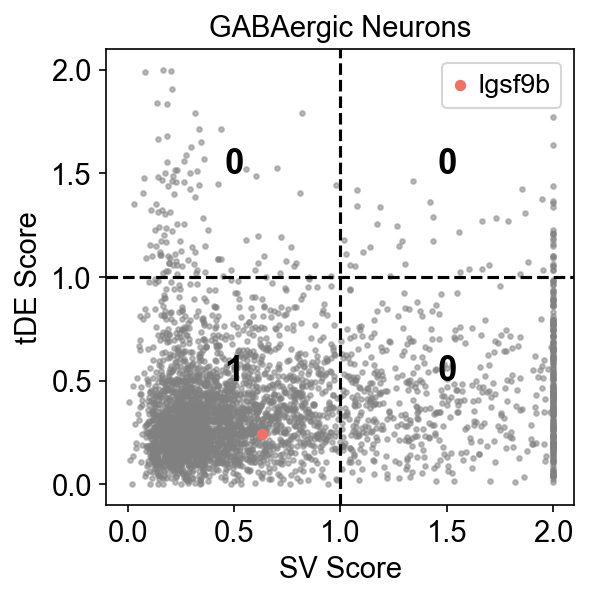

In [11]:
plot_scatt(scatter_df=scatter_df_gab, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='GABAergic Neurons',db_list=['Igsf9b'], db_lab='Igsf9b')

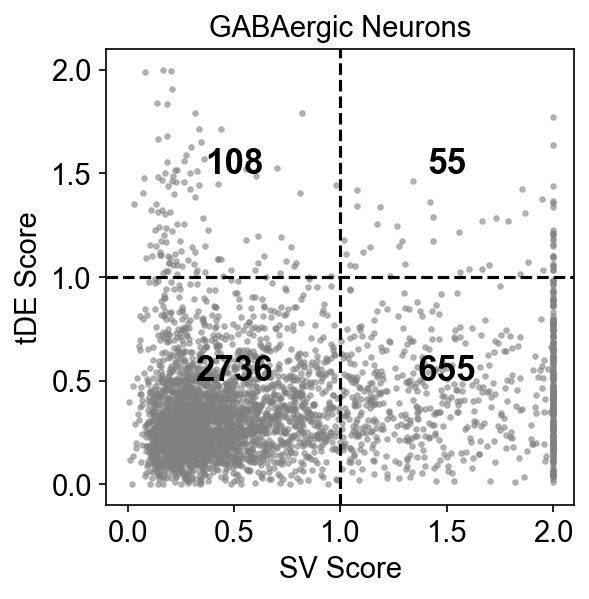

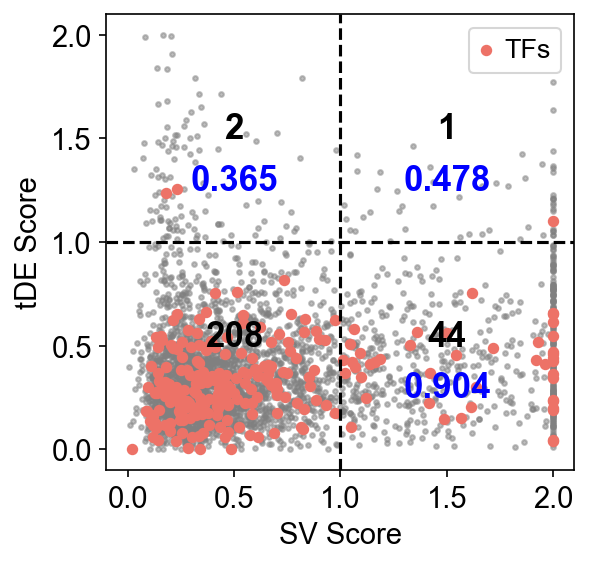

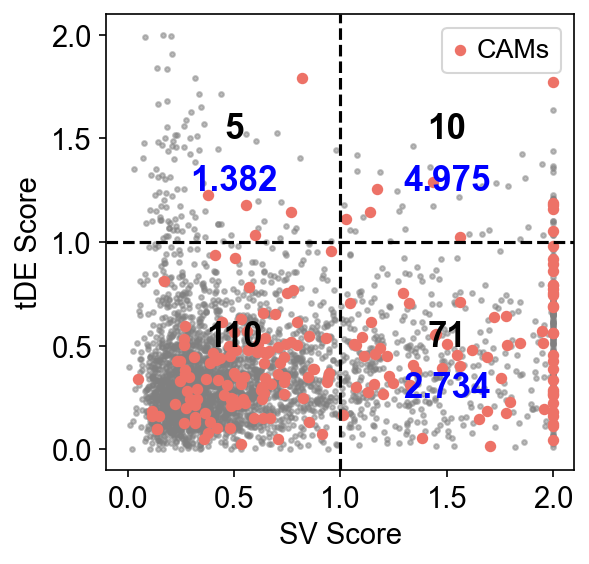

In [12]:
plot_scatt(scatter_df=scatter_df_gab, maxORmean='Max',xlim0=-0.1,ylim0=-0.1, xlim_=2.1, ylim_=2.1,titl='GABAergic Neurons',
          save='Fig2B_gaba.pdf')

plot_scatt(scatter_df=scatter_df_gab, maxORmean='Max',  db_list=tfs, db_lab='TFs', xlim_=2.1, ylim_=2.1,
          xlim0=-0.1,ylim0=-0.1,enrich=True)
plot_scatt(scatter_df=scatter_df_gab, maxORmean='Max', db_list=csms, db_lab='CAMs',xlim_=2.1, ylim_=2.1,
          xlim0=-0.1,ylim0=-0.1,enrich=True)

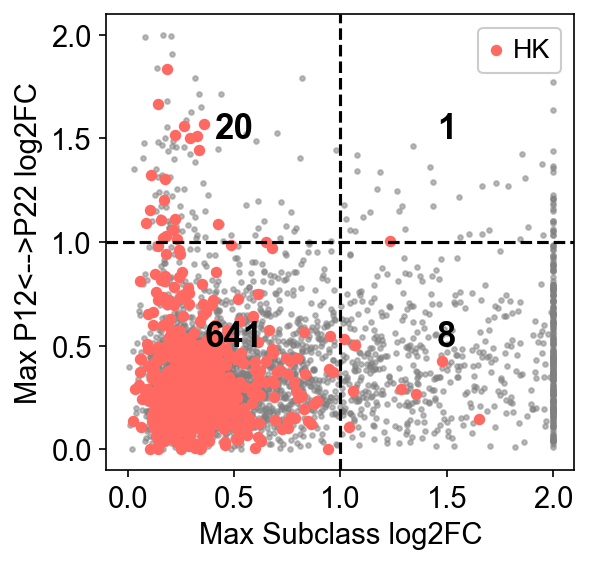

In [71]:
quads_HK = plot_scatt(scatter_df=scatter_df, maxORmean='Max', db_list=house, db_lab='HK',xlim_=2.1, ylim_=2.1,
          xlim0=-0.1,ylim0=-0.1,ret=True)

In [190]:
plot_scatt(scatter_df=scatter_df, maxORmean='Max', db_list=gpcrs, db_lab='GPCRs',xlim_=2.1, ylim_=2.1,
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=True)

NameError: name 'scatter_df' is not defined

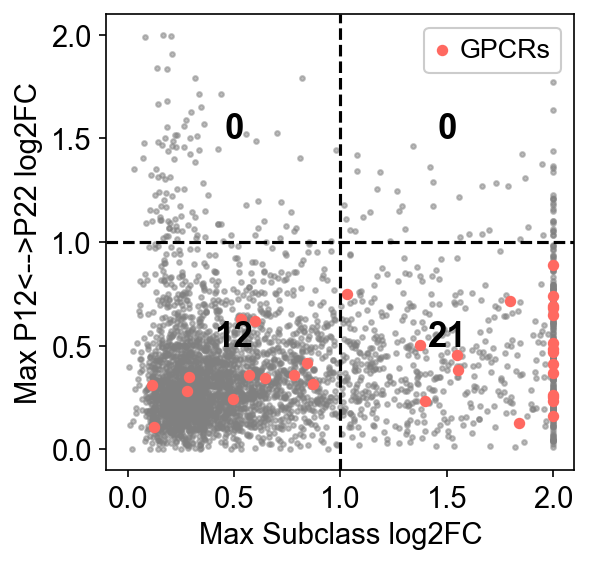

(Empty DataFrame
 Columns: [Subclass, Time]
 Index: [],
 Empty DataFrame
 Columns: [Subclass, Time]
 Index: [],
         Subclass      Time
 Gpr45   0.569381  0.359117
 Adgra1  0.869542  0.313885
 P2ry14  0.597205  0.621392
 Adgrl3  0.647479  0.345262
 Adgrb2  0.288851  0.346931
 Gabbr1  0.122018  0.107361
 Grm5    0.780847  0.360178
 Adgrb1  0.533925  0.627505
 Gpr162  0.115041  0.311890
 Lgr4    0.496101  0.241254
 Gabbr2  0.841312  0.414582
 Adgrl1  0.276660  0.279473,
         Subclass      Time
 Grm7    2.000000  0.412028
 Cnr1    2.000000  0.682014
 Grik3   2.000000  0.261783
 Grm8    2.000000  0.234798
 Gpr176  2.000000  0.470936
 Rxfp1   2.000000  0.690723
 Adra1a  2.000000  0.367359
 Htr2c   2.000000  0.649157
 Htr1f   1.551171  0.382714
 Adgra3  2.000000  0.163198
 Oprd1   2.000000  0.251065
 Adra1b  2.000000  0.482651
 Chrm3   2.000000  0.742281
 Grm3    1.375737  0.502662
 Adgrb3  1.546970  0.457063
 Grm1    2.000000  0.513553
 Htr2a   1.397987  0.231823
 Ogfrl1  1.796002  

In [73]:
plot_scatt(scatter_df=scatter_df, maxORmean='Max', db_list=gpcrs, db_lab='GPCRs',xlim_=2.1, ylim_=2.1,
          xlim0=-0.1,ylim0=-0.1,ret=True)

# tDE vs SV gluta

## Setup datasets

In [74]:
P12 = sc.read_h5ad('h5ads_cmprsd/P12Sham_glut_v2.h5ad')
P22 = sc.read_h5ad('h5ads_cmprsd/P22Sham_glut_v2.h5ad')

Generated in `P12vsP22-Sham_SavioDown.ipynb`

In [10]:
gluta = sc.read_h5ad('h5ads_cmprsd/gluta_P12+P22_DEready.h5ad')
gluta = gluta[gluta.obs.Sample!='S3']

1) Take all subclass-specific genes at P12 and P22. **x-axis**: subclass FC of each gene

2) grab each gene from above and loop thru P12-P22 DE results of each subclass, appending FC for that gene into a list

3) Take max of each gene's list. **y-axis**: max P12-P22 FC

## Compute subclass-specificity

**could even be type specificity**

In [76]:
P22 = P22[P22.obs.Sample!='S3']


In [77]:
P22.X, gluta.X

(<20880x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 64382388 stored elements in Compressed Sparse Row format>,
 <32639x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 103819987 stored elements in Compressed Sparse Row format>)

In [78]:
sub_markers = []
for i in P22.obs.Subclass.values.categories:
    a = DE(adata=P22, obs_id='Subclass', obs_id_test=i,ref='rest', pts_thresh=0.4, lf_thresh=0)
    a[a.columns[0]+'_P12'] = a[a.columns[0]]
    del a[a.columns[0]]
    b = DE(adata=P12, obs_id='Subclass', obs_id_test=i,ref='rest', pts_thresh=0.4, lf_thresh=0)
    b[b.columns[0]+'_P22'] = b[b.columns[0]]
    del b[b.columns[0]]
    
    sub_markers.append(a)
    sub_markers.append(b)

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
524 537
522 523


In [79]:
sub_markers[0]

,LF,p_adj,L2/3_P12
Gpc6,3.419311,0.000000,0.966239
Stard8,3.043852,0.000000,0.435965
B230216N24Rik,2.871963,0.000000,0.596401
Lrrtm4,2.786450,0.000000,1.000000
Klhl1,2.705939,0.000000,0.592913
...,...,...,...
Nsmce2,0.001289,0.977001,0.615932
Epn2,0.001081,0.982782,0.522879
Slc22a17,0.000941,0.981080,0.730748
Nr6a1,0.000465,0.991460,0.711496


In [80]:
all_markers = []
for i in sub_markers:
    all_markers = all_markers + list(i.index)

In [81]:
len(all_markers), len(set(all_markers))

(27413, 4611)

In [82]:
all_markers = list(set(all_markers))

In [83]:
subDE_df = pd.concat(sub_markers)

In [84]:
subDE_df.to_csv('Figure2_dfs/subDE_df_glut.csv',)

In [85]:
len(set(subDE_df.index))

4611

Explain `subDE_df`. Each subclass name column tells you if the gene came up as DE in that subclass or not. Then the LF in each row corresponds to the non-NaN LF valued subclass.

## Compute P12-P22 DE

In [11]:
gluta.X

<32639x21258 sparse matrix of type '<class 'numpy.float32'>'
	with 103819987 stored elements in Compressed Sparse Row format>

In [12]:
gluta_dict_P12 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:
    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=0)
    #df = df[df['LF']<4]
    #gluta_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    gluta_dict_P12[i+'_P12'] = df

del df
gluta_dict_P22 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:

    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=0)
    
    #df = df[df['LF']<4]
    #gluta_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    gluta_dict_P22[i+'_P22'] = df

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
69 267
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
13 151


Go thru each of the subclass marker genes and grab its FCs for P12<-->P22 analysis across all subclasses

In [88]:
marker_plus_tDE_dict = {}
for j in all_markers:
    marker_tDE = []
    for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:
        df1 = gluta_dict_P12[i+'_P12']
        df2 = gluta_dict_P22[i+'_P22']
        LX_tDE = pd.concat([df1, df2])
        
        if (j in LX_tDE.index):
            marker_tDE.append(LX_tDE.loc[j]['LF'])
    
    #give genes that are not tDE a log2FC = 0, which is a linear FC of 1, which is no change
    if (len(marker_tDE)==0):
        marker_tDE.append(0)
    
    #add each gene's list to the dict
    marker_plus_tDE_dict[j] = marker_tDE

## Scatter plot

Get each gene's max subclass specificity FC and its max tDE FC

In [89]:
scatter_df

,Subclass,Time
Luc7l3,0.767264,0.156371
Satb1,2.000000,0.192215
Gm20275,0.269464,0.265227
Rap1gds1,0.389251,0.189883
Fam222b,0.377866,0.345575
...,...,...
Capn15,0.333397,0.616379
Edf1,0.295112,0.538794
Fam168a,0.474732,0.367949
Ankfy1,0.211448,0.074672


In [90]:
del scatter_df

In [91]:
x = []
y = []
scatter_df_glut = {}
for i in all_markers:
    x = np.max(subDE_df[subDE_df.index==i]['LF']) #find gene of interest and take max subclass FC from DE
    y = np.max(marker_plus_tDE_dict[i])
    scatter_df_glut[i] = [x,y]
scatter_df_glut = pd.DataFrame(scatter_df_glut, index=['Subclass', 'Time']).transpose()


In [93]:
scatter_df_glut = scatter_df_glut.clip(upper=2)

In [96]:
scatter_df_glut.to_csv('Figure2_dfs/scatter_df_max_gluta.csv',)

In [3]:
scatter_df_glut = pd.read_csv('Figure2_dfs/scatter_df_max_gluta.csv', index_col=0)

In [5]:
scatter_df_glut.loc['Igsf9b']

Subclass    1.731377
Time        1.888030
Name: Igsf9b, dtype: float64

In [19]:
scatter_df_glut.to_excel('Tables/TableS2.xlsx', sheet_name='tDEvsSV-Gluta')

In [14]:
len(tfs)

1860

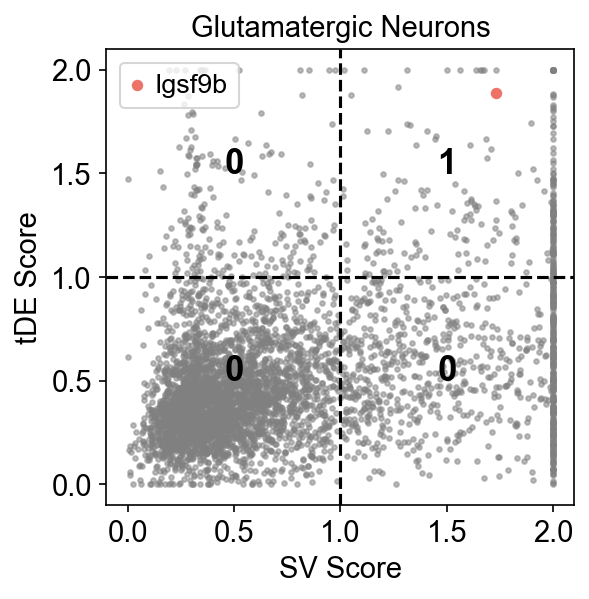

In [9]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='Glutamatergic Neurons',db_list=['Igsf9b'], db_lab='Igsf9b')

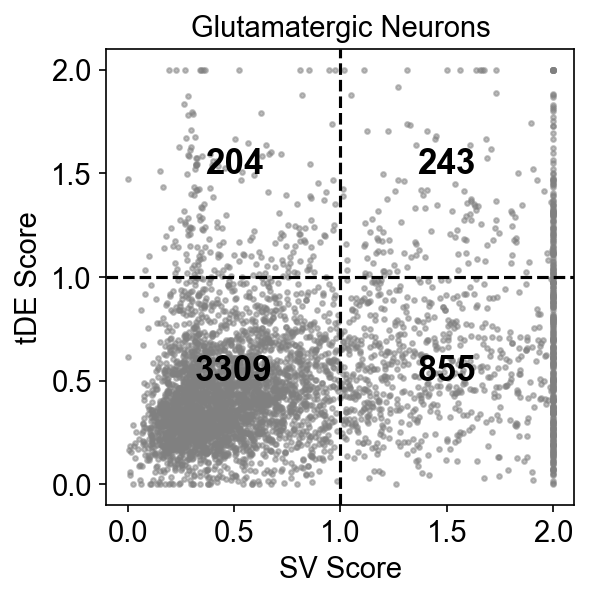

In [15]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='Glutamatergic Neurons', save='Fig2D_glut.pdf')

In [150]:
5761/1213, 5761/555, 5761/482

(4.749381698268755, 10.38018018018018, 11.952282157676349)

In [151]:
#CSMs

165/88, 165/50, 165/16

(1.875, 3.3, 10.3125)

In [155]:
#TFs

503/88, 503/22, 503/33

(5.715909090909091, 22.863636363636363, 15.242424242424242)

In [154]:
#CSMs
np.array([4.749381698268755, 10.38018018018018, 11.952282157676349])/np.array([1.875, 3.3, 10.3125])

array([2.53300357, 3.14550915, 1.15900918])

In [156]:
np.array([4.749381698268755, 10.38018018018018, 11.952282157676349])/np.array([(5.715909090909091, 22.863636363636363, 15.242424242424242)])

array([[0.83090574, 0.4540039 , 0.78414575]])

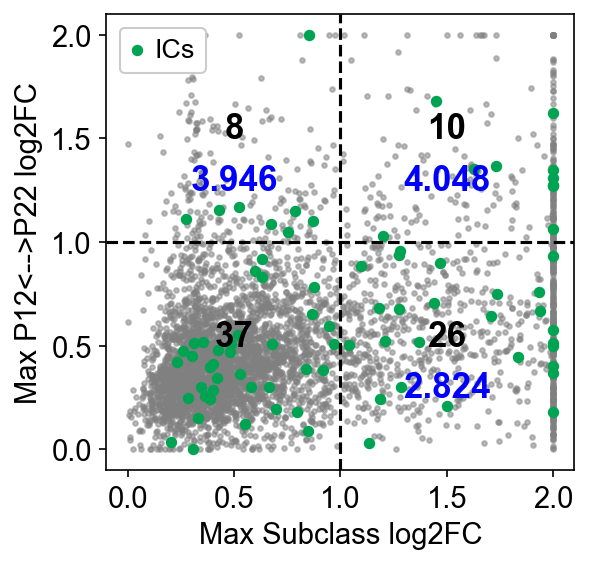

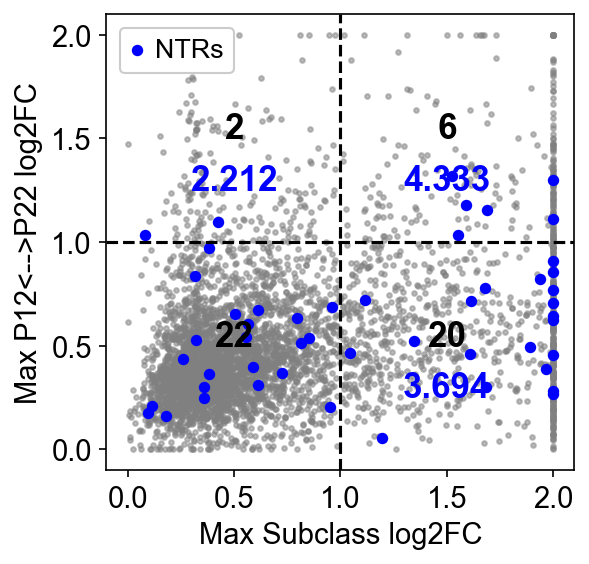

In [109]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=ics, db_lab='ICs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#00A351')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=ntr, db_lab='NTRs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='blue')

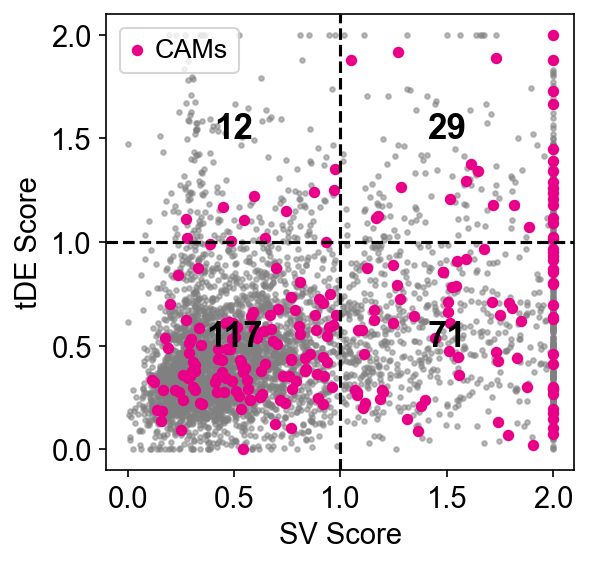

In [17]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=csms, db_lab='CAMs',
          xlim0=-0.1,ylim0=-0.1,enrich=None, db_color='#E90089')

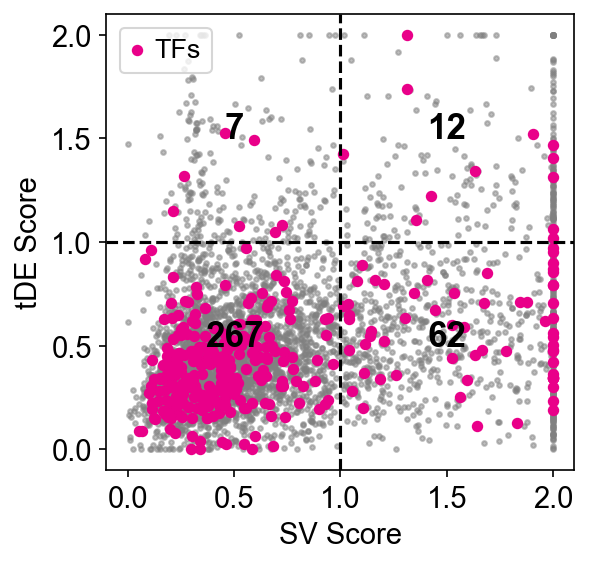

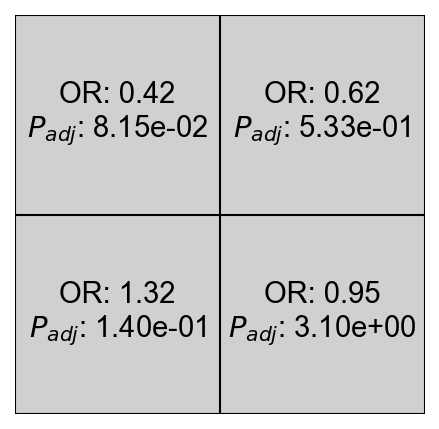

[243, 204, 3309, 855] [12, 7, 267, 62]


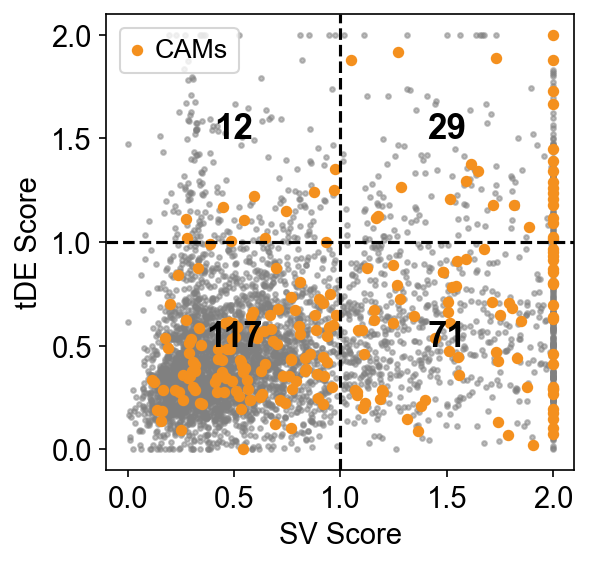

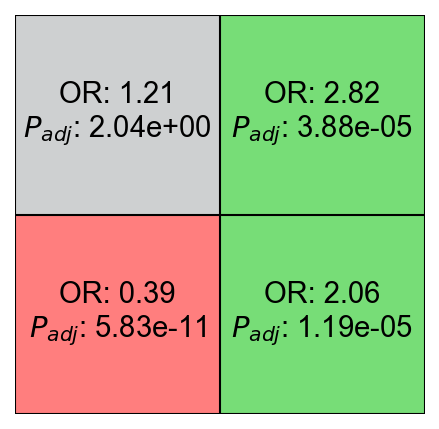

[243, 204, 3309, 855] [29, 12, 117, 71]


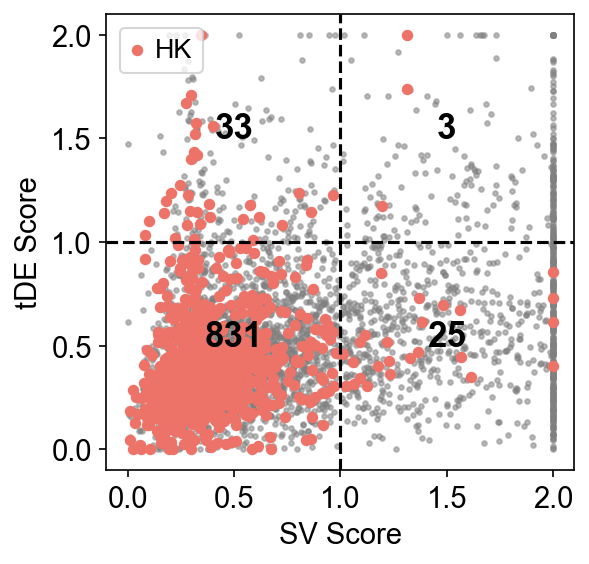

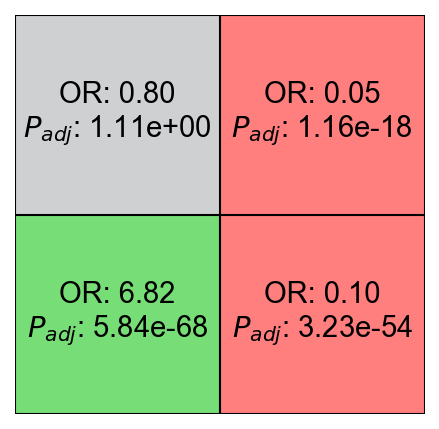

[243, 204, 3309, 855] [3, 33, 831, 25]


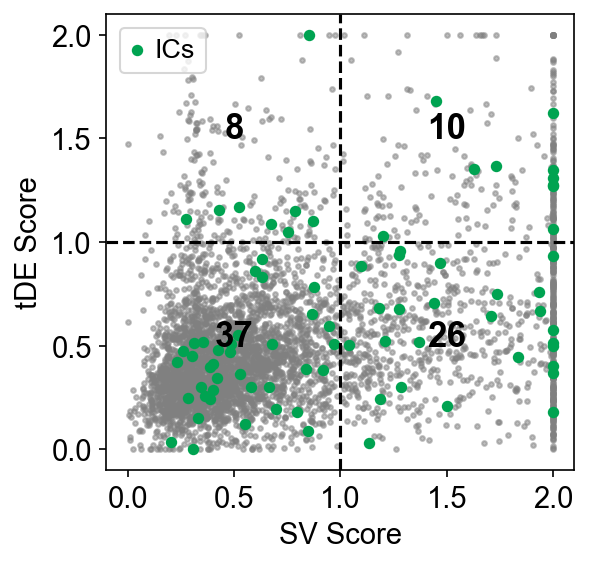

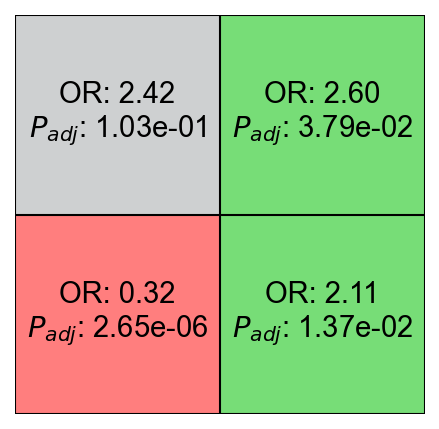

[243, 204, 3309, 855] [10, 8, 37, 26]


In [166]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=tfs, db_lab='TFs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#E90089', save='Fig2-TFs.pdf')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=csms, db_lab='CAMs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#F4901E', save='Fig2-CAMs.pdf')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=house, db_lab='HK',
          xlim0=-0.1,ylim0=-0.1,enrich=True, save='Fig2-HKs.pdf')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=ics, db_lab='ICs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#00A351', save='Fig2-ICs.pdf')

In [158]:
import matplotlib.patches as patches

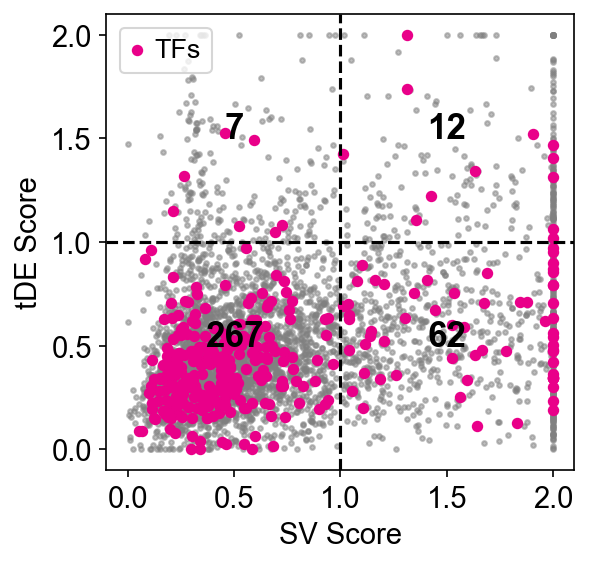

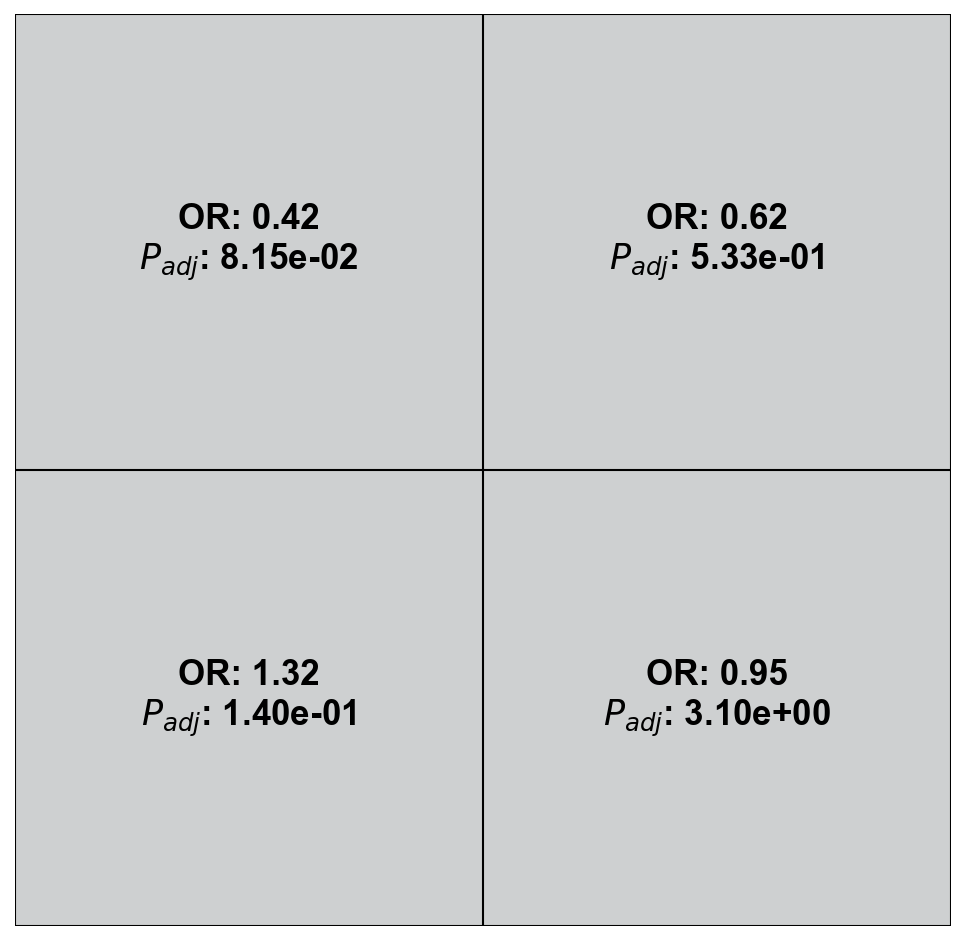

[243, 204, 3309, 855] [12, 7, 267, 62]


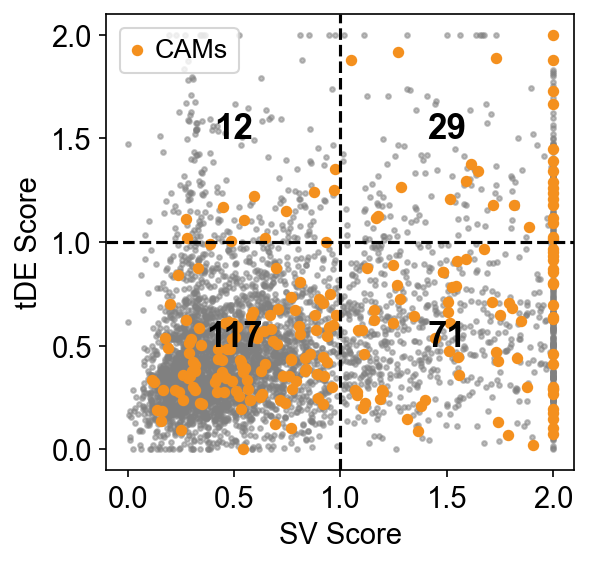

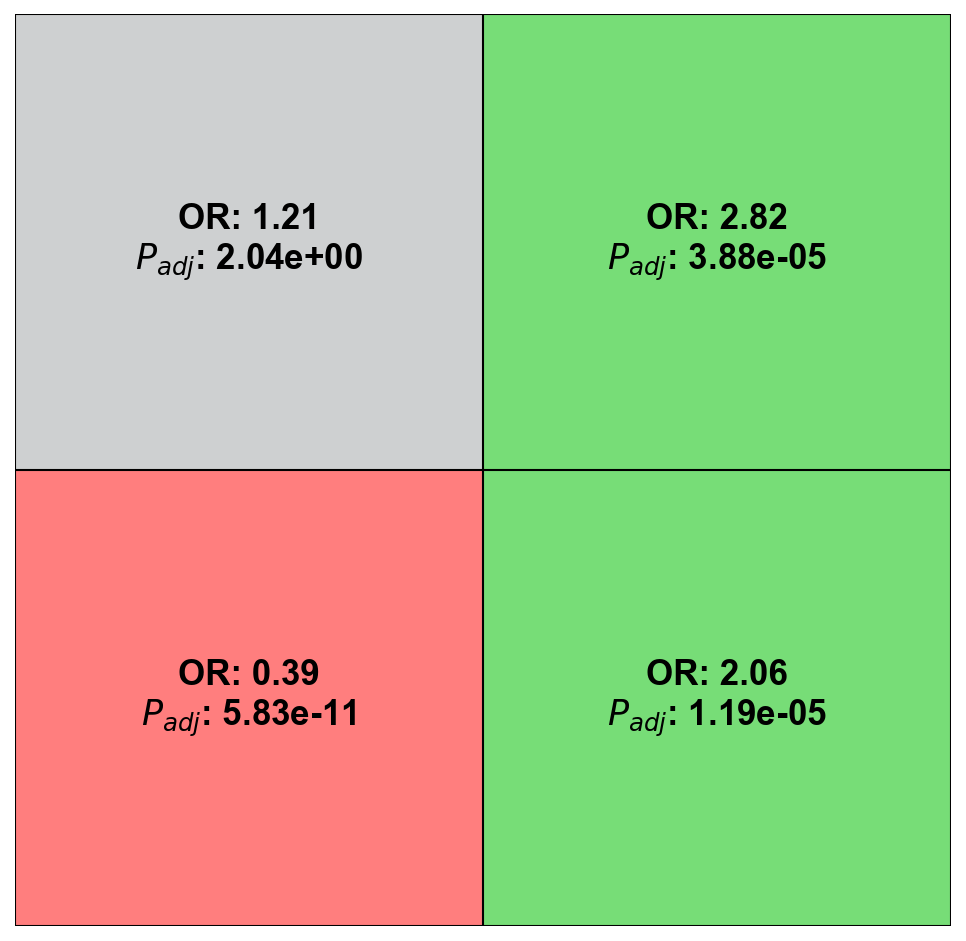

[243, 204, 3309, 855] [29, 12, 117, 71]


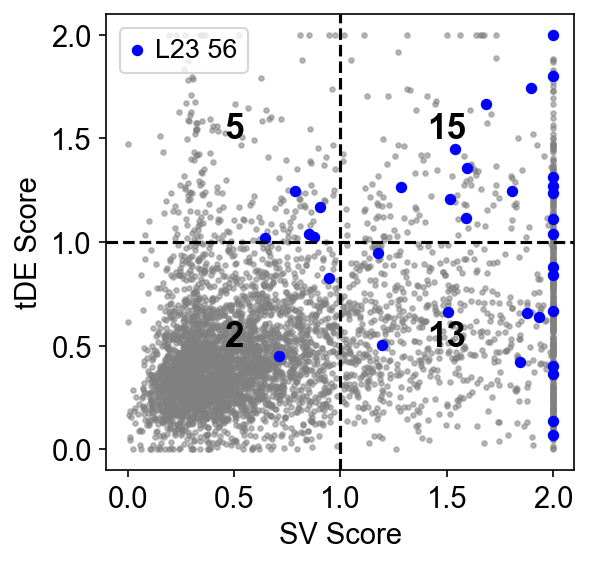

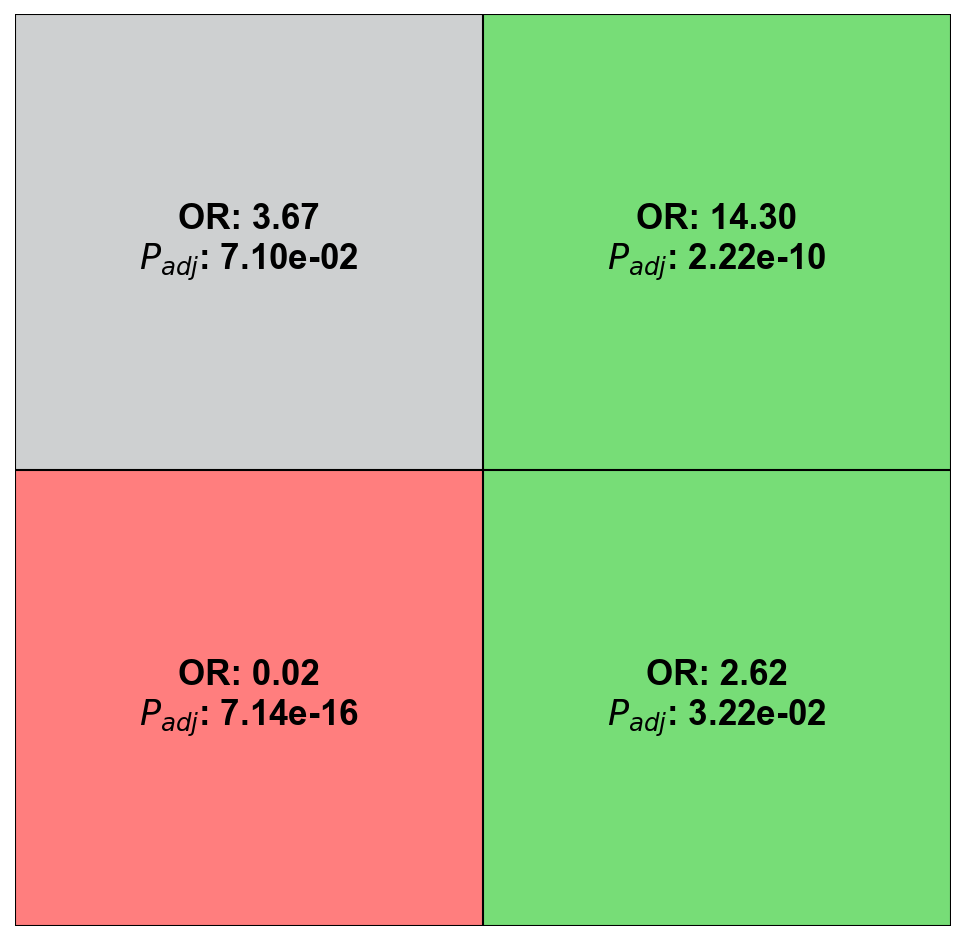

[243, 204, 3309, 855] [15, 5, 2, 13]


In [159]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=tfs, db_lab='TFs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#E90089')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=csms, db_lab='CAMs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='#F4901E')
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=L23_genes, db_lab='L23 56',
          xlim0=-0.1,ylim0=-0.1,enrich=True, db_color='blue')

In [ ]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=gpcrs, db_lab='GPCRs',
          xlim0=-0.1,ylim0=-0.1,enrich=True)

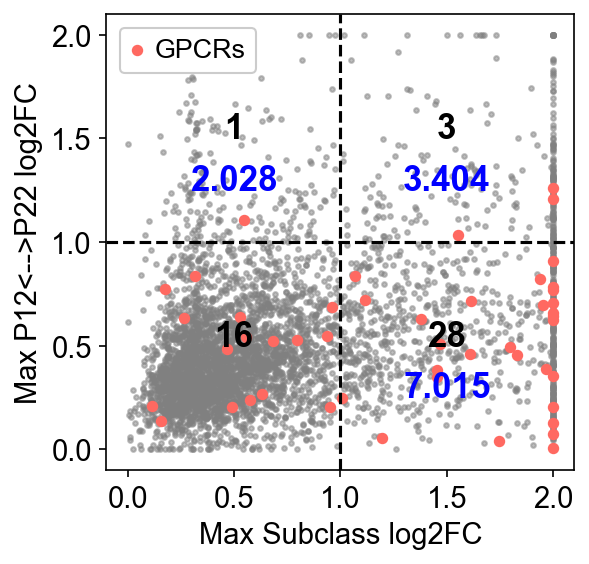

In [101]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=gpcrs, db_lab='GPCRs',
          xlim0=-0.1,ylim0=-0.1,enrich=True)

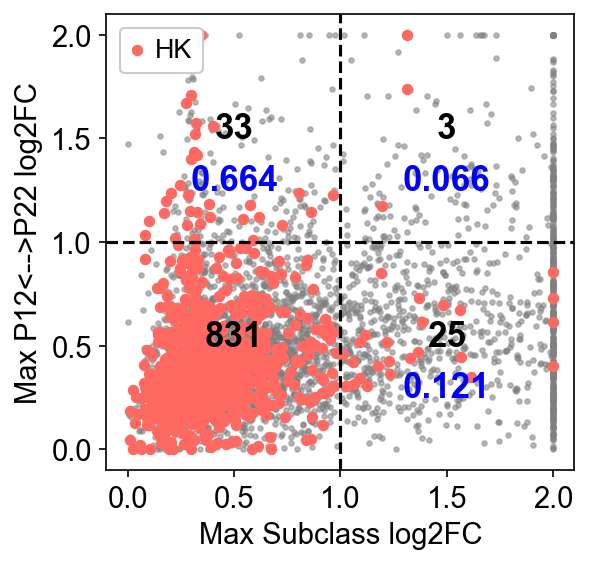

In [104]:
plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=house, db_lab='HK',
          xlim0=-0.1,ylim0=-0.1,enrich=True)

In [187]:
rps = []
for i in house:
    if(i.startswith('Rp') or i.startswith('mt')):
        rps.append(i)

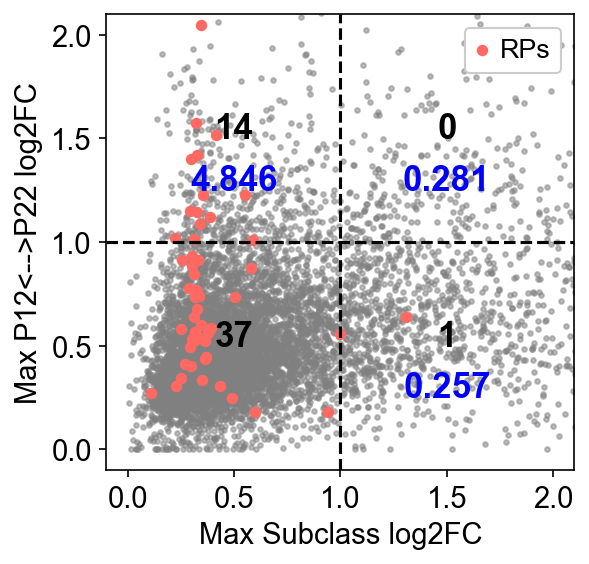

In [188]:
quads_rp = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=rps, db_lab='RPs',
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=True)

In [271]:
quads_rp[1]

,Subclass,Time
Rps17,0.351717,1.228392
Rps29,0.319950,1.576238
Rpl30,0.310164,1.016296
Rpl38,0.324780,1.421881
Rps6kb2,0.587091,1.008143
Rplp1,0.324889,1.146410
Rpl35,0.417135,1.515664
Rpl41,0.344380,2.000000
Rplp2,0.296626,1.402546
Rpl34,0.293330,1.149361


### UpSet genes

In [64]:
with open('Figure2_dfs/Fig2_glugab12.pkl', 'rb') as file:
    glugab12 = pickle.load(file)

In [65]:
glugab12

{'L2/3_P12':              P12        LF          p_adj
 Cdh13   0.787228  3.062929   0.000000e+00
 Rhbdl3  0.483622  2.745738  5.592174e-286
 Sfmbt2  0.434627  2.738110  6.819181e-256
 Gpc5    0.951005  2.603544   0.000000e+00
 Sema6a  0.653454  2.263903   0.000000e+00
 ...          ...       ...            ...
 Elob    0.506468  1.026720   1.227516e-90
 Asxl3   0.606111  1.023996  5.906031e-121
 Gap43   0.738783  1.019001  1.352622e-162
 Neo1    0.802918  1.017819  2.128802e-191
 Garnl3  0.868153  1.004577  1.661459e-221
 
 [88 rows x 3 columns],
 'L4_P12':                     P12        LF          p_adj
 Tmsb10         0.498329  2.346311  1.767756e-277
 Uqcr11         0.783492  2.137739   0.000000e+00
 Plppr1         0.565441  1.908028  8.987624e-263
 Ndufa1         0.488300  1.906255  1.864449e-217
 Atp5mpl        0.549499  1.875770  3.624059e-244
 ...                 ...       ...            ...
 Sh3d19         0.516585  1.026842   1.525161e-96
 Lrrtm4         0.993572  1.008939  

In [66]:
glugab12.keys()

dict_keys(['L2/3_P12', 'L4_P12', 'L5IT_P12', 'L5NP_P12', 'L5PT_P12', 'L6CT_P12', 'L6IT_P12', 'L6b_P12', 'Pvalb_P12', 'Sst_P12', 'Vip_P12', 'Lamp5_P12'])

In [68]:
for i in ['Pvalb_P12', 'Sst_P12', 'Vip_P12', 'Lamp5_P12']:
    del glugab12[i]

Text(0.5, 0.98, 'Exc Subclasses: P12>P22')

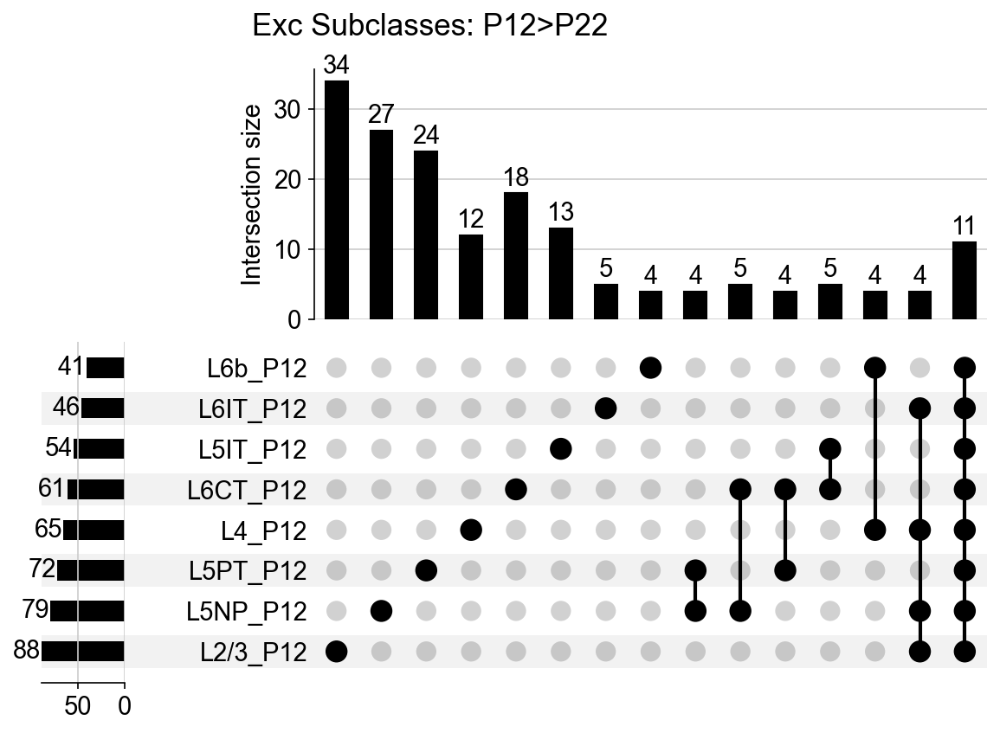

In [69]:
contents=dict()
for i in glugab12:
    contents[i]=list(glugab12[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True, min_subset_size=4)
plt.suptitle('Exc Subclasses: P12>P22')

In [72]:
34+27+24+12+18+13+5+4

137

In [71]:
sum([4, 5, 13, 18, 12, 24, 27, 34])

137

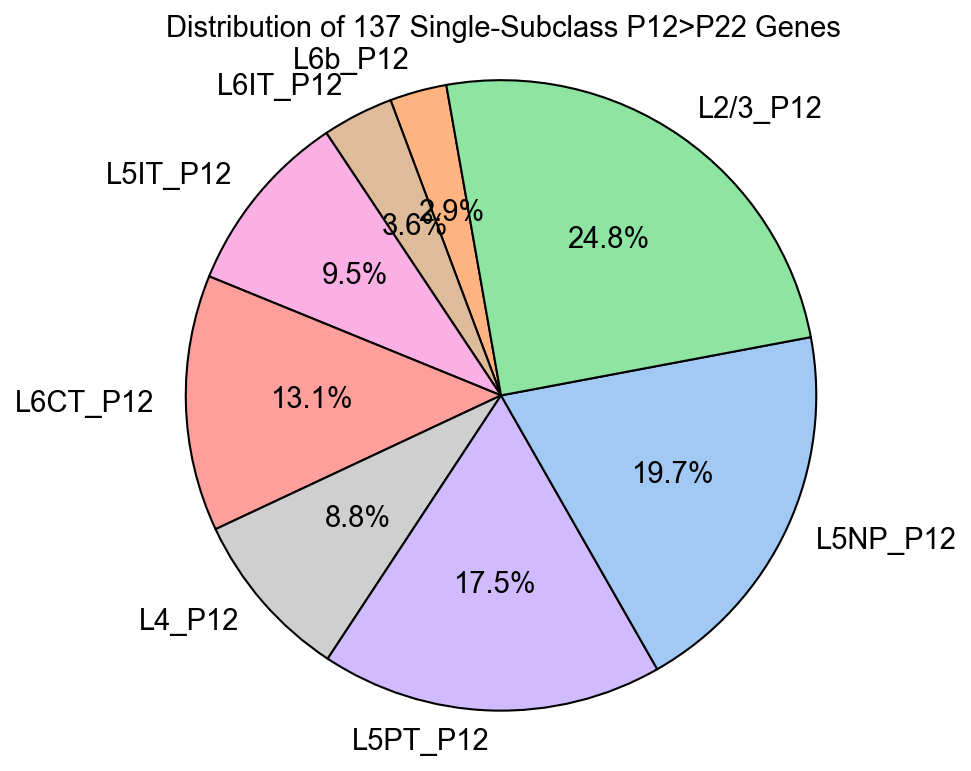

In [74]:
import matplotlib.pyplot as plt

unique_sizes = [4, 5, 13, 18, 12, 24, 27, 34]
labels = ['L6b_P12', 'L6IT_P12', 'L5IT_P12', 'L6CT_P12', 'L4_P12', 'L5PT_P12', 'L5NP_P12', 'L2/3_P12']

plt.figure(figsize=(6, 6))
plt.pie(unique_sizes, labels=labels,autopct='%1.1f%%', 
        startangle=100,colors=['#ffb482', '#debb9b',  '#fab0e4', '#ff9f9b', '#cfcfcf', '#d0bbff',
       '#a1c9f4', '#8de5a1',], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Distribution of 137 Single-Subclass P12>P22 Genes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [78]:
singular = []
shared_all = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true==8):
        shared_all.append(gene_name)

In [79]:
len(singular)

137

In [80]:
len(shared_all)

11

In [83]:
for i in shared_all:
    print(i)

Plppr1
Uqcr11
Ndufa1
Atp5e
Tubb2a
Atp5md
Cox7a2
Cox6b1
Ndufa4
Cox6c
Tuba1a


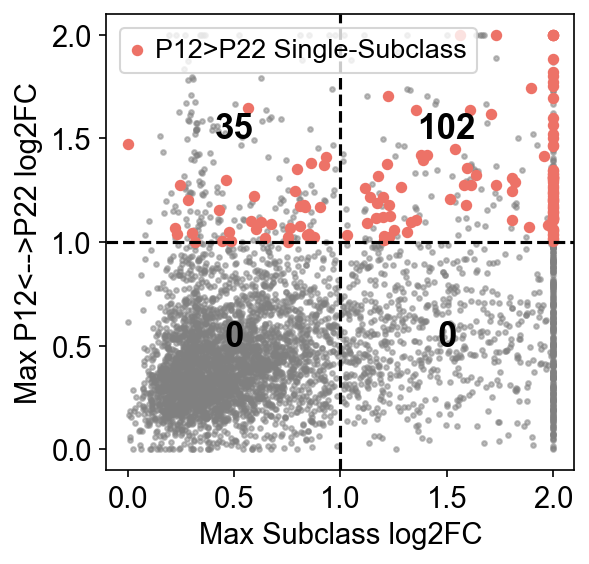

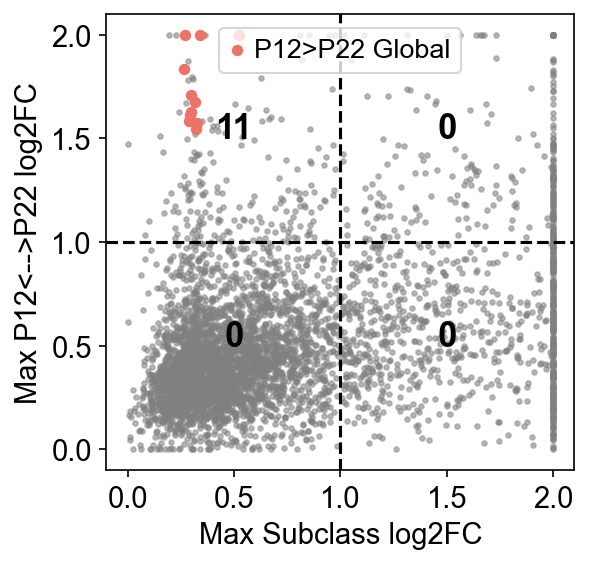

In [81]:
quads_P12sing = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=singular, db_lab='P12>P22 Single-Subclass',
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=None)
quads_P12sing = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=shared_all, db_lab='P12>P22 Global',
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=None)

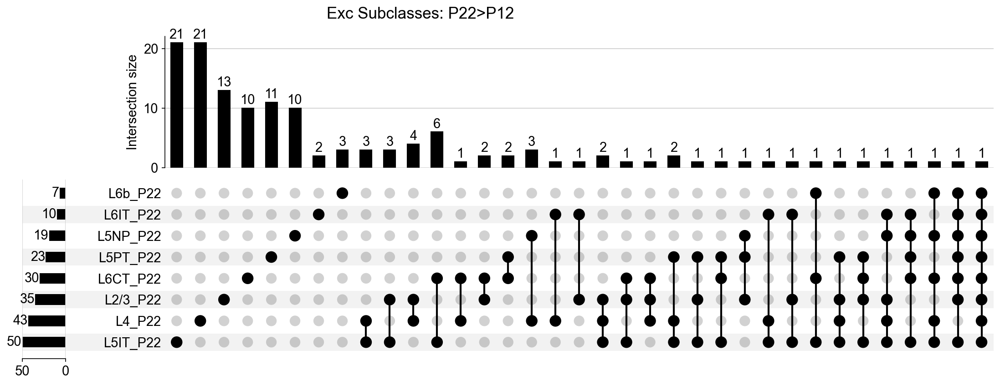

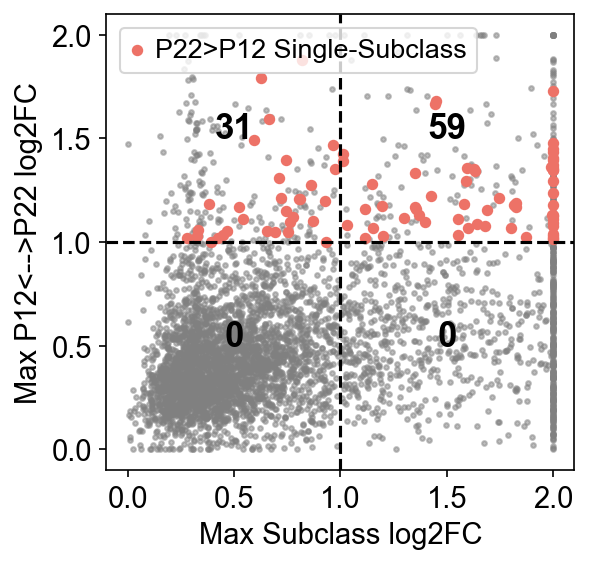

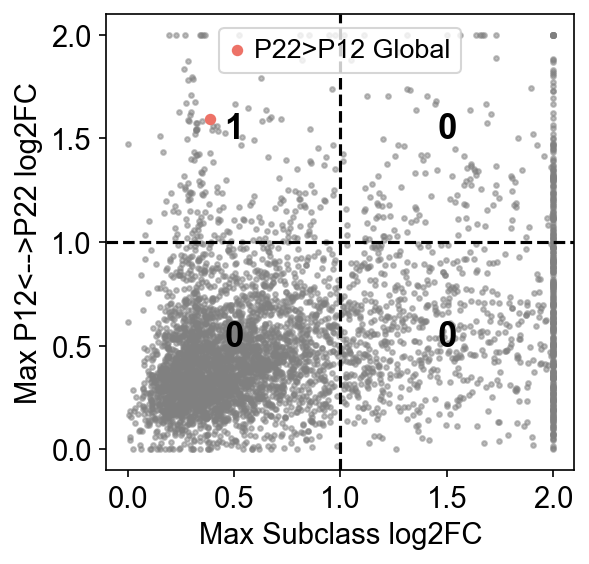

In [88]:
with open('Figure2_dfs/Fig2_glugab22.pkl', 'rb') as file:
    glugab22 = pickle.load(file)

glugab22

glugab22.keys()

for i in ['Pvalb_P22', 'Sst_P22', 'Vip_P22', 'Lamp5_P22']:
    del glugab22[i]

contents=dict()
for i in glugab22:
    contents[i]=list(glugab22[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True, min_subset_size=1)
plt.suptitle('Exc Subclasses: P22>P12')
plt.show()
singular = []
shared_all = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true==8):
        shared_all.append(gene_name)

len(singular)

quads_P22sing = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=singular, db_lab='P22>P12 Single-Subclass',
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=None)
quads_P22share = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=shared_all, db_lab='P22>P12 Global',
          xlim0=-0.1,ylim0=-0.1,ret=True, enrich=None)

In [85]:
len(singular)

91

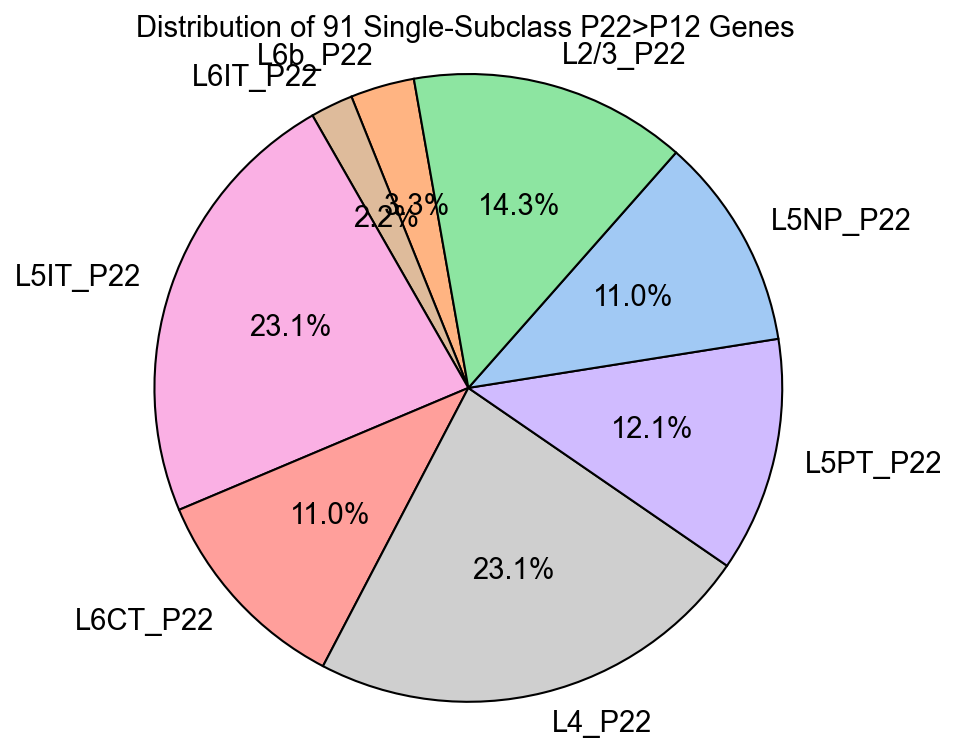

In [89]:
unique_sizes = [3, 2, 21,  10,
                    21,  11, 10, 13, ]
labels = ['L6b_P22', 'L6IT_P22', 'L5IT_P22' ,'L6CT_P22',
              'L4_P22' ,  'L5PT_P22','L5NP_P22', 'L2/3_P22', ]


# Create a pie plot
plt.figure(figsize=(6, 6))
plt.pie(unique_sizes, labels=labels,autopct='%1.1f%%', 
        startangle=100,colors=['#ffb482', '#debb9b',  '#fab0e4', '#ff9f9b', '#cfcfcf', '#d0bbff',
       '#a1c9f4', '#8de5a1',], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Distribution of 91 Single-Subclass P22>P12 Genes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie plot
plt.show()

### L2/3 markers 

In [254]:
L23_P22 = sc.read_h5ad('h5ads_cmprsd/P22_L23.h5ad')

In [255]:
L23_P22 = L23_P22[L23_P22.obs.Sample!='S3']

In [263]:
L23_P22_marks = []
for i in L23_P22.obs['Type'].values.categories:
    L23_P22_marks.append(DE(L23_P22,obs_id='Type', obs_id_test=i, ref='rest', 
                            pts_thresh=0.2, lf_thresh=1))

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


In [264]:
marks = list(L23_P22_marks[0].index)+list(L23_P22_marks[1].index)+list(L23_P22_marks[2].index)

In [265]:
len(marks)

188

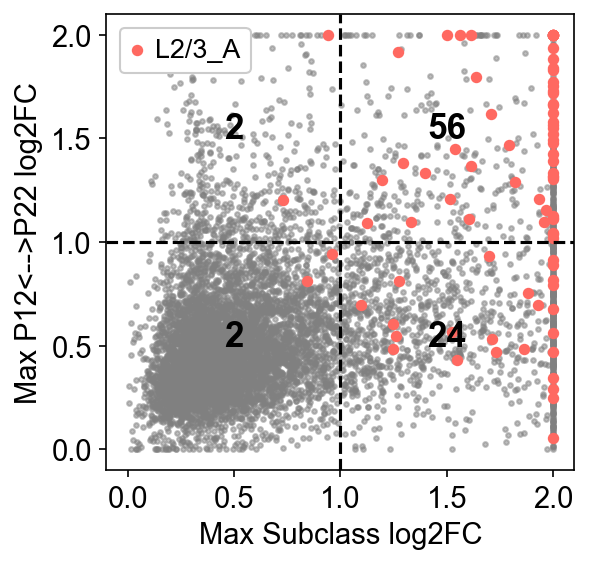

In [266]:
quads_A = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,
                            db_list=list(L23_P22_marks[0].index),
                            db_lab='L2/3_A',
          xlim0=-0.1,ylim0=-0.1,ret=True)

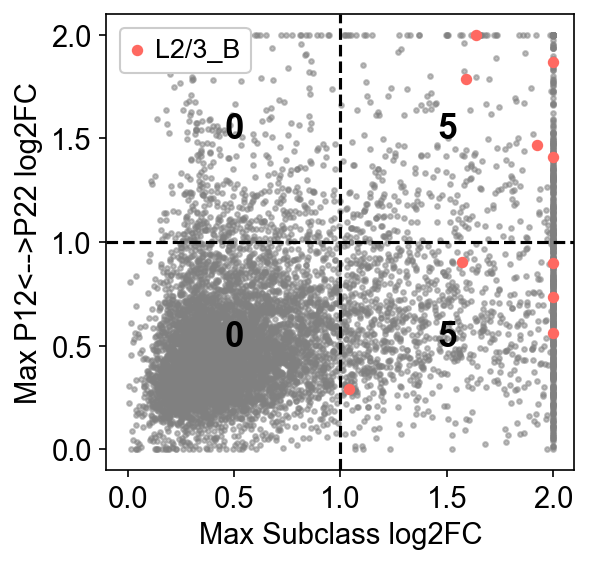

In [267]:
quads_B = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,
                            db_list=list(L23_P22_marks[1].index),
                            db_lab='L2/3_B',
          xlim0=-0.1,ylim0=-0.1,ret=True)

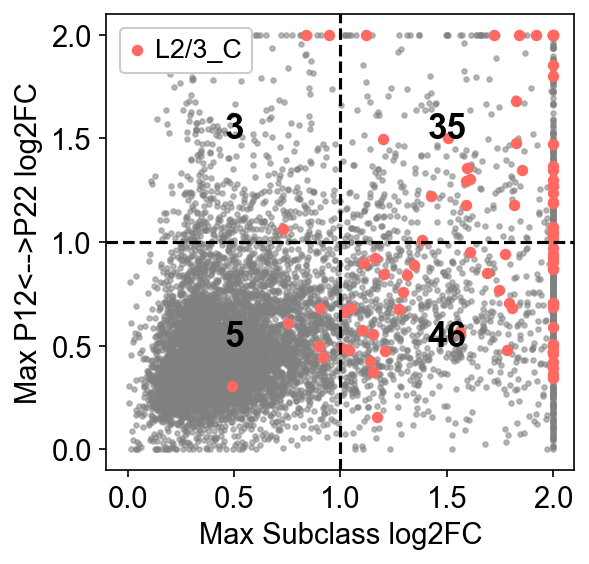

In [268]:
quads_C = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,
                            db_list=list(L23_P22_marks[2].index),
                            db_lab='L2/3_C',
          xlim0=-0.1,ylim0=-0.1,ret=True)

## Test expression

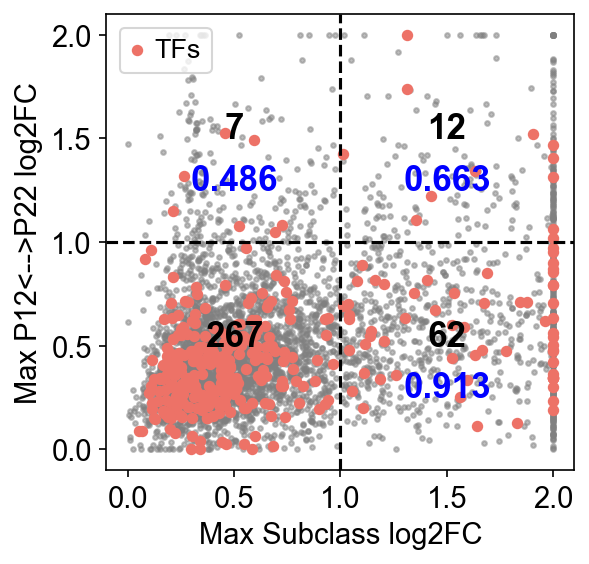

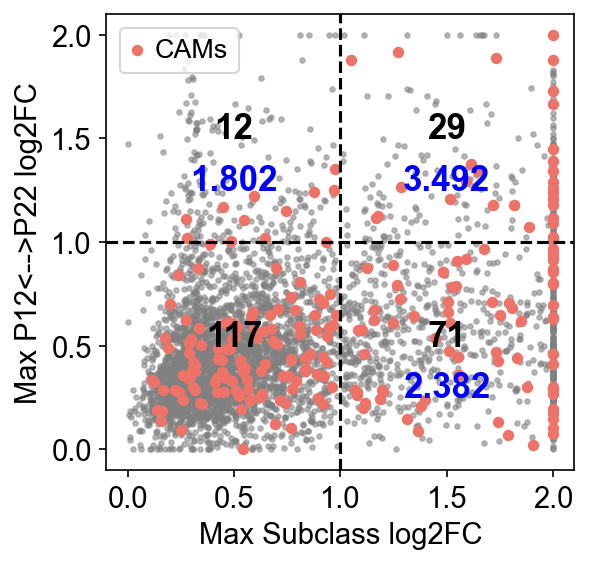

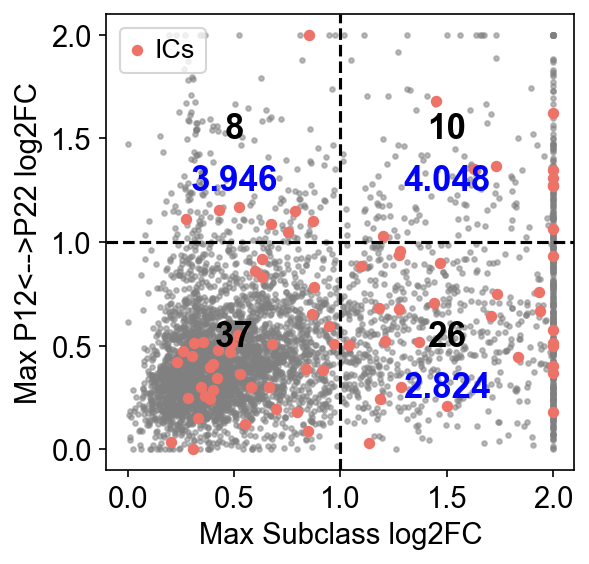

In [173]:
TFs_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=tfs, db_lab='TFs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, ret_dbs=True)
csms_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=csms, db_lab='CAMs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, ret_dbs=True)
ics_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=ics, db_lab='ICs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, ret_dbs=True)

In [204]:
L23_tDE_genes['Gene'].values

array(['Eda', 'Pitpnc1', 'Sfmbt2', 'Epha10', 'Gabrg3', 'Sgcz', 'Rhbdl3',
       'Shisa4', 'Gm16083', 'Thsd7a', 'Npnt', 'Garnl3', 'Klhl1', 'Cntn5',
       'Ryr3', 'Cpne8', 'Gm20713', 'Sntb2', 'Mdga1', 'Gsg1l',
       '6530403H02Rik', 'Cdh13', 'Sorcs3', 'Met', 'Prickle1', 'Fam126a',
       'Nkain3', 'Sgcd', 'Mgll', 'Etl4', 'Arhgef28', 'Ust', 'Tsnax',
       'Utrn', 'Zbtb16', 'Gm28376', 'Rfx3', 'Gab2', 'Gpc5', 'Dgkb',
       'Smad3', 'Nckap5', 'Gm50304', 'Gm33228', 'Raver2', 'Tenm1', 'Grm3',
       'Ano4', 'Nrip3', 'Vwc2l', 'Ccbe1', 'Elmo1', 'Lrch1', 'Stard8'],
      dtype=object)

In [202]:
'Gabrg3' in L23_tDE_genes['Gene'].values, 'Sorcs3' in L23_tDE_genes['Gene'].values, 'Col19a1' in L23_tDE_genes['Gene'].values

(True, True, False)

In [208]:
L23_tDE_genes['Gene'].values

array(['Eda', 'Pitpnc1', 'Sfmbt2', 'Epha10', 'Gabrg3', 'Sgcz', 'Rhbdl3',
       'Shisa4', 'Gm16083', 'Thsd7a', 'Npnt', 'Garnl3', 'Klhl1', 'Cntn5',
       'Ryr3', 'Cpne8', 'Gm20713', 'Sntb2', 'Mdga1', 'Gsg1l',
       '6530403H02Rik', 'Cdh13', 'Sorcs3', 'Met', 'Prickle1', 'Fam126a',
       'Nkain3', 'Sgcd', 'Mgll', 'Etl4', 'Arhgef28', 'Ust', 'Tsnax',
       'Utrn', 'Zbtb16', 'Gm28376', 'Rfx3', 'Gab2', 'Gpc5', 'Dgkb',
       'Smad3', 'Nckap5', 'Gm50304', 'Gm33228', 'Raver2', 'Tenm1', 'Grm3',
       'Ano4', 'Nrip3', 'Vwc2l', 'Ccbe1', 'Elmo1', 'Lrch1', 'Stard8'],
      dtype=object)

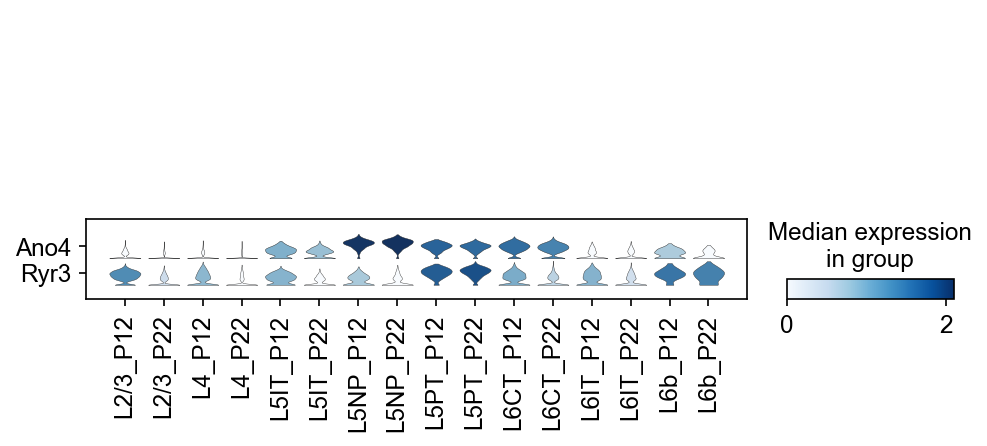

In [209]:
sc.pl.stacked_violin(gluta, var_names=list(set(ics).intersection(set(L23_tDE_genes['Gene'].values))),
                     groupby='Subclass_age', swap_axes=True,)

In [49]:
master_L23 = ['Tsnax', 'Rfx3', 'Etv1', #TFs
              'Cntn5', 'Mdga1', 'Tenm1', 'Cdh13', 'Epha10','Lrch1',#CSMs
             'Ryr3', #ICs
             'Col19a1', 'Sorcs3', 'Gabrg3', 'Klhl1', 'Gpc5', 'Cpne8',#Rest
             ]

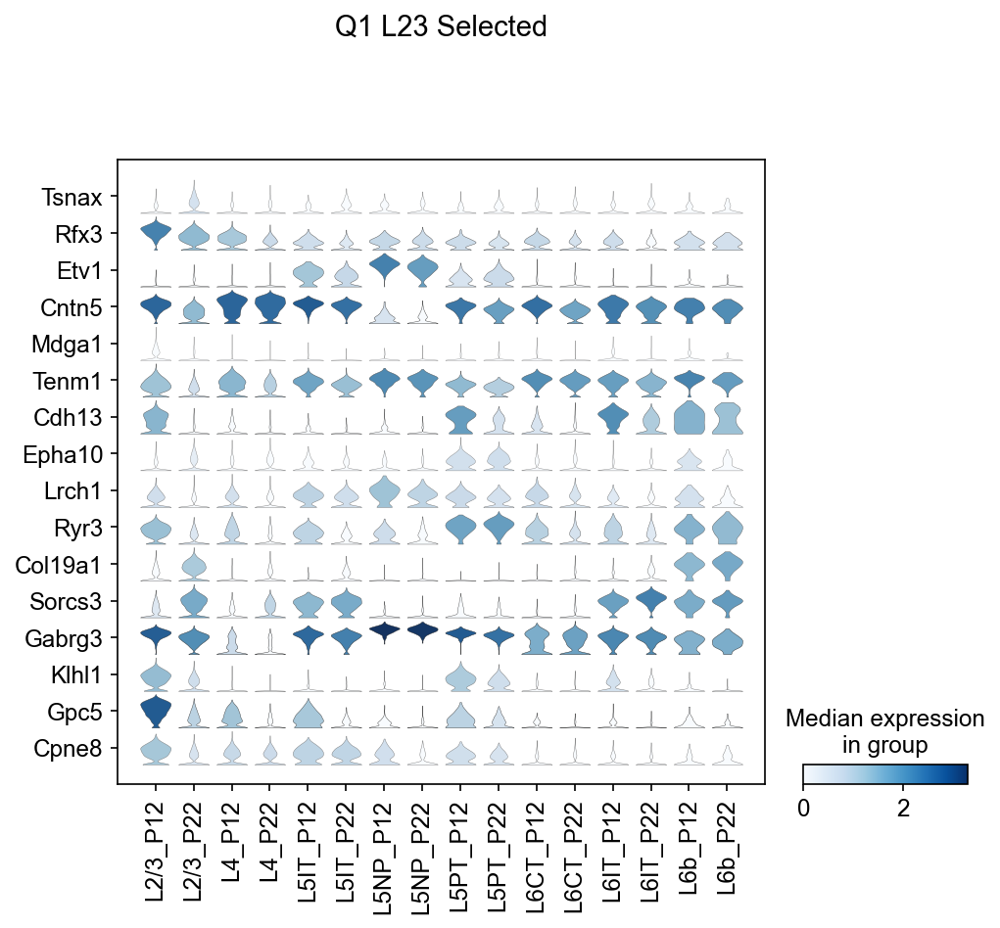

In [50]:
# from matplotlib.colors import ListedColormap
# mapcol = ListedColormap(sn.color_palette('light:#a31fe7', n_colors=100).as_hex())

sc.pl.stacked_violin(gluta, var_names=master_L23,
                     groupby='Subclass_age', swap_axes=True,
                    title='Q1 L23 Selected', save='_Q1-L23_Selected.pdf')

In [26]:
gluta_dict_P12 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:
    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=0)
    #df = df[df['LF']<4]
    #gluta_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    gluta_dict_P12[i+'_P12'] = df

del df
gluta_dict_P22 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:

    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=0)
    
    #df = df[df['LF']<4]
    #gluta_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    gluta_dict_P22[i+'_P22'] = df

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
69 267
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
13 151


In [ ]:
master_L23 = ['Tsnax', 'Rfx3',  #TFs
              'Cntn5', 'Mdga1', 'Tenm1', 'Cdh13', 'Epha10','Lrch1',#CSMs
             'Ryr3', #ICs
             'Col19a1', 'Sorcs3', 'Gabrg3', 'Klhl1', 'Gpc5', 'Cpne8',#Rest
             ]

In [27]:
re_master_L23 = ['Epha10',   'Col19a1','Tsnax', 'Sorcs3', 'Rfx3',
              'Mdga1', 'Tenm1',  'Lrch1',
               'Gabrg3', 'Klhl1',  'Cpne8', 'Ryr3', 'Cntn5','Gpc5', 'Cdh13'
             ]

In [33]:
gaba_dict_P12 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=0)
    #df = df[df['LF']<4]
    #gaba_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    gaba_dict_P12[i+'_P12'] = df
    
del df

gaba_dict_P22 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=0)  
    #df = df[df['LF']<4]
    #gaba_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    gaba_dict_P22[i+'_P22'] = df

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


In [34]:
gluta_dict_P12.update(gaba_dict_P12)
gluta_dict_P22.update(gaba_dict_P22)

In [41]:
p22_dict = {}
for g in re_master_L23:
    p22_dict[g] = []
    for i in gluta_dict_P22:
        df = gluta_dict_P22[i]
        
        if(g in df.index):
            p22_dict[g].append(gluta_dict_P22[i].loc[g]['LF'])
        else:
            p22_dict[g].append(0)

p22_df = pd.DataFrame(data=p22_dict).transpose()
p22_df.columns = list(gluta_dict_P22.keys())

In [42]:
p12_dict = {}
for g in re_master_L23:
    p12_dict[g] = []
    for i in gluta_dict_P12:
        df = gluta_dict_P12[i]
        
        if(g in df.index):
            p12_dict[g].append(-1*gluta_dict_P12[i].loc[g]['LF'])
        else:
            p12_dict[g].append(0)

p12_df = pd.DataFrame(data=p12_dict).transpose()
p12_df.columns = list(gluta_dict_P12.keys())

In [43]:
df_plt = pd.DataFrame(p22_df.to_numpy() + p12_df.to_numpy(), index=re_master_L23, 
             columns=['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 
                      'L6b', 'Pvalb', 'Sst', 'Vip', 'Lamp5'])

In [44]:
df_plt

,L2/3,L4,L5IT,L5NP,L5PT,L6CT,L6IT,L6b,Pvalb,Sst,Vip,Lamp5
Epha10,1.292301,0.855619,-0.396765,0.000000,0.133080,0.000000,0.000000,-0.608865,-0.553650,-0.453113,-0.921016,-0.299926
Col19a1,1.617732,0.000000,2.810476,0.000000,0.000000,0.000000,1.634728,0.283432,-0.198639,0.029844,0.000000,-0.595215
Tsnax,1.737047,0.000000,1.017944,0.000000,0.787764,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Sorcs3,1.869873,1.213853,0.370044,0.000000,-0.577207,0.000000,0.747917,0.394289,0.000000,0.000000,0.110234,0.089226
Rfx3,-1.315723,-0.943281,-0.749669,-0.275984,-0.584396,-0.650964,-0.653529,0.005979,-0.299623,-0.345094,-0.320480,-0.496221
Mdga1,-1.341788,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Tenm1,-1.209965,-0.805802,-0.798043,-0.318161,-0.673285,-0.349712,-0.574194,-0.267864,-0.323434,-0.708121,-0.481707,-0.585114
Lrch1,-1.264446,-0.648271,-0.595040,-0.794779,-0.519068,-0.601268,-0.494928,-0.884141,-0.070483,-0.281437,-0.238250,-0.284666
Gabrg3,-1.109181,-0.897279,-0.489703,-0.031723,-0.513276,0.091704,-0.121254,0.408526,-0.464768,-0.836309,-0.293669,0.110061
Klhl1,-1.303015,0.000000,0.000000,0.000000,-0.864879,0.000000,-0.924153,0.000000,0.000000,-0.661876,0.000000,0.000000


In [45]:
np.round(df_plt, 2)

,L2/3,L4,L5IT,L5NP,L5PT,L6CT,L6IT,L6b,Pvalb,Sst,Vip,Lamp5
Epha10,1.29,0.86,-0.40,0.00,0.13,0.00,0.00,-0.61,-0.55,-0.45,-0.92,-0.30
Col19a1,1.62,0.00,2.81,0.00,0.00,0.00,1.63,0.28,-0.20,0.03,0.00,-0.60
Tsnax,1.74,0.00,1.02,0.00,0.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Sorcs3,1.87,1.21,0.37,0.00,-0.58,0.00,0.75,0.39,0.00,0.00,0.11,0.09
Rfx3,-1.32,-0.94,-0.75,-0.28,-0.58,-0.65,-0.65,0.01,-0.30,-0.35,-0.32,-0.50
Mdga1,-1.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Tenm1,-1.21,-0.81,-0.80,-0.32,-0.67,-0.35,-0.57,-0.27,-0.32,-0.71,-0.48,-0.59
Lrch1,-1.26,-0.65,-0.60,-0.79,-0.52,-0.60,-0.49,-0.88,-0.07,-0.28,-0.24,-0.28
Gabrg3,-1.11,-0.90,-0.49,-0.03,-0.51,0.09,-0.12,0.41,-0.46,-0.84,-0.29,0.11
Klhl1,-1.30,0.00,0.00,0.00,-0.86,0.00,-0.92,0.00,0.00,-0.66,0.00,0.00


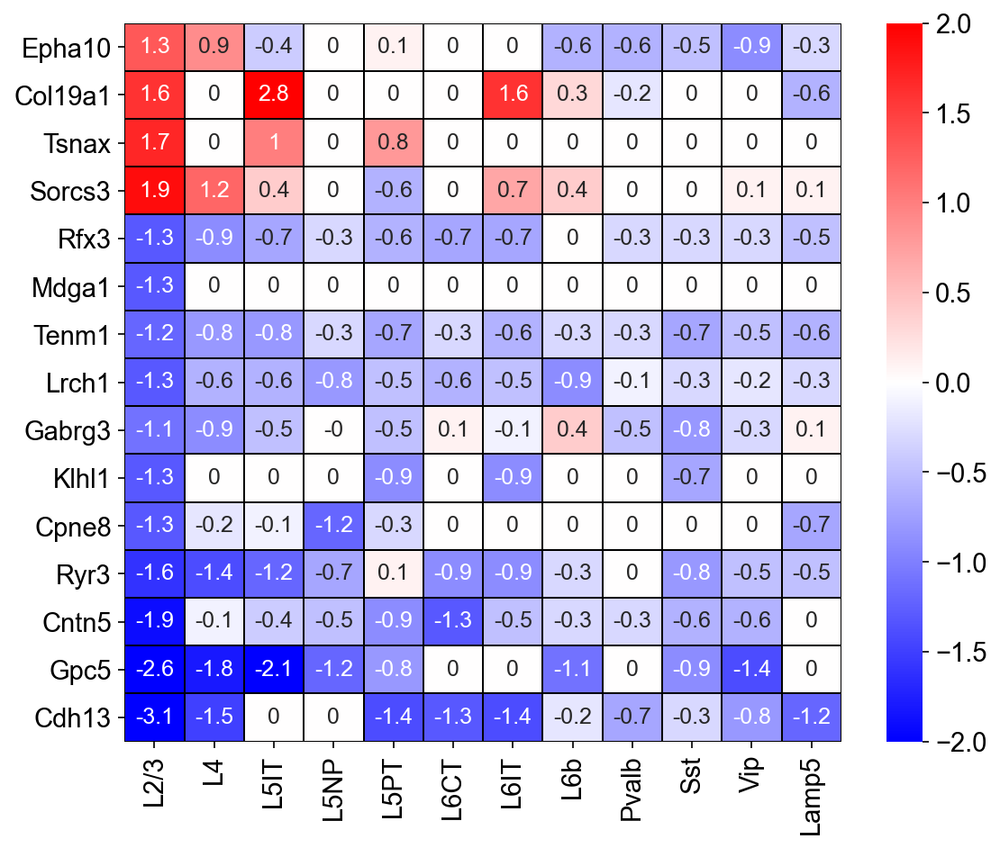

In [46]:
plt.figure(figsize=(8.5,7))
sn.heatmap(np.round(df_plt, 1).loc[re_master_L23], xticklabels=True, yticklabels=True, cmap='bwr', 
           linewidths=0.5, linecolor='black', vmin=-2, vmax=2, annot=True, annot_kws={'fontsize':12})
plt.savefig('figures/Fig2F.pdf')

In [45]:
p12_df

,L2/3_P12,L4_P12,L5IT_P12,L5NP_P12,L5PT_P12,L6CT_P12,L6IT_P12,L6b_P12
Tsnax,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Rfx3,-1.315723,-0.943281,-0.749669,-0.275984,-0.584396,-0.650964,-0.653529,0.000000
Cntn5,-1.916119,-0.084912,-0.445562,-0.465793,-0.870572,-1.300113,-0.495324,-0.347644
Mdga1,-1.341788,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Tenm1,-1.209965,-0.805802,-0.798043,-0.318161,-0.673285,-0.349712,-0.574194,-0.267864
Cdh13,-3.062929,-1.461150,0.000000,0.000000,-1.381942,-1.320004,-1.374021,-0.195055
Epha10,0.000000,0.000000,-0.396765,0.000000,0.000000,0.000000,0.000000,-0.608865
Lrch1,-1.264446,-0.648271,-0.595040,-0.794779,-0.519068,-0.601268,-0.494928,-0.884141
Ryr3,-1.621158,-1.409343,-1.234741,-0.695810,0.000000,-0.887211,-0.894392,-0.268354
Col19a1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [48]:
p12_df[gene]

KeyError: 'Tsnax'

In [50]:
for gene in p12_df.index:  

    if (sum(p12_df.loc[gene].values)==0):
        p12_df.loc[gene] = p22_df.loc[gene].values

In [51]:
p12_df

,L2/3_P12,L4_P12,L5IT_P12,L5NP_P12,L5PT_P12,L6CT_P12,L6IT_P12,L6b_P12
Tsnax,1.737047,0.000000,1.017944,0.000000,0.787764,0.000000,0.000000,0.000000
Rfx3,-1.315723,-0.943281,-0.749669,-0.275984,-0.584396,-0.650964,-0.653529,0.000000
Cntn5,-1.916119,-0.084912,-0.445562,-0.465793,-0.870572,-1.300113,-0.495324,-0.347644
Mdga1,-1.341788,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Tenm1,-1.209965,-0.805802,-0.798043,-0.318161,-0.673285,-0.349712,-0.574194,-0.267864
Cdh13,-3.062929,-1.461150,0.000000,0.000000,-1.381942,-1.320004,-1.374021,-0.195055
Epha10,0.000000,0.000000,-0.396765,0.000000,0.000000,0.000000,0.000000,-0.608865
Lrch1,-1.264446,-0.648271,-0.595040,-0.794779,-0.519068,-0.601268,-0.494928,-0.884141
Ryr3,-1.621158,-1.409343,-1.234741,-0.695810,0.000000,-0.887211,-0.894392,-0.268354
Col19a1,1.617732,0.000000,2.810476,0.000000,0.000000,0.000000,1.634728,0.283432


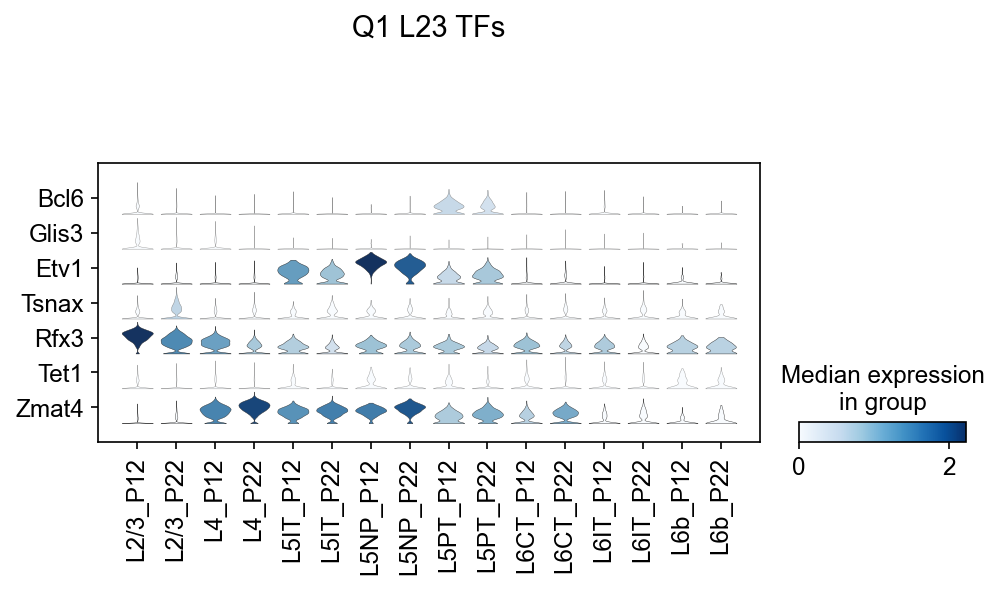

In [91]:
p22_dfsc.pl.stacked_violin(gluta, var_names=list(set(L23_tDE_genes['Gene']).intersection(set(TFs_quads[0].index))),
                     groupby='Subclass_age', swap_axes=True,
                    title='Q1 L23 TFs')

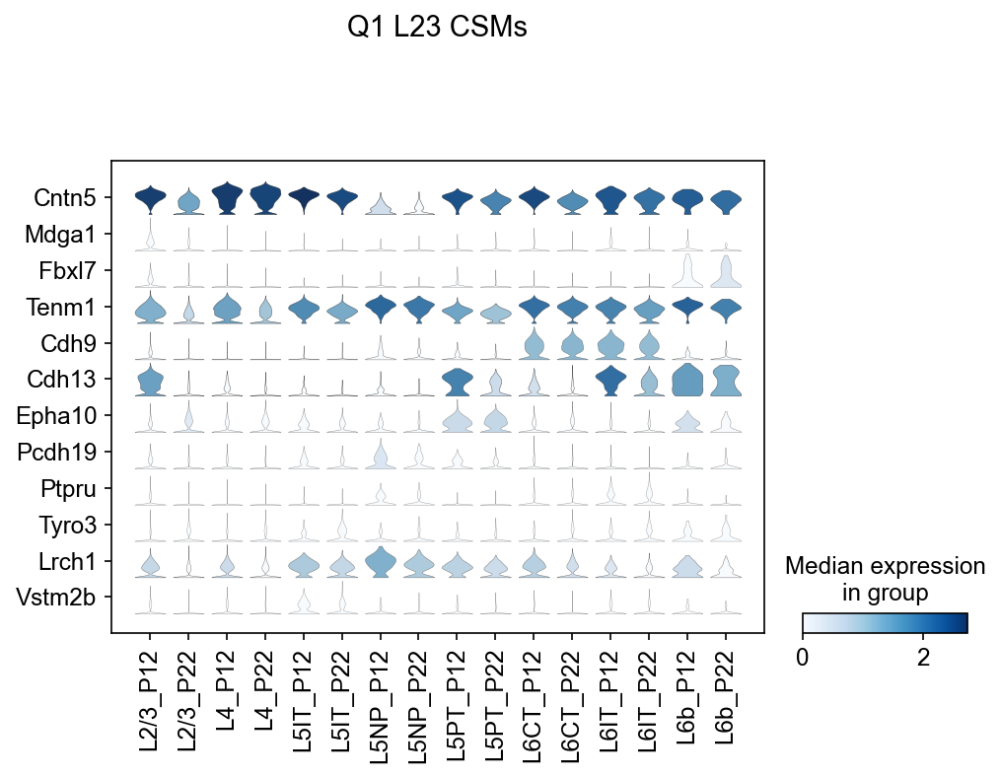

In [94]:
sc.pl.stacked_violin(gluta, var_names=list(set(L23_tDE_genes['Gene']).intersection(set(csms_quads[0].index))),
                     groupby='Subclass_age', swap_axes=True,
                    title='Q1 L23 CSMs')

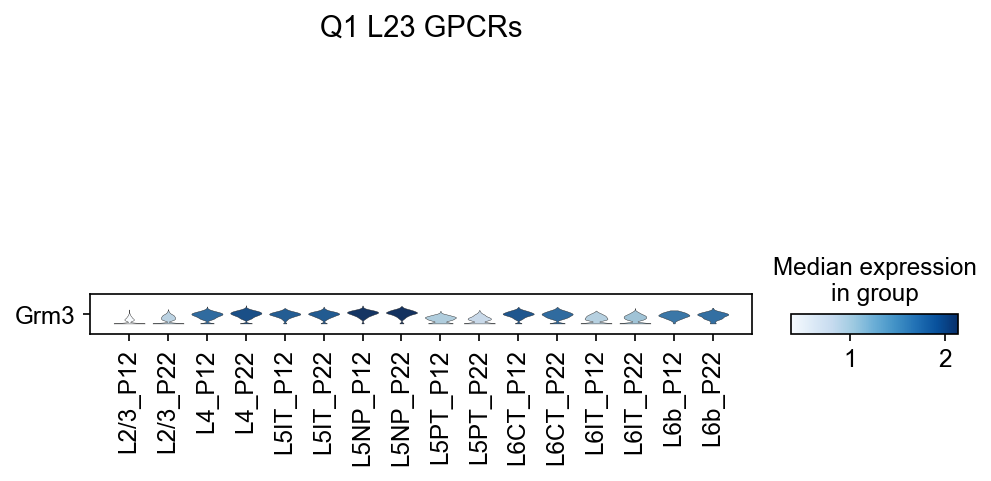

In [95]:
sc.pl.stacked_violin(gluta, var_names=list(set(L23_tDE_genes['Gene']).intersection(set(gpcrs_quads[0].index))),
                     groupby='Subclass_age', swap_axes=True,
                    title='Q1 L23 GPCRs')

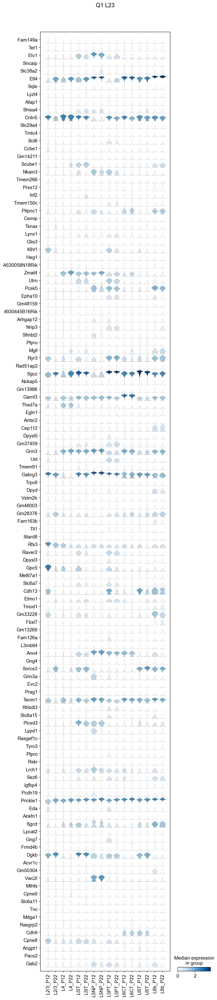

In [103]:
sc.pl.stacked_violin(gluta, var_names=L23_tDE_genes['Gene'],
                     groupby='Subclass_age', swap_axes=True,
                    title='Q1 L23')

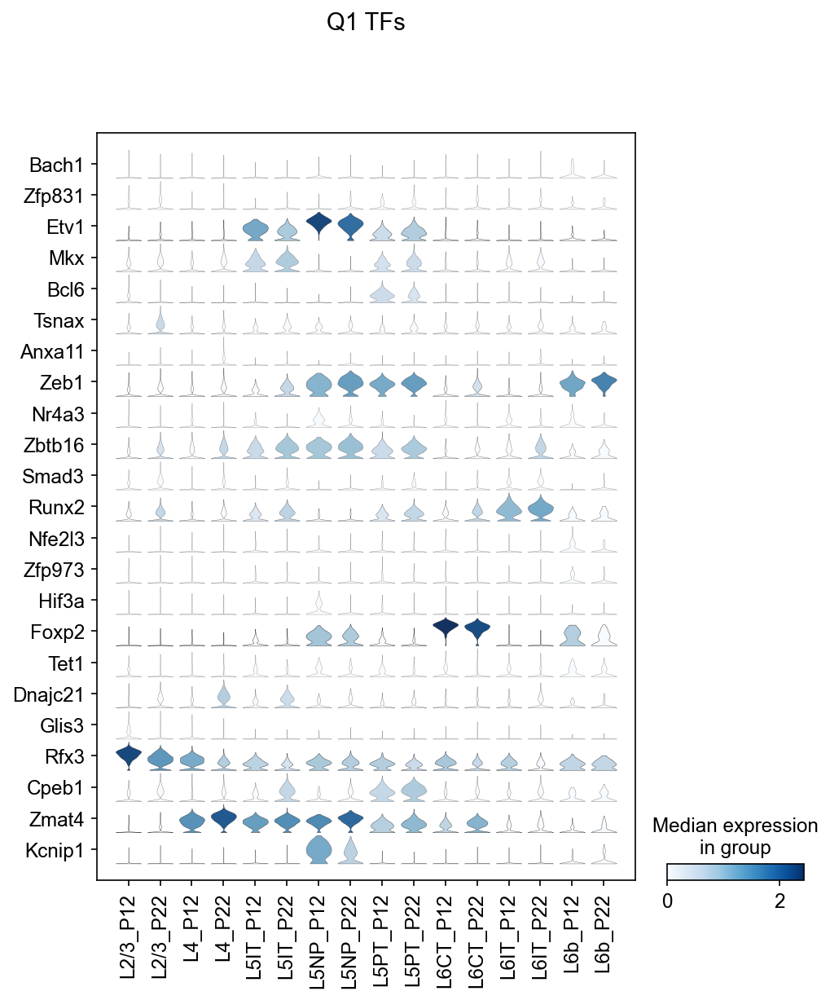

In [202]:
sc.pl.stacked_violin(gluta, var_names=TFs_quads[0].index,groupby='Subclass_age', swap_axes=True,
                    title='Q1 TFs')

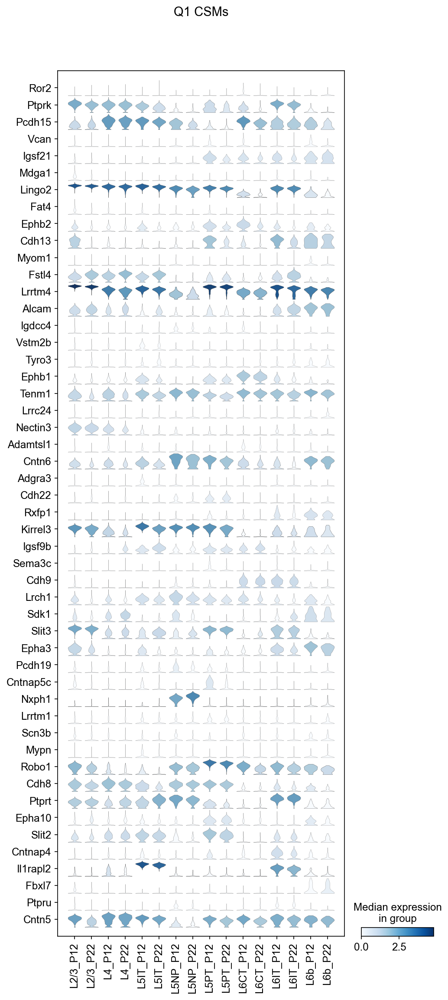

In [43]:
sc.pl.stacked_violin(gluta, var_names=csms_quads[0].index,groupby='Subclass_age', swap_axes=True,
                    title='Q1 CSMs')

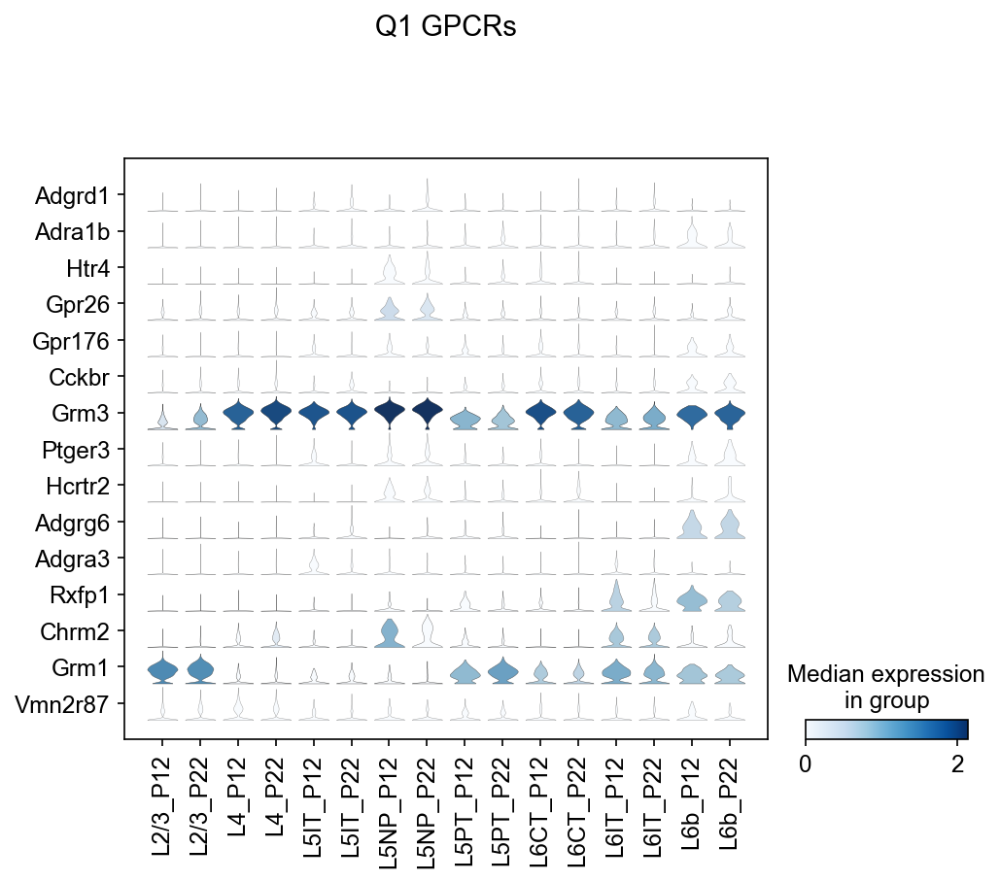

In [44]:
sc.pl.stacked_violin(gluta, var_names=gpcrs_quads[0].index,groupby='Subclass_age', swap_axes=True,
                    title='Q1 GPCRs')

# Subclass dist of Qx (tDE)

## CSM testing

In [62]:
scatter_df_glut = pd.read_csv('Figure2_dfs/scatter_df_max_gluta.csv', index_col=0)

In [33]:
subDE_df = pd.read_csv('Figure2_dfs/subDE_df_glut.csv', index_col=0)
subDE_df

,LF,p_adj,L2/3_P12,L2/3_P22,L4_P12,L4_P22,L5IT_P12,L5IT_P22,L5NP_P12,L5NP_P22,L5PT_P12,L5PT_P22,L6CT_P12,L6CT_P22,L6IT_P12,L6IT_P22,L6b_P12,L6b_P22
Gpc6,3.437667,0.000000e+00,0.945563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ccbe1,3.412357,0.000000e+00,0.239851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Igsf11,3.347765,0.000000e+00,0.298523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6530403H02Rik,3.179432,0.000000e+00,0.250904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Glra3,3.067032,2.879439e-307,0.207107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rundc3a,0.000904,9.987723e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.554545
Parp6,0.000570,9.995252e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.536364
Rnpep,0.000368,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.327273
Prpf6,0.000338,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.418182


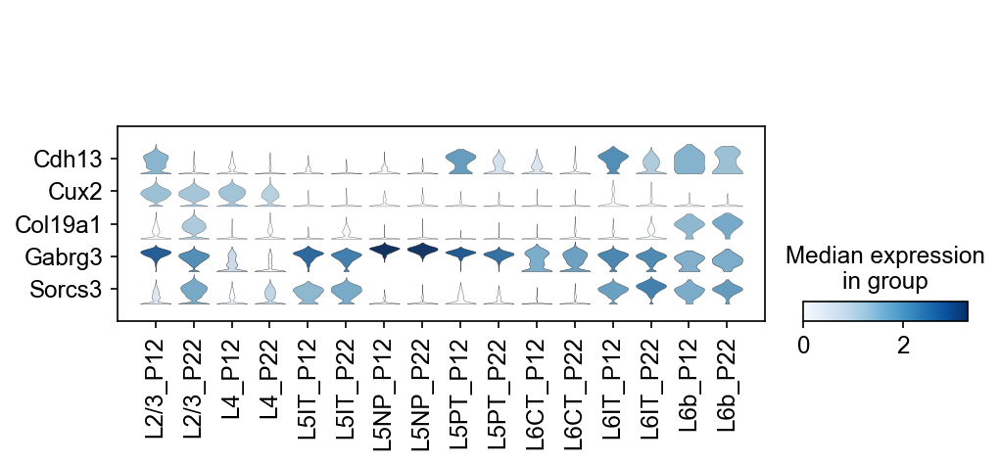

In [264]:
sc.pl.stacked_violin(gluta, var_names=['Cdh13','Cux2','Col19a1', 'Gabrg3', 'Sorcs3'],groupby='Subclass_age', swap_axes=True,)

Cdh13 is subclass-specific at P22 and not P12. At P22 it's not much expressed in L2/3 so it's specific to L6b. However, it's clear that its decrease is highly L2/3-specific. We don't capture that right now.

**We'd need to go into `gluta_dict_P22` and `gluta_dict_P12` to find that out for each gene**

A df where each row is a gene and each column a subclass and each entry the tDE FC for a gene in that subclass

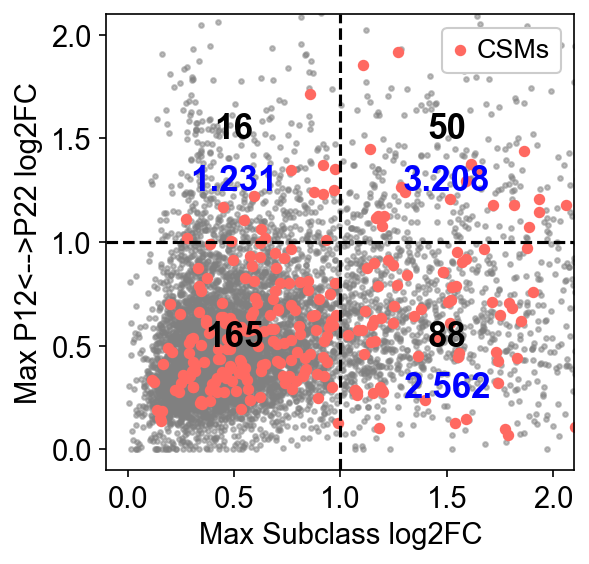

In [14]:
CSMs_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1, db_list=csms, db_lab='CSMs',
          xlim0=-0.1,ylim0=-0.1,enrich=True, ret_dbs=True)

In [15]:
gluta_dict_P12.update(gluta_dict_P22)

In [16]:
gluta_dict_P12.keys()

dict_keys(['L2/3_P12', 'L4_P12', 'L5IT_P12', 'L5NP_P12', 'L5PT_P12', 'L6CT_P12', 'L6IT_P12', 'L6b_P12', 'L2/3_P22', 'L4_P22', 'L5IT_P22', 'L5NP_P22', 'L5PT_P22', 'L6CT_P22', 'L6IT_P22', 'L6b_P22'])

In [17]:
csm_dict = {}
for g in CSMs_quads[0].index:
    csm_dict[g] = []
    for i in gluta_dict_P12:
        if (g in gluta_dict_P12[i].index):
            csm_dict[g].append(gluta_dict_P12[i].loc[g]['LF'])
        else:
            csm_dict[g].append(0)


In [18]:
csm_df = pd.DataFrame(csm_dict).transpose()

In [19]:
csm_df.columns = list(gluta_dict_P12.keys())

In [20]:
csm_df.loc['Tenm1'].sort_values(ascending=False).index[0]

'L2/3_P12'

In [21]:
lisss = []
for i in csm_df.index:
    lisss.append(csm_df.loc[i].sort_values(ascending=False).index[0])

In [22]:
pd.Categorical(lisss).value_counts()

L2/3_P12    10
L2/3_P22     2
L4_P12       2
L4_P22       2
L5IT_P12     6
L5IT_P22     2
L5NP_P12     3
L5NP_P22     1
L5PT_P12     4
L6CT_P12     9
L6CT_P22     2
L6b_P12      5
L6b_P22      2
dtype: int64

## On all Q1 genes

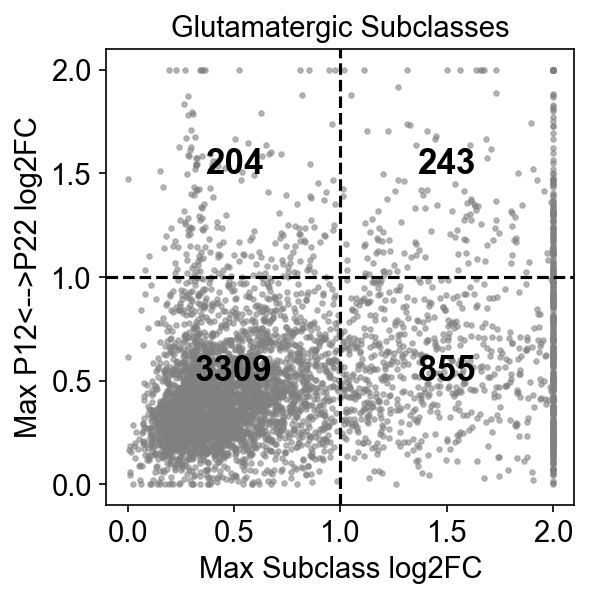

In [186]:
gluta_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='Glutamatergic Subclasses', ret=True)

In [187]:
gluta_dict_P12.update(gluta_dict_P22)

`gluta_dict_P12` contains both P12 and P22 DE info through the `.update()` module.

In [188]:
glut_dict = {}
for g in gluta_quads[0].index:
    glut_dict[g] = []
    for i in gluta_dict_P12:
        if (g in gluta_dict_P12[i].index):
            glut_dict[g].append(gluta_dict_P12[i].loc[g]['LF'])
        else:
            glut_dict[g].append(0)
glut_df = pd.DataFrame(glut_dict).transpose()

glut_df.columns = list(gluta_dict_P12.keys())

In [189]:
glut_df

,L2/3_P12,L4_P12,L5IT_P12,L5NP_P12,L5PT_P12,L6CT_P12,L6IT_P12,L6b_P12,L2/3_P22,L4_P22,L5IT_P22,L5NP_P22,L5PT_P22,L6CT_P22,L6IT_P22,L6b_P22
Eda,1.288561,0.000000,0.000000,0.000000,0.815135,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Scn9a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.681659,0.000000,0.000000,0.000000
Cdh8,0.721284,0.367681,1.040159,0.067170,0.262368,0.462655,0.475499,1.115844,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Slit3,0.250326,0.000000,0.000000,0.000000,0.072230,0.000000,0.189175,0.000000,0.000000,0.324765,0.776692,0.383154,0.000000,1.237323,0.000000,0.000000
Pitpnc1,1.802881,0.548437,0.761120,0.749147,0.984711,0.000000,0.136364,0.020690,0.000000,0.000000,0.000000,0.000000,0.000000,0.459107,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sphkap,0.817616,0.293853,0.941785,0.763490,1.318547,0.000000,0.226364,0.239337,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Igsf9b,0.000000,0.000000,0.000000,0.000000,0.121043,0.000000,0.000000,0.000000,0.000000,1.888030,0.934251,0.265356,0.000000,0.401906,1.132312,0.226863
Rsph10b,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039875,0.000000,0.000000,1.373484,0.000000,0.000000,0.000000,0.000000,0.000000
Chn2,0.000000,0.369783,1.235634,0.885807,0.000000,0.949170,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [190]:
glut_subclass_tDE = []
for i in glut_df.index:
    glut_subclass_tDE.append(glut_df.columns[glut_df.loc[i].argmax()])

In [191]:
a = pd.DataFrame(glut_subclass_tDE)
a.columns = ['Subclass']

In [192]:
a

,Subclass
0,L2/3_P12
1,L5PT_P22
2,L6b_P12
3,L6CT_P22
4,L2/3_P12
...,...
238,L5PT_P12
239,L4_P22
240,L5IT_P22
241,L5IT_P12


In [193]:
a['Subclass'].str.startswith('L2/3')

0       True
1      False
2      False
3      False
4       True
       ...  
238    False
239    False
240    False
241    False
242    False
Name: Subclass, Length: 243, dtype: bool

In [194]:
gs = pd.DataFrame(glut_df.index)
gs.columns = ['Gene']

In [195]:
L23_tDE_genes = gs[a['Subclass'].str.startswith('L2/3')]

In [197]:
len(glut_subclass_tDE)

243

In [199]:
Q1_dist = pd.Categorical(glut_subclass_tDE).value_counts()

Should be 243 as Q1 is.

In [200]:
sum(Q1_dist)

243

In [52]:
Q1_dist[Q1_dist.index.str.contains('P12')]

L2/3_P12    81
L4_P12      19
L5IT_P12    47
L5NP_P12    53
L5PT_P12    37
L6CT_P12    53
L6IT_P12     6
L6b_P12     54
dtype: int64

([0, 1, 2, 3, 4, 5, 6, 7], <a list of 8 Text major ticklabel objects>)

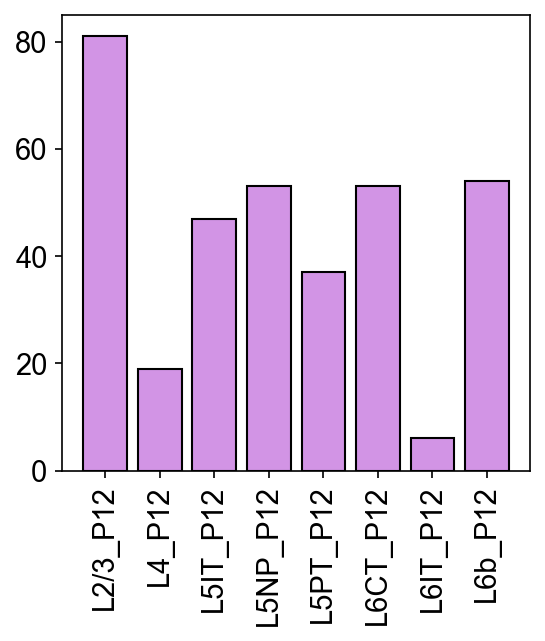

In [53]:
plt.bar(Q1_dist[Q1_dist.index.str.contains('P12')].index, Q1_dist[Q1_dist.index.str.contains('P12')].values, 
        color='#D294E5',edgecolor='black')
plt.grid(False)
plt.xticks(rotation=90)

In [54]:
P12_dist = Q1_dist[Q1_dist.index.str.contains('P12')].sort_values()
P22_dist = Q1_dist[Q1_dist.index.str.contains('P22')].sort_values()

In [55]:
sum(P12_dist), sum(P22_dist)

(350, 205)

In [56]:
P12.uns['Type_colors']

array(['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b',
       '#fab0e4', '#cfcfcf', '#fffea3', '#b9f2f0', '#66c2a5', '#fc8d62',
       '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f', '#e5c494', '#b3b3b3',
       '#f77189', '#bb9832', '#50b131', '#36ada4', '#3ba3ec', '#e866f4',
       '#f77189', '#bb9832', '#50b131', '#36ada4', '#3ba3ec', '#e866f4'],
      dtype=object)

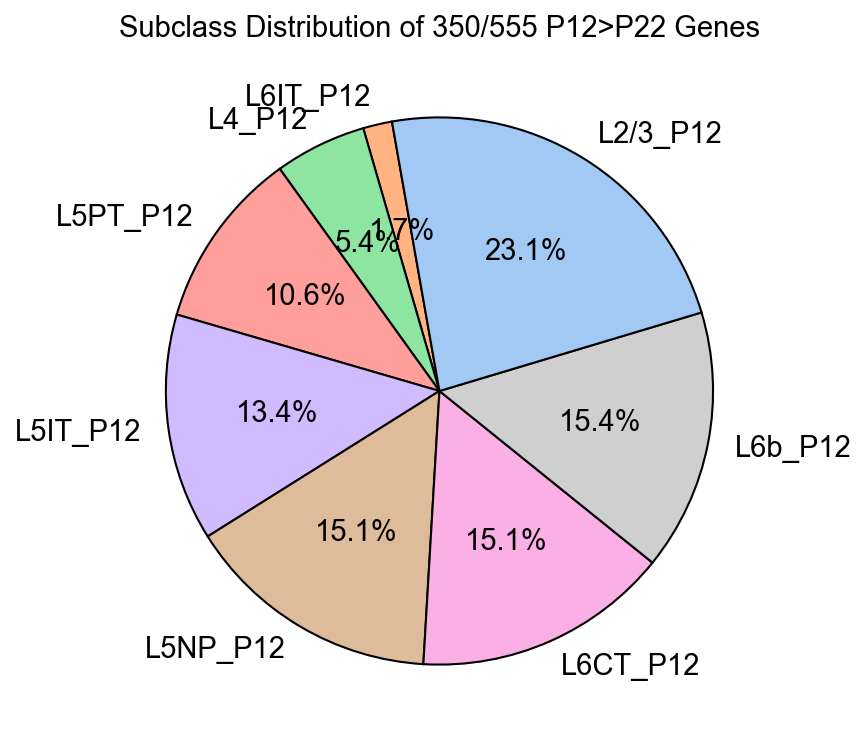

In [57]:
plt.figure(figsize=(6, 6))
plt.pie(P12_dist.values, labels=P12_dist.index, autopct='%1.1f%%', 
        startangle=100,colors=['#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b',
       '#fab0e4', '#cfcfcf','#a1c9f4', ], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Subclass Distribution of 350/555 P12>P22 Genes')
plt.show()

In [221]:
P12_dist, P22_dist

(L6IT_P12     6
 L4_P12      19
 L5PT_P12    37
 L5IT_P12    47
 L5NP_P12    53
 L6CT_P12    53
 L6b_P12     54
 L2/3_P12    81
 dtype: int64,
 L6IT_P22     2
 L5NP_P22    15
 L6CT_P22    17
 L5PT_P22    23
 L6b_P22     27
 L5IT_P22    38
 L2/3_P22    39
 L4_P22      44
 dtype: int64)

In [209]:
P12_dist_subs = []
for i in P12_dist.index.str.split('_'):
    P12_dist_subs.append(i[0])

In [210]:
P12_dist_subs

['L6IT', 'L4', 'L5PT', 'L5IT', 'L5NP', 'L6CT', 'L6b', 'L2/3']

In [211]:
dict()

d = {}
for k, v in zip(P12_dist_subs,['#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b',
       '#fab0e4', '#cfcfcf','#a1c9f4', ]):
    d[k] = v

In [212]:
d

{'L6IT': '#ffb482',
 'L4': '#8de5a1',
 'L5PT': '#ff9f9b',
 'L5IT': '#d0bbff',
 'L5NP': '#debb9b',
 'L6CT': '#fab0e4',
 'L6b': '#cfcfcf',
 'L2/3': '#a1c9f4'}

In [217]:
P12_dist.index

CategoricalIndex(['L6IT_P12', 'L4_P12', 'L5PT_P12', 'L5IT_P12', 'L5NP_P12',
                  'L6CT_P12', 'L6b_P12', 'L2/3_P12'],
                 categories=['L2/3_P12', 'L2/3_P22', 'L4_P12', 'L4_P22', 'L5IT_P12', 'L5IT_P22', 'L5NP_P12', 'L5NP_P22', ...], ordered=False, dtype='category')

In [219]:
P22_dist.index

CategoricalIndex(['L6IT_P22', 'L5NP_P22', 'L6CT_P22', 'L5PT_P22', 'L6b_P22',
                  'L5IT_P22', 'L2/3_P22', 'L4_P22'],
                 categories=['L2/3_P12', 'L2/3_P22', 'L4_P12', 'L4_P22', 'L5IT_P12', 'L5IT_P22', 'L5NP_P12', 'L5NP_P22', ...], ordered=False, dtype='category')

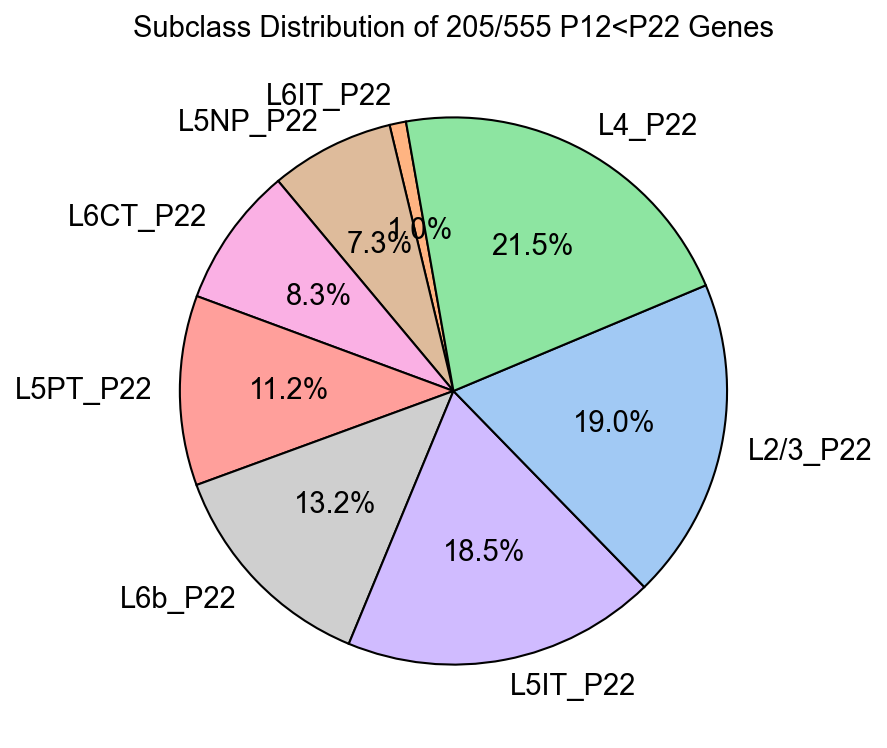

In [220]:
plt.figure(figsize=(6, 6))
plt.pie(P22_dist.values, labels=P22_dist.index, autopct='%1.1f%%', 
        startangle=100,colors=['#ffb482', '#debb9b',  '#fab0e4', '#ff9f9b', '#cfcfcf', '#d0bbff',
       '#a1c9f4', '#8de5a1',], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Subclass Distribution of 205/555 P12<P22 Genes')
plt.show()

In [ ]:
Col19a, Gabrg3, and Sorcs3

## On all Q3 genes

In [223]:
glut_dict = {}
for g in gluta_quads[2].index:
    glut_dict[g] = []
    for i in gluta_dict_P12:
        if (g in gluta_dict_P12[i].index):
            glut_dict[g].append(gluta_dict_P12[i].loc[g]['LF'])
        else:
            glut_dict[g].append(0)
glut_df = pd.DataFrame(glut_dict).transpose()

glut_df.columns = list(gluta_dict_P12.keys())

In [224]:
glut_subclass_tDE = []
for i in glut_df.index:
    glut_subclass_tDE.append(glut_df.columns[glut_df.loc[i].argmax()])

In [225]:
Q3_dist = pd.Categorical(glut_subclass_tDE).value_counts()

Should be 5761 as Q1 is.

In [226]:
sum(Q3_dist)

5761

In [227]:
P12_dist = Q3_dist[Q3_dist.index.str.contains('P12')].sort_values()
P22_dist = Q3_dist[Q3_dist.index.str.contains('P22')].sort_values()

In [228]:
sum(P12_dist), sum(P22_dist)

(3377, 2384)

In [229]:
d

{'L6IT': '#ffb482',
 'L4': '#8de5a1',
 'L5PT': '#ff9f9b',
 'L5IT': '#d0bbff',
 'L5NP': '#debb9b',
 'L6CT': '#fab0e4',
 'L6b': '#cfcfcf',
 'L2/3': '#a1c9f4'}

In [230]:
P12_dist.index

CategoricalIndex(['L6IT_P12', 'L2/3_P12', 'L6CT_P12', 'L5IT_P12', 'L4_P12',
                  'L5PT_P12', 'L5NP_P12', 'L6b_P12'],
                 categories=['L2/3_P12', 'L2/3_P22', 'L4_P12', 'L4_P22', 'L5IT_P12', 'L5IT_P22', 'L5NP_P12', 'L5NP_P22', ...], ordered=False, dtype='category')

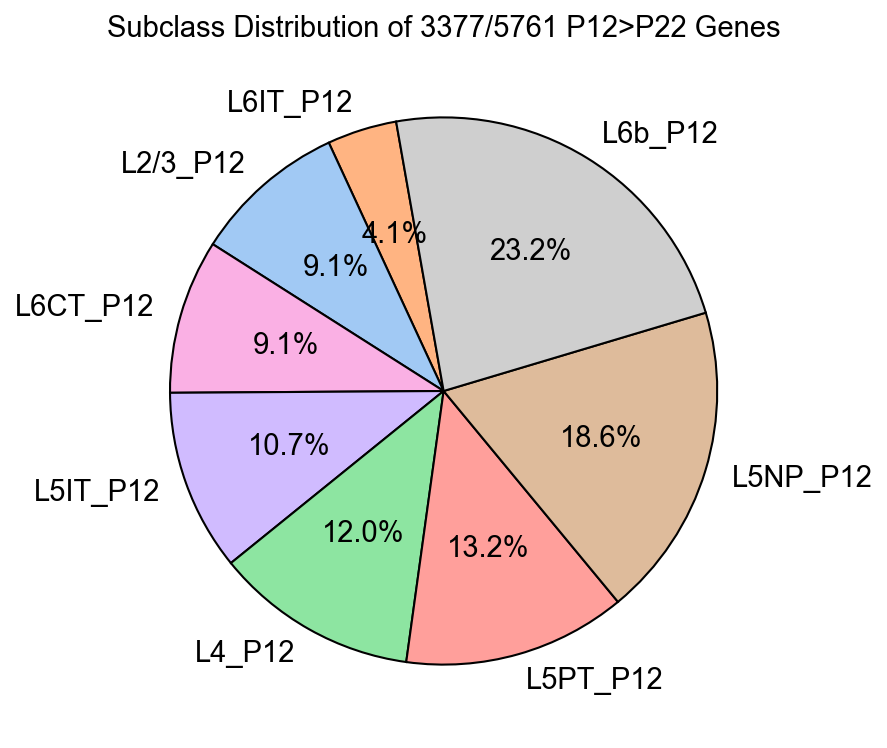

In [231]:
plt.figure(figsize=(6, 6))
plt.pie(P12_dist.values, labels=P12_dist.index, autopct='%1.1f%%', 
        startangle=100,colors=['#ffb482', '#a1c9f4','#fab0e4','#d0bbff','#8de5a1',
                              '#ff9f9b','#debb9b','#cfcfcf'], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Subclass Distribution of 3377/5761 P12>P22 Genes')
plt.show()

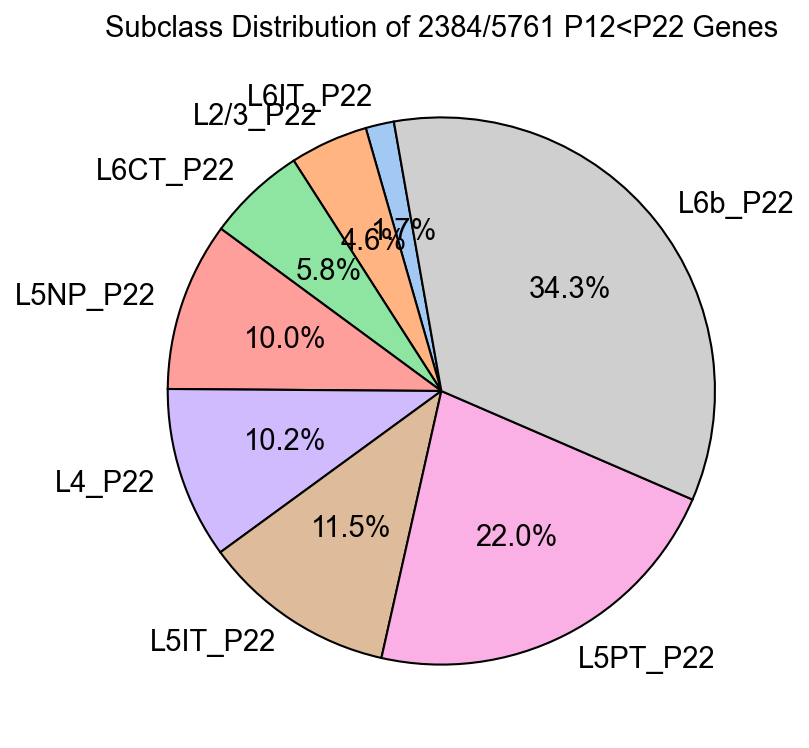

In [81]:
plt.figure(figsize=(6, 6))
plt.pie(P22_dist.values, labels=P22_dist.index, autopct='%1.1f%%', 
        startangle=100,colors=['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b',
       '#fab0e4', '#cfcfcf',], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Subclass Distribution of 2384/5761 P12<P22 Genes')
plt.show()

## Ratio of Q1/Q3 pie charts

In [176]:
P22_dist_ = P22_dist

In [178]:
P22_dist_.index

CategoricalIndex(['L6IT_P22', 'L2/3_P22', 'L6CT_P22', 'L5NP_P22', 'L4_P22',
                  'L5IT_P22', 'L5PT_P22', 'L6b_P22'],
                 categories=['L2/3_P12', 'L2/3_P22', 'L4_P12', 'L4_P22', 'L5IT_P12', 'L5IT_P22', 'L5NP_P12', 'L5NP_P22', ...], ordered=False, dtype='category')

In [179]:
P22_dist_.index = ['L6IT', 'L2/3', 'L6CT', 'L5NP', 'L4',
                  'L5IT', 'L5PT', 'L6b']

In [181]:
P12_dist_ = P12_dist

In [182]:
P12_dist_.index

CategoricalIndex(['L6IT_P12', 'L2/3_P12', 'L6CT_P12', 'L5IT_P12', 'L4_P12',
                  'L5PT_P12', 'L5NP_P12', 'L6b_P12'],
                 categories=['L2/3_P12', 'L2/3_P22', 'L4_P12', 'L4_P22', 'L5IT_P12', 'L5IT_P22', 'L5NP_P12', 'L5NP_P22', ...], ordered=False, dtype='category')

In [183]:
P12_dist_.index = ['L6IT', 'L2/3', 'L6CT', 'L5IT', 'L4',
                  'L5PT', 'L5NP', 'L6b']

In [186]:
P12_dist_

L6IT    139
L2/3    307
L6CT    308
L5IT    362
L4      405
L5PT    445
L5NP    629
L6b     782
dtype: int64

In [187]:
P12_dist_/P22_dist_[P12_dist_.index]

L6IT    3.475000
L2/3    2.790909
L6CT    2.215827
L5IT    1.326007
L4      1.673554
L5PT    0.847619
L5NP    2.642857
L6b     0.957160
dtype: float64

# Subclass dist of Qx (marker)

In [162]:
q1_marks = []
for g in gluta_quads[0].index:
    
    if (g in subDE_df.index):
        max_idx = subDE_df[subDE_df.index==g]['LF'].argmax()
        subc = subDE_df[subDE_df.index==g].iloc[max_idx].dropna().index[-1].split('_')[0]
        q1_marks.append(subc)
    else:
        print(g, 'is not in subDE_df')

Ptpn13 is not in subDE_df
Tspan11 is not in subDE_df
Gm15942 is not in subDE_df
Colgalt2 is not in subDE_df
Itga9 is not in subDE_df
Ddit4l is not in subDE_df
Gm7854 is not in subDE_df
Phactr2 is not in subDE_df
Evc2 is not in subDE_df
Mei1 is not in subDE_df
Pgm1 is not in subDE_df
Gm26777 is not in subDE_df
Alk is not in subDE_df
Acvr1c is not in subDE_df


In [163]:
len(q1_marks)

541

In [164]:
q1_marks

['L5PT',
 'L2/3',
 'L6b',
 'L4',
 'L5PT',
 'L5NP',
 'L2/3',
 'L5PT',
 'L2/3',
 'L4',
 'L5PT',
 'L6b',
 'L5NP',
 'L5IT',
 'L2/3',
 'L6b',
 'L5PT',
 'L5PT',
 'L6b',
 'L6CT',
 'L6b',
 'L5NP',
 'L5PT',
 'L6b',
 'L5PT',
 'L6CT',
 'L6b',
 'L5NP',
 'L2/3',
 'L5PT',
 'L6b',
 'L6b',
 'L5PT',
 'L6b',
 'L6IT',
 'L6CT',
 'L5PT',
 'L6b',
 'L6b',
 'L2/3',
 'L6b',
 'L6IT',
 'L2/3',
 'L2/3',
 'L6b',
 'L6b',
 'L5NP',
 'L4',
 'L6IT',
 'L5IT',
 'L5PT',
 'L5NP',
 'L2/3',
 'L5PT',
 'L5IT',
 'L4',
 'L5NP',
 'L6CT',
 'L6CT',
 'L2/3',
 'L5PT',
 'L5PT',
 'L5IT',
 'L6IT',
 'L2/3',
 'L5PT',
 'L6b',
 'L5IT',
 'L6b',
 'L5PT',
 'L2/3',
 'L2/3',
 'L6b',
 'L5IT',
 'L2/3',
 'L6b',
 'L6IT',
 'L2/3',
 'L5IT',
 'L6CT',
 'L6IT',
 'L6CT',
 'L6b',
 'L5IT',
 'L2/3',
 'L5NP',
 'L5NP',
 'L4',
 'L5NP',
 'L5NP',
 'L5IT',
 'L2/3',
 'L5NP',
 'L5PT',
 'L4',
 'L5NP',
 'L6CT',
 'L2/3',
 'L5NP',
 'L5IT',
 'L2/3',
 'L5NP',
 'L5NP',
 'L6IT',
 'L5PT',
 'L5NP',
 'L2/3',
 'L6b',
 'L2/3',
 'L6CT',
 'L2/3',
 'L5NP',
 'L2/3',
 'L5PT',
 'L6CT'

In [168]:
pd.Categorical(q1_marks).value_counts().sort_values()

L6IT     30
L5IT     37
L4       38
L6CT     53
L5NP     82
L2/3     84
L5PT    108
L6b     109
dtype: int64

In [169]:
submark_dist = pd.Categorical(q1_marks).value_counts().sort_values()

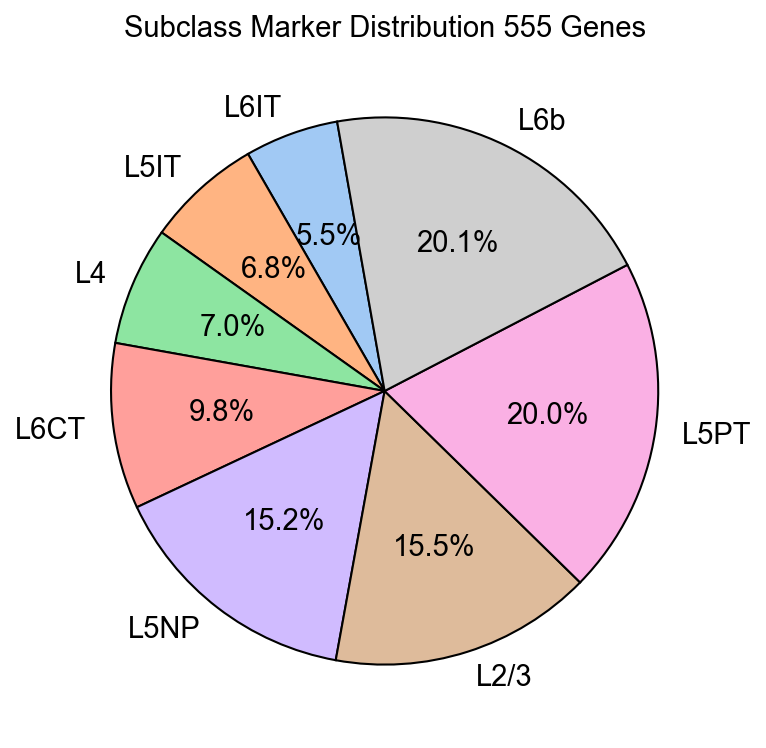

In [170]:
plt.figure(figsize=(6, 6))
plt.pie(submark_dist.values, labels=submark_dist.index, autopct='%1.1f%%', 
        startangle=100,colors=['#a1c9f4', '#ffb482', '#8de5a1', '#ff9f9b', '#d0bbff', '#debb9b',
       '#fab0e4', '#cfcfcf',], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
plt.title('Subclass Marker Distribution 555 Genes')
plt.show()

# GOATOOLS setup

In [167]:
import goatools

navigate to `/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/bin`

move `gene_result.txt` to that directory

run `python ncbi_gene_results_to_python.py -o genes_ncbi_mus_musculus_proteincoding.py gene_result.txt`

bring generated `genes_ncbi_mus_musculus_proteincoding.py` to the directory of this notebook

In [168]:
from genes_ncbi_mus_musculus_proteincoding import GENEID2NT as GeneID2nt_mus

In [169]:
from goatools.base import download_go_basic_obo
from goatools.base import download_ncbi_associations
from goatools.obo_parser import GODag
from goatools.anno.genetogo_reader import Gene2GoReader
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

In [170]:
#run one time to initialize
obo_fname = download_go_basic_obo()
fin_gene2go = download_ncbi_associations()
obodag = GODag("go-basic.obo")

  EXISTS: go-basic.obo
  EXISTS: gene2go
go-basic.obo: fmt(1.2) rel(2024-03-28) 45,727 Terms


In [171]:
#run one time to initialize
mapper = {}

for key in GeneID2nt_mus:
    mapper[GeneID2nt_mus[key].Symbol] = GeneID2nt_mus[key].GeneID
    
inv_map = {v: k for k, v in mapper.items()}

In [172]:
#run one time to initialize

# Read NCBI's gene2go. Store annotations in a list of namedtuples
objanno = Gene2GoReader(fin_gene2go, taxids=[10090])
# Get namespace2association where:
#    namespace is:
#        BP: biological_process               
#        MF: molecular_function
#        CC: cellular_component
#    assocation is a dict:
#        key: NCBI GeneID
#        value: A set of GO IDs associated with that gene
ns2assoc = objanno.get_ns2assc()

HMS:0:04:08.097333 443,417 annotations, 29,876 genes, 18,998 GOs, 1 taxids READ: gene2go 


In [173]:
#run one time to initialize
goeaobj = GOEnrichmentStudyNS(
        GeneID2nt_mus.keys(), # List of mouse protein-coding genes
        ns2assoc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method


Load BP Ontology Enrichment Analysis ...
 69% 17,956 of 26,205 population items found in association

Load CC Ontology Enrichment Analysis ...
 72% 18,888 of 26,205 population items found in association

Load MF Ontology Enrichment Analysis ...
 66% 17,252 of 26,205 population items found in association


In [174]:
#run one time to initialize
GO_items = []
temp = goeaobj.ns2objgoea['BP'].assoc
for item in temp:
    GO_items += temp[item]

temp = goeaobj.ns2objgoea['CC'].assoc
for item in temp:
    GO_items += temp[item]

temp = goeaobj.ns2objgoea['MF'].assoc
for item in temp:
    GO_items += temp[item]


In [175]:
#pass list of gene symbols
def go_it(test_genes):
    print(f'input genes: {len(test_genes)}')
    
    mapped_genes = []
    for gene in test_genes:
        try:
            mapped_genes.append(mapper[gene])
        except:
            pass
    print(f'mapped genes: {len(mapped_genes)}')
    
    goea_results_all = goeaobj.run_study(mapped_genes)
    goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
    GO = pd.DataFrame(list(map(lambda x: [x.GO, x.goterm.name, x.goterm.namespace, x.p_uncorrected, x.p_fdr_bh,\
                   x.ratio_in_study[0], x.ratio_in_study[1], GO_items.count(x.GO), list(map(lambda y: inv_map[y], x.study_items)),\
                   ], goea_results_sig)), columns = ['GO', 'term', 'class', 'p', 'p_corr', 'n_genes',\
                                                    'n_study', 'n_go', 'study_genes'])

    GO = GO[GO.n_genes > 1]
    return GO


## run on gaba

In [12]:
scatter_df_gaba = pd.read_csv('Figure2_dfs/scatter_df_max_gaba.csv', index_col=0)

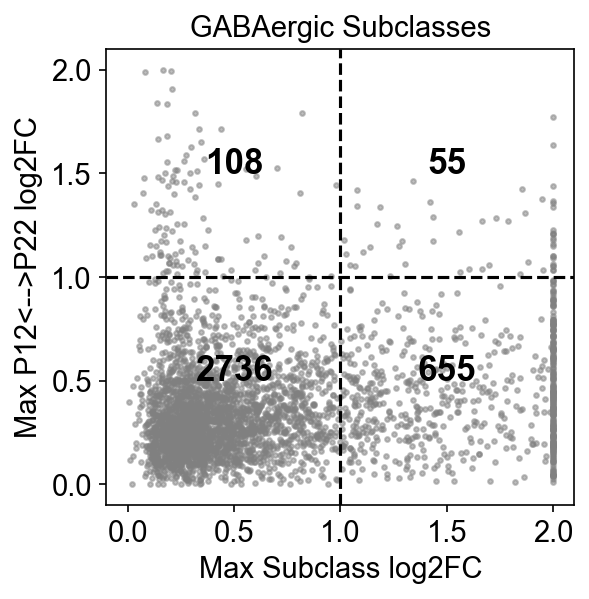

In [15]:
gaba_quads = plot_scatt(scatter_df=scatter_df_gaba, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='GABAergic Subclasses', ret=True)

### Q1

In [19]:
df1 = go_it(list(gaba_quads[0].index))
df1['per'] = df1.n_genes/df1.n_go
df1['log10(p_adj)'] = -1*np.log10(df1['p_corr'])

bp  = df1[df1['class']=='biological_process']
cc  = df1[df1['class']=='cellular_component']
mf  = df1[df1['class']=='molecular_function']

df1_test= bp[1:11]

input genes: 55
mapped genes: 46

Runing BP Ontology Analysis: current study set of 46 IDs.
 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     318 terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 46 IDs.
 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     120 terms are associated with

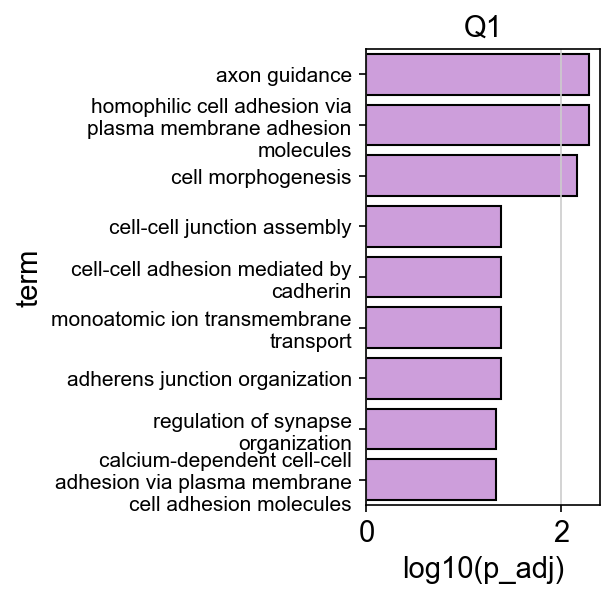

In [23]:
plt.figure(figsize = (2,4))


ax = sn.barplot(data = df1_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 30) for term in df1_test['term']], fontsize=10)
plt.title('Q1')
plt.show()

In [24]:
len(gaba_quads[2])

2736

In [25]:
df1 = go_it(list(gaba_quads[2].index))
df1['per'] = df1.n_genes/df1.n_go
df1['log10(p_adj)'] = -1*np.log10(df1['p_corr'])

bp  = df1[df1['class']=='biological_process']
cc  = df1[df1['class']=='cellular_component']
mf  = df1[df1['class']=='molecular_function']

df1_test= bp[1:11]

input genes: 2736
mapped genes: 2577

Runing BP Ontology Analysis: current study set of 2577 IDs.
 93%  2,398 of  2,577 study items found in association
100%  2,577 of  2,577 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
   5,981 terms are associated with  2,398 of  2,577 study items
  METHOD fdr_bh:
     537 GO terms found significant (< 0.05=alpha) (525 enriched +  12 purified): statsmodels fdr_bh
   2,099 study items associated with significant GO IDs (enriched)
      63 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 2577 IDs.
 96%  2,478 of  2,577 study items found in association
100%  2,577 of  2,577 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
   1,076 terms are associa

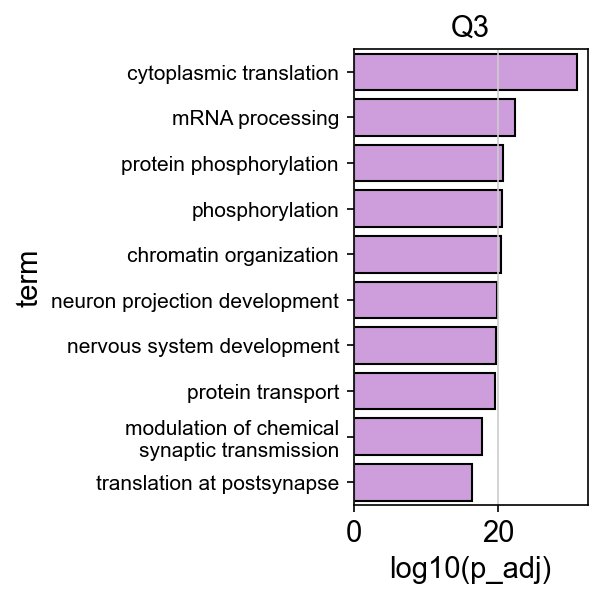

In [27]:
df1_test= bp[0:10]
plt.figure(figsize = (2,4))


ax = sn.barplot(data = df1_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 30) for term in df1_test['term']], fontsize=10)
plt.title('Q3')
plt.show()

## run on gluta

In [176]:
scatter_df_glut = pd.read_csv('Figure2_dfs/scatter_df_max_gluta.csv', index_col=0)

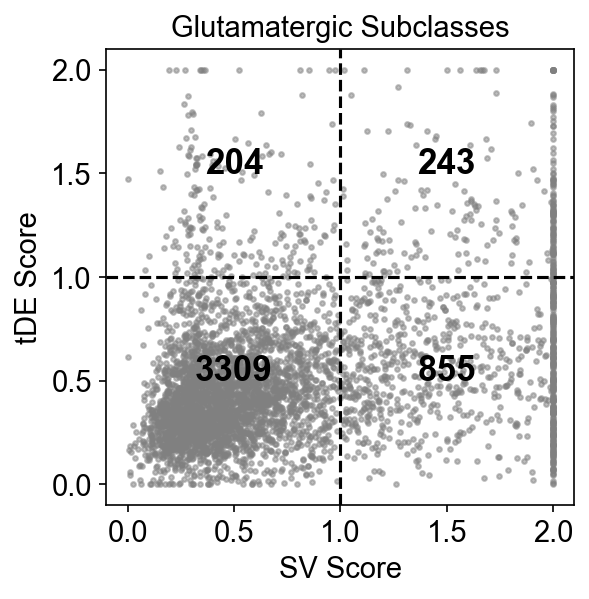

In [177]:
gluta_quads = plot_scatt(scatter_df=scatter_df_glut, maxORmean='Max', xlim_=2.1, ylim_=2.1,xlim0=-0.1,ylim0=-0.1,
          titl='Glutamatergic Subclasses', ret=True)

### Q1

In [178]:
df1 = go_it(list(gluta_quads[0].index))
df1['per'] = df1.n_genes/df1.n_go
df1['log10(p_adj)'] = -1*np.log10(df1['p_corr'])

bp  = df1[df1['class']=='biological_process']
cc  = df1[df1['class']=='cellular_component']
mf  = df1[df1['class']=='molecular_function']

df1_test= bp[0:20]

input genes: 243
mapped genes: 218

Runing BP Ontology Analysis: current study set of 218 IDs.
 94%    204 of    218 study items found in association
100%    218 of    218 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
   1,257 terms are associated with    204 of    218 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
     105 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 218 IDs.
 98%    214 of    218 study items found in association
100%    218 of    218 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     240 terms are associated 

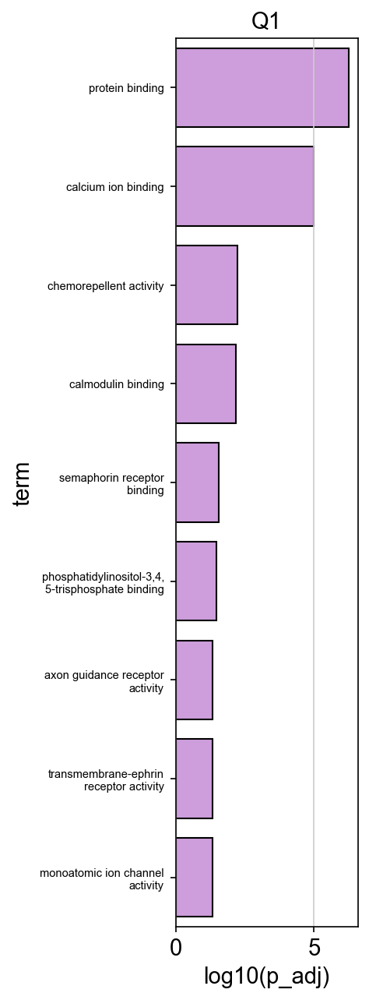

In [189]:
plt.figure(figsize = (2,10))


ax = sn.barplot(data = mf[0:20], x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 25) for term in  mf[0:20]['term']], fontsize=7)
plt.title('Q1')
plt.show()

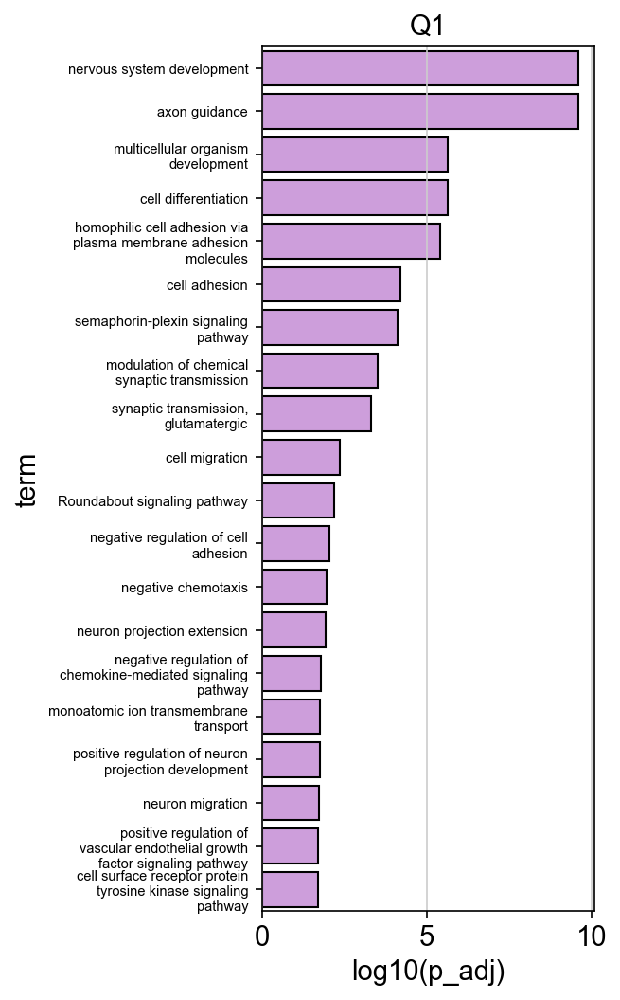

In [211]:
plt.figure(figsize = (3,8))


ax = sn.barplot(data = df1_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 30) for term in df1_test['term']], fontsize=7)
plt.title('Q1')
plt.show()

In [32]:
for i in range(len(df1_test)):
    print(set(df1_test.iloc[i]['study_genes']).intersection(set(['Col19a1', 'Gabrg3', 'Sorcs3'])))

{'Col19a1'}
set()
set()
set()
{'Col19a1'}
{'Col19a1'}
set()
set()
set()
set()


In [22]:
for i in df1_test:

SyntaxError: unexpected EOF while parsing (1773735108.py, line 1)

#### Q1 example expression

Axon guidance is unique to Q1

In [26]:
df1_test.iloc[2]['study_genes']

['Sema5a',
 'Sema5b',
 'Sema6a',
 'Alcam',
 'Nrp2',
 'Epha3',
 'Ephb2',
 'Robo1',
 'Sema6d',
 'Etv1',
 'Mypn',
 'Cntn5',
 'Nr4a3',
 'Ptpro',
 'Epha10',
 'Slit2',
 'Slit3',
 'Gap43',
 'Dpysl5',
 'Cntn6',
 'Ephb1',
 'Reln',
 'Sema3c']

In [32]:
q1_cell_adh = df1_test.iloc[0]['study_genes']

In [33]:
q1_ax_guid = df1_test.iloc[2]['study_genes']

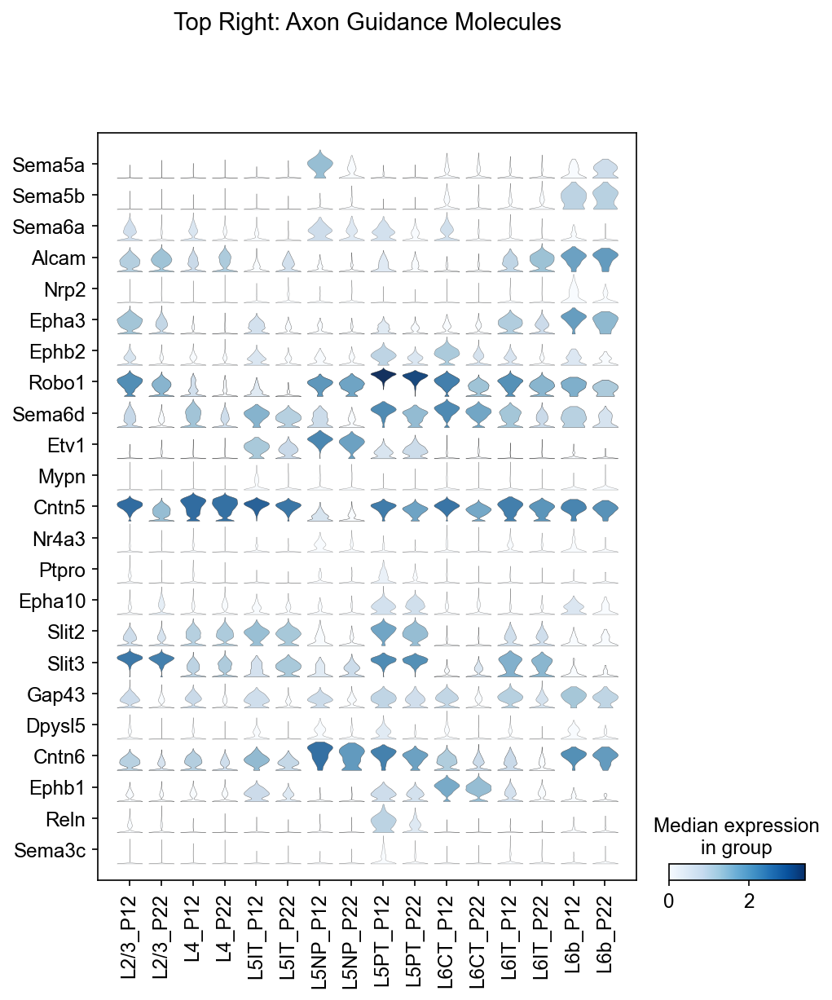

In [34]:
sc.pl.stacked_violin(gluta, var_names=q1_ax_guid,groupby='Subclass_age', swap_axes=True,
                    title='Top Right: Axon Guidance Molecules')

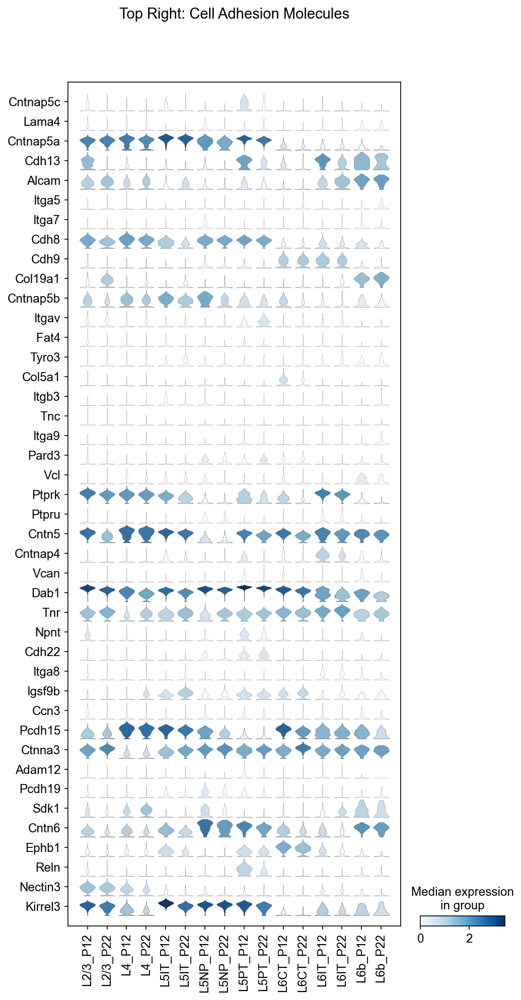

In [35]:
sc.pl.stacked_violin(gluta, var_names=q1_cell_adh,groupby='Subclass_age', swap_axes=True,
                    title='Top Right: Cell Adhesion Molecules')

In [235]:
set(csms).intersection(set(['Col19a1', 'Sorcs3', 'Gabrg3']))

set()

In [238]:
'Col19a1' in gluta_quads[0].index, 'Sorcs3' in gluta_quads[0].index, 'Gabrg3' in gluta_quads[0].index

(True, True, True)

### Q3

In [195]:
df3 = go_it(list(gluta_quads[2].index))

df3['per'] = df3.n_genes/df3.n_go

df3['log10(p_adj)'] = -1*np.log10(df3['p_corr'])

bp  = df3[df3['class']=='biological_process']
cc  = df3[df3['class']=='cellular_component']
mf  = df3[df3['class']=='molecular_function']

df3_test = bp[0:20]

input genes: 3309
mapped genes: 3128

Runing BP Ontology Analysis: current study set of 3128 IDs.
 93%  2,906 of  3,128 study items found in association
100%  3,128 of  3,128 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
   6,536 terms are associated with  2,906 of  3,128 study items
  METHOD fdr_bh:
     669 GO terms found significant (< 0.05=alpha) (654 enriched +  15 purified): statsmodels fdr_bh
   2,641 study items associated with significant GO IDs (enriched)
      77 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 3128 IDs.
 96%  3,002 of  3,128 study items found in association
100%  3,128 of  3,128 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
   1,171 terms are associa

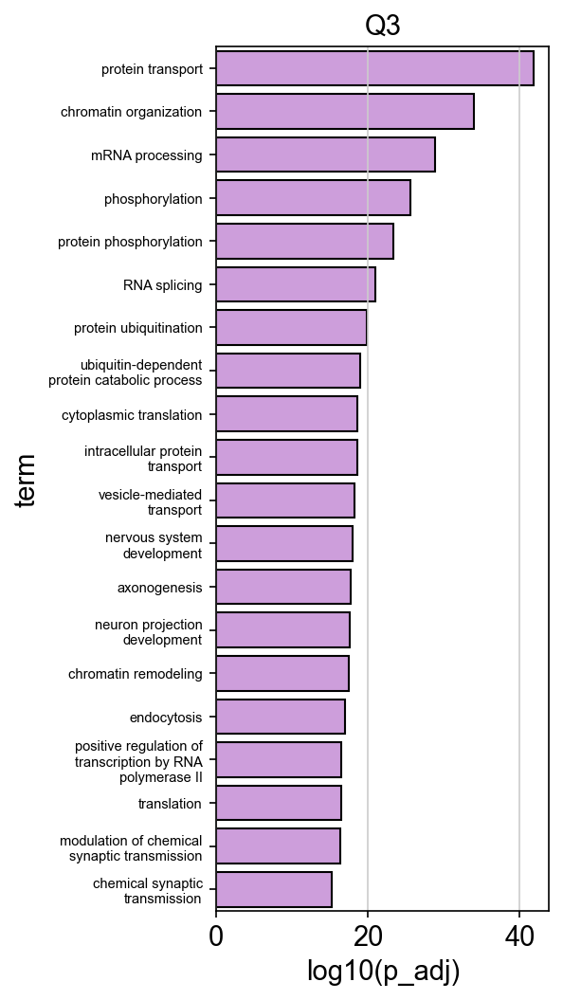

In [210]:
plt.figure(figsize = (3,8))

ax = sn.barplot(data = df3_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 25) for term in df3_test['term']], fontsize=7)
plt.title('Q3')
plt.show()

### Q2

In [190]:
df2 = go_it(list(gluta_quads[1].index))

df2['per'] = df2.n_genes/df2.n_go

df2['log10(p_adj)'] = -1*np.log10(df2['p_corr'])

bp  = df2[df2['class']=='biological_process']
cc  = df2[df2['class']=='cellular_component']
mf  = df2[df2['class']=='molecular_function']

df2_test = bp[0:20]

input genes: 204
mapped genes: 174

Runing BP Ontology Analysis: current study set of 174 IDs.
 93%    161 of    174 study items found in association
100%    174 of    174 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     785 terms are associated with    161 of    174 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      50 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 174 IDs.
 96%    167 of    174 study items found in association
100%    174 of    174 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     227 terms are associated 

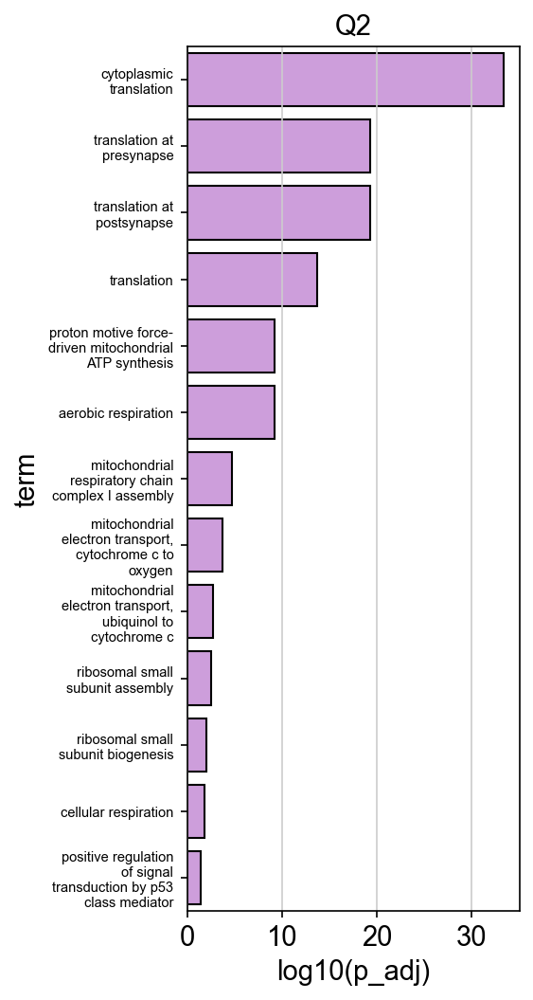

In [207]:
plt.figure(figsize = (3,8))

ax = sn.barplot(data = df2_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 20) for term in df2_test['term']], fontsize=7)
plt.title('Q2')
plt.show()

### Q4

In [184]:
gluta_quads[3].loc['Pcdh9']

Subclass    1.202126
Time        0.278454
Name: Pcdh9, dtype: float64

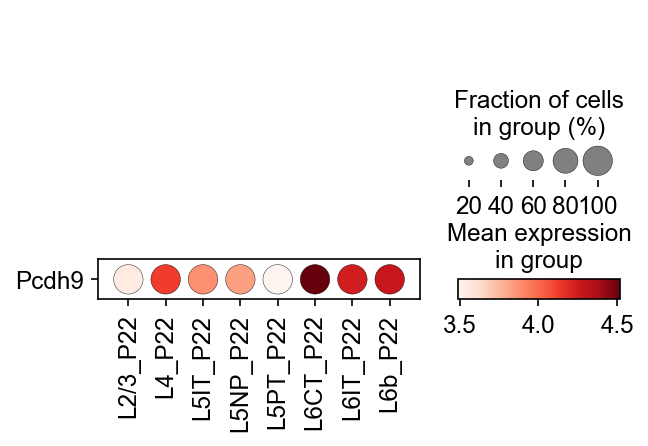

In [45]:
sc.pl.dotplot(gluta[gluta.obs.Condition=='P22',:], var_names='Pcdh9', groupby='Subclass_age', swap_axes=True)

In [193]:
df4 = go_it(list(gluta_quads[3].index))

df4['per'] = df4.n_genes/df4.n_go

df4['log10(p_adj)'] = -1*np.log10(df4['p_corr'])

bp  = df4[df4['class']=='biological_process']
cc  = df4[df4['class']=='cellular_component']
mf  = df4[df4['class']=='molecular_function']

df4_test = bp[0:20]

input genes: 855
mapped genes: 768

Runing BP Ontology Analysis: current study set of 768 IDs.
 91%    702 of    768 study items found in association
100%    768 of    768 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
   3,180 terms are associated with    702 of    768 study items
  METHOD fdr_bh:
     106 GO terms found significant (< 0.05=alpha) (104 enriched +   2 purified): statsmodels fdr_bh
     486 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 768 IDs.
 95%    727 of    768 study items found in association
100%    768 of    768 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     485 terms are associated 

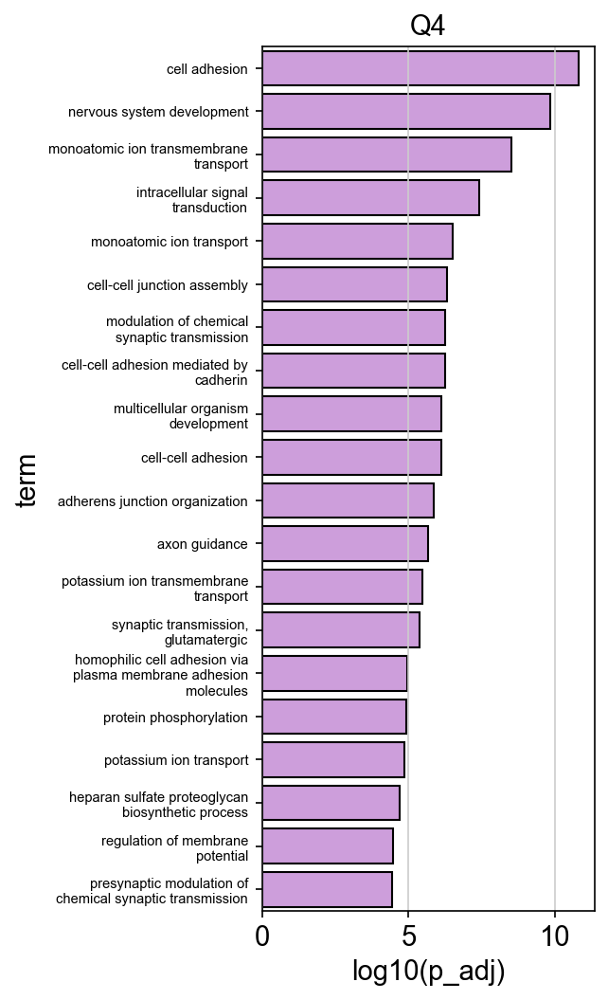

In [206]:
plt.figure(figsize = (3,8))

ax = sn.barplot(data = df4_test, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 30) for term in df4_test['term']], fontsize=7)
plt.title('Q4')
plt.show()

In [138]:
df4_test

,GO,term,class,p,p_corr,n_genes,n_study,n_go,study_genes,per,log10(p_adj)
0,GO:0034220,monoatomic ion transmembrane transport,biological_process,2.508870e-14,1.781314e-10,47,1034,331,"[Slc17a6, Cacnb2, Cacnb4, Kcnip2, Kcnk1, Kcnk2...",0.141994,9.749259
1,GO:0007155,cell adhesion,biological_process,3.843973e-12,1.595377e-08,62,1034,595,"[Pcdh9, Bcan, B4galt1, Lama2, Cdh11, Fap, Ccn2...",0.104202,7.797137
2,GO:0007275,multicellular organism development,biological_process,6.354572e-12,1.978019e-08,93,1034,1101,"[Apaf1, Epha5, Epha7, Farp1, 4930447C04Rik, Tm...",0.084469,7.703769
3,GO:0050804,modulation of chemical synaptic transmission,biological_process,1.475731e-11,3.674864e-08,26,1034,134,"[Ngf, Cdh11, Cdh2, Prkar2a, Prkar2b, Pde4a, Ep...",0.194030,7.434759
4,GO:0007399,nervous system development,biological_process,1.775181e-11,3.683796e-08,49,1034,423,"[Sema4b, Ina, Mdga2, Dcx, Nrp1, Fut9, Epha5, E...",0.115839,7.433704


#### Q4 example expression

In [132]:
subDE_df = pd.read_csv('Figure2_dfs/subDE_df_glut.csv', index_col=0)
subDE_df

,LF,p_adj,L2/3_P12,L2/3_P22,L4_P12,L4_P22,L5IT_P12,L5IT_P22,L5NP_P12,L5NP_P22,L5PT_P12,L5PT_P22,L6CT_P12,L6CT_P22,L6IT_P12,L6IT_P22,L6b_P12,L6b_P22
Gpc6,3.437667,0.000000e+00,0.945563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ccbe1,3.412357,0.000000e+00,0.239851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Igsf11,3.347765,0.000000e+00,0.298523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6530403H02Rik,3.179432,0.000000e+00,0.250904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Glra3,3.067032,2.879439e-307,0.207107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rundc3a,0.000904,9.987723e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.554545
Parp6,0.000570,9.995252e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.536364
Rnpep,0.000368,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.327273
Prpf6,0.000338,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.418182


In [53]:
q4_cell_adh = df4_test.iloc[1]['study_genes']

q4_transpor = df4_test.iloc[0]['study_genes']

In [147]:
subDE_df[subDE_df.index=='Pcdh9'].iloc[3].dropna().columns

LF          1.202126
p_adj       0.000000
L6CT_P22    1.000000
Name: Pcdh9, dtype: float64

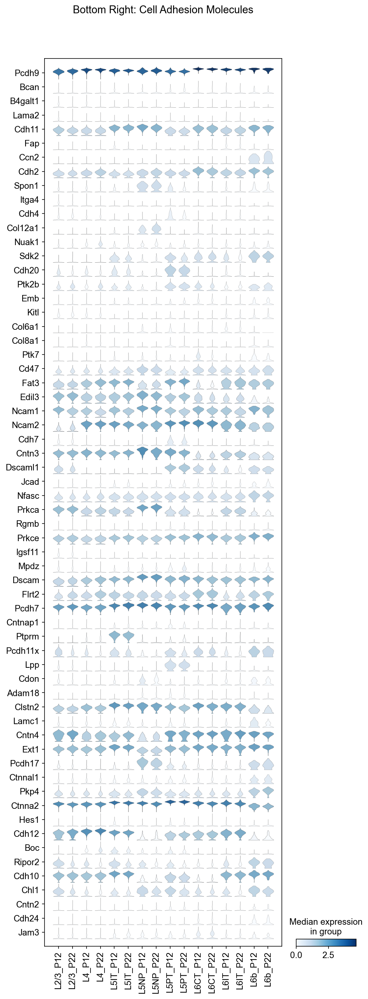

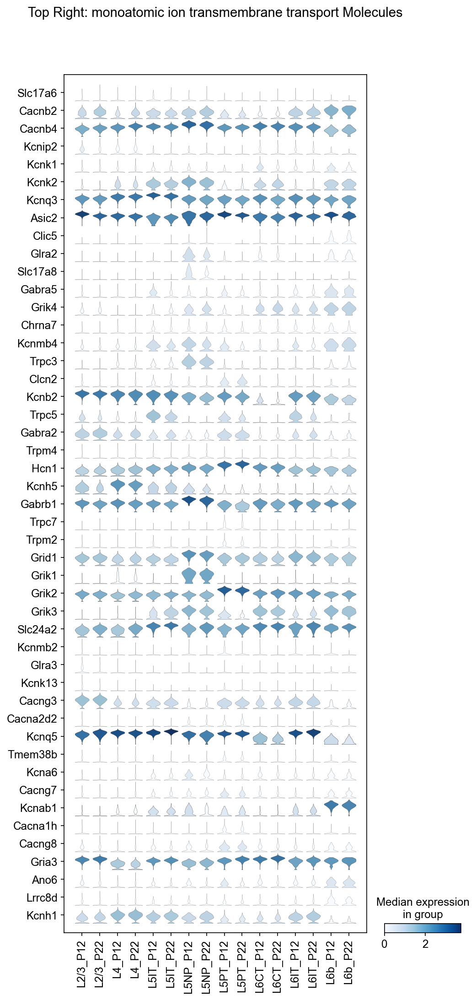

In [54]:
sc.pl.stacked_violin(gluta, var_names=q4_cell_adh, groupby='Subclass_age', swap_axes=True,
                    title='Bottom Right: Cell Adhesion Molecules')

sc.pl.stacked_violin(gluta, var_names=q4_transpor,groupby='Subclass_age', swap_axes=True,
                    title='Bottom Right: monoatomic ion transmembrane transport Molecules')

### Overlap analysis

In [215]:
df2.shape, df4.shape, df3.shape

((44, 11), (233, 11), (1281, 11))

In [212]:
df1.shape

(70, 11)

In [224]:
df1

,GO,term,class,p,p_corr,n_genes,n_study,n_go,study_genes,per,log10(p_adj)
0,GO:0007399,nervous system development,biological_process,2.010342e-14,2.463955e-10,25,218,423,"[Sema5a, Sema5b, Sema6a, Mdga1, Nav1, Nrp2, Me...",0.059102,9.608367
1,GO:0007411,axon guidance,biological_process,3.957843e-14,2.463955e-10,18,218,191,"[Gap43, Sema5a, Sema5b, Dpysl5, Sema6a, Robo1,...",0.094241,9.608367
2,GO:0007275,multicellular organism development,biological_process,7.386994e-10,2.311163e-06,32,218,1101,"[Sema5a, Sema5b, Sema6a, Mdga1, Nav1, Cdh13, N...",0.029064,5.636169
3,GO:0030154,cell differentiation,biological_process,7.424827e-10,2.311163e-06,30,218,978,"[Arhgef28, Sema5a, Sema5b, Sema6a, Mdga1, Nav1...",0.030675,5.636169
4,GO:0007156,homophilic cell adhesion via plasma membrane a...,biological_process,1.579860e-09,3.934168e-06,11,218,107,"[Robo1, Cdh13, Cntn5, Cntn6, Igsf9b, Sdk1, Ptp...",0.102804,5.405147
...,...,...,...,...,...,...,...,...,...,...,...
65,GO:0030215,semaphorin receptor binding,molecular_function,3.030022e-05,2.796710e-02,4,218,22,"[Sema6d, Sema5a, Sema5b, Sema6a]",0.181818,1.553353
66,GO:0005547,"phosphatidylinositol-3,4,5-trisphosphate binding",molecular_function,4.392418e-05,3.378502e-02,5,218,47,"[Iqgap2, Gab2, Cyth3, Arap2, Pla2g4e]",0.106383,1.471276
67,GO:0008046,axon guidance receptor activity,molecular_function,8.919333e-05,4.587210e-02,3,218,11,"[Sema5a, Robo1, Ephb2]",0.272727,1.338451
68,GO:0005005,transmembrane-ephrin receptor activity,molecular_function,8.919333e-05,4.587210e-02,3,218,11,"[Ephb2, Epha3, Epha10]",0.272727,1.338451


Text(0.5, 0.98, 'GO Term Overlap: CC, BP, MF')

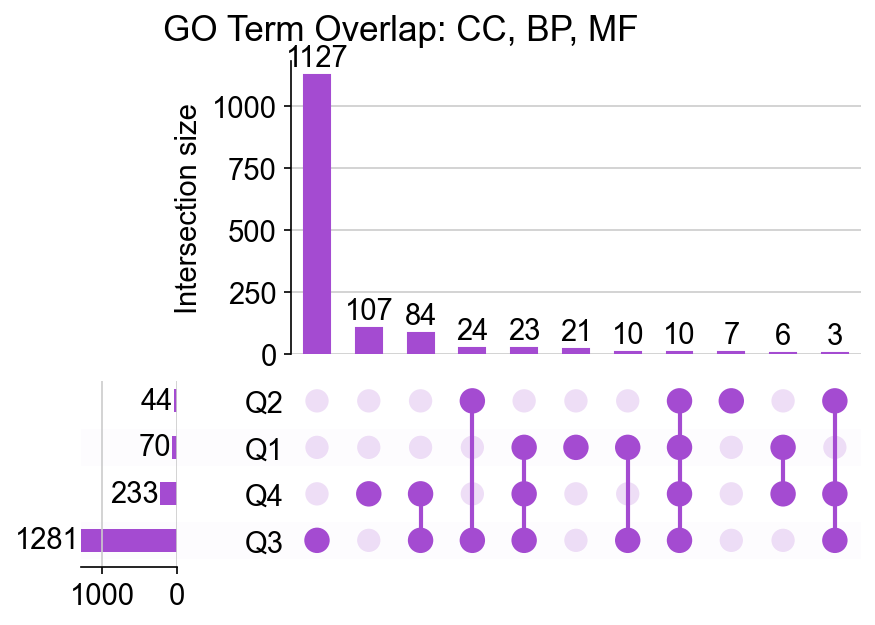

In [225]:
import upsetplot
#from upsetplot import query, UpSet
from upsetplot import UpSet

from upsetplot import UpSet


contents=dict()
for i,j in zip([df1,df2,df3,df4],['Q1', 'Q2', 'Q3', 'Q4']):
    contents[j]=list(i['term'].values)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='cardinality', show_counts=True, facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('GO Term Overlap: CC, BP, MF')

In [218]:
a

id
Q1    Q2    Q3    Q4              
True  False True  True  GO:0007399
                  True  GO:0007411
            False True  GO:0007275
                  True  GO:0030154
                  True  GO:0007156
...                            ...
False False False True  GO:0004993
                  True  GO:0005042
                  True  GO:0005546
                  True  GO:0047555
                  True  GO:0005003

[1422 rows x 1 columns]

In [226]:
q1q4 = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    #All true if global gene
    if (bool_array==(True, False, False, True)):
        q1q4.append(gene_name)

In [227]:
len(q1q4)

6

In [228]:
q1q4

['multicellular organism development',
 'cell differentiation',
 'homophilic cell adhesion via plasma membrane adhesion molecules',
 'cell adhesion',
 'monoatomic ion transmembrane transport',
 'calcium ion binding']

nervous system dev not found above b/c likely shared in more than just q1/q4

In [233]:
df1[df1['class']=='biological process']

,GO,term,class,p,p_corr,n_genes,n_study,n_go,study_genes,per,log10(p_adj)


Text(0.5, 0.98, 'GO Term Overlap: Biological Process')

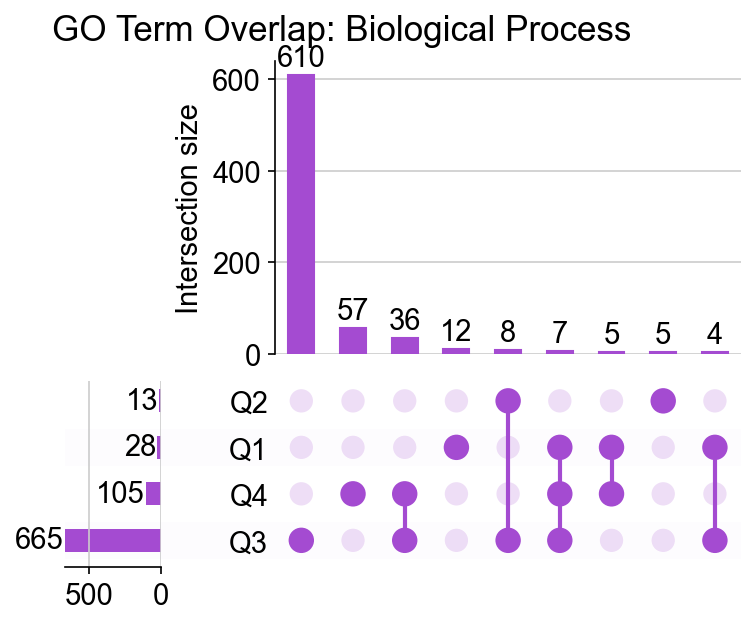

In [240]:
import upsetplot
#from upsetplot import query, UpSet
from upsetplot import UpSet

from upsetplot import UpSet


contents=dict()
for i,j in zip([df1,df2,df3,df4],['Q1', 'Q2', 'Q3', 'Q4']):
    contents[j]=list(i[i['class']=='biological_process']['term'].values)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='cardinality', show_counts=True, facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('GO Term Overlap: Biological Process')

In [241]:
a

id
Q1    Q2    Q3    Q4                                                     
True  False True  True                         nervous system development
                  True                                      axon guidance
            False True                 multicellular organism development
                  True                               cell differentiation
                  True  homophilic cell adhesion via plasma membrane a...
...                                                                   ...
False False False True                   SMAD protein signal transduction
                  True                                response to ethanol
                  True                            cell-substrate adhesion
                  True                                        innervation
                  True  respiratory gaseous exchange by respiratory sy...

[744 rows x 1 columns]

In [242]:
q4 = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    #All true if global gene
    if (bool_array==(False, False, False, True)):
        q4.append(gene_name)

In [246]:
q4

['cell-cell junction assembly',
 'cell-cell adhesion mediated by cadherin',
 'cell-cell adhesion',
 'adherens junction organization',
 'potassium ion transmembrane transport',
 'potassium ion transport',
 'heparan sulfate proteoglycan biosynthetic process',
 'presynaptic modulation of chemical synaptic transmission',
 'calcium-dependent cell-cell adhesion via plasma membrane cell adhesion molecules',
 'central nervous system neuron differentiation',
 'cAMP-mediated signaling',
 'regulation of presynapse assembly',
 'signal transduction',
 'protein O-linked glycosylation',
 'axonal fasciculation',
 'retina layer formation',
 'focal adhesion assembly',
 'calcium ion transmembrane transport',
 'actin filament network formation',
 'adenylate cyclase-activating G protein-coupled receptor signaling pathway',
 'negative regulation of synaptic transmission, glutamatergic',
 'retinal ganglion cell axon guidance',
 'regulation of presynaptic cytosolic calcium ion concentration',
 'paranodal junc

In [247]:
df4

,GO,term,class,p,p_corr,n_genes,n_study,n_go,study_genes,per,log10(p_adj)
0,GO:0007155,cell adhesion,biological_process,1.252966e-15,1.560068e-11,58,768,595,"[Pcdh9, Cdh11, Ccn2, Cdh2, Spon1, Cdh4, Col12a...",0.097479,10.806856
1,GO:0007399,nervous system development,biological_process,2.322732e-14,1.446017e-10,46,768,423,"[Ina, Mdga2, Dcx, Nrp1, Fut9, Epha5, Epha7, Ne...",0.108747,9.839827
2,GO:0034220,monoatomic ion transmembrane transport,biological_process,7.451376e-13,3.092569e-09,38,768,331,"[Kcng1, Cacnb2, Cacnb4, Kcnip2, Kcnk1, Kcnk2, ...",0.114804,8.509681
3,GO:0035556,intracellular signal transduction,biological_process,1.253202e-11,3.900904e-08,39,768,379,"[Sik3, Mast4, Dcx, Cblb, Ccn2, Rps6ka2, Arhgef...",0.102902,7.408835
4,GO:0006811,monoatomic ion transport,biological_process,1.300894e-10,3.239486e-07,49,768,601,"[Slc30a3, Kcng1, Slc4a7, Cacnb2, Stim2, Cacnb4...",0.081531,6.489524
...,...,...,...,...,...,...,...,...,...,...,...
229,GO:0005042,netrin receptor activity,molecular_function,4.693630e-04,4.332220e-02,3,768,6,"[Dcc, Unc5d, Unc5c]",0.500000,1.363289
230,GO:0005546,"phosphatidylinositol-4,5-bisphosphate binding",molecular_function,5.139502e-04,4.650746e-02,10,768,96,"[Gsdme, Frmpd4, Myo1b, Sh3pxd2a, Hcn1, Pard3, ...",0.104167,1.332477
231,GO:0019901,protein kinase binding,molecular_function,5.540518e-04,4.917210e-02,32,768,569,"[Ptk2, Cacnb2, Dcx, Cacnb4, Prkag1, Cblb, Nrp1...",0.056239,1.308281
232,GO:0047555,"3',5'-cyclic-GMP phosphodiesterase activity",molecular_function,5.706667e-04,4.951857e-02,5,768,24,"[Pde1a, Pde4a, Pde4d, Pde9a, Pde8b]",0.208333,1.305232


# Subclass-by-subclass tDE

Generated in `P12vsP22-Sham_SavioDown.ipynb`

In [20]:
gluta = sc.read_h5ad('h5ads/gluta_P12+P22_DEready.h5ad')
gaba = sc.read_h5ad('h5ads/gaba_P12+P22_DEready.h5ad')

In [21]:
gluta.raw.X, gaba.raw.X

(<40093x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 116283976 stored elements in Compressed Sparse Row format>,
 <6670x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 19166027 stored elements in Compressed Sparse Row format>)

In [22]:
gluta.X, gaba.X

(array([[ 0.5195494 , -0.8049637 ,  0.04953125, ..., -0.0306499 ,
         -0.06588266,  0.44697964],
        [-1.6120892 ,  0.12095492, -0.8413386 , ..., -0.0306499 ,
         -0.06588266,  1.4092367 ],
        [-1.7151699 ,  1.4382818 ,  1.5397938 , ..., -0.0306499 ,
         -0.06588266, -2.7754142 ],
        ...,
        [ 1.257541  ,  1.0675536 ,  1.3462217 , ..., -0.02980283,
         -0.0457631 , -1.7165705 ],
        [ 0.89106584, -0.65716344,  1.1611084 , ..., -0.02980283,
         -0.0457631 , -1.7165705 ],
        [ 0.0821954 , -0.65716344, -0.62299365, ..., -0.02980283,
         -0.0457631 ,  0.98064333]], dtype=float32),
 array([[ 0.9640887 ,  1.1326189 ,  0.10325068, ..., -0.0306499 ,
         -0.06588266,  0.2536928 ],
        [ 1.6442639 ,  1.3817092 ,  2.0626898 , ..., -0.0306499 ,
         -0.06588266,  1.223628  ],
        [ 0.77089715,  0.65923035,  2.61428   , ..., -0.0306499 ,
         -0.06588266, -0.85268515],
        ...,
        [ 0.7664891 ,  2.5471127 , -0.6

In [23]:
gluta.X = gluta.raw.X
gaba.X = gaba.raw.X

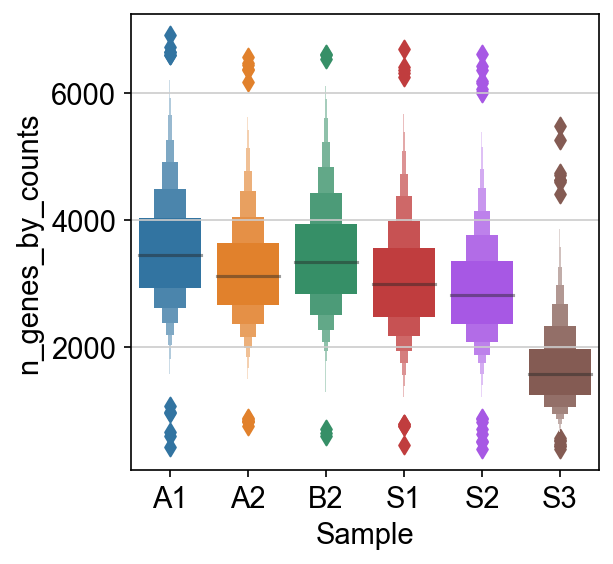

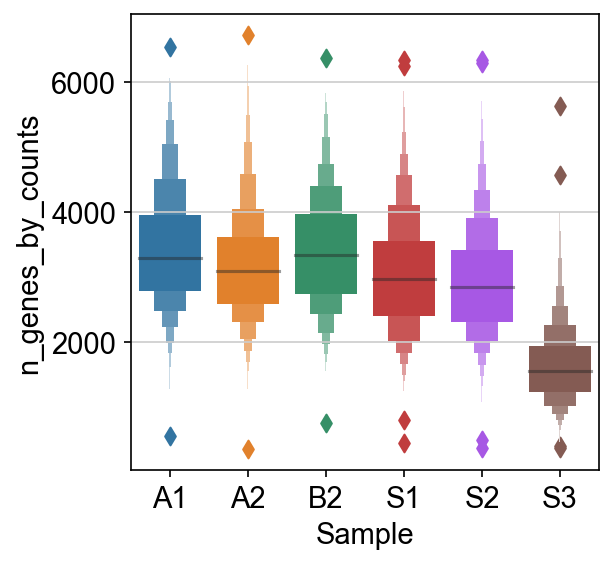

In [24]:
sn.boxenplot(data=gluta.obs, x='Sample', y='n_genes_by_counts')
plt.show()
sn.boxenplot(data=gaba.obs, x='Sample', y='n_genes_by_counts')

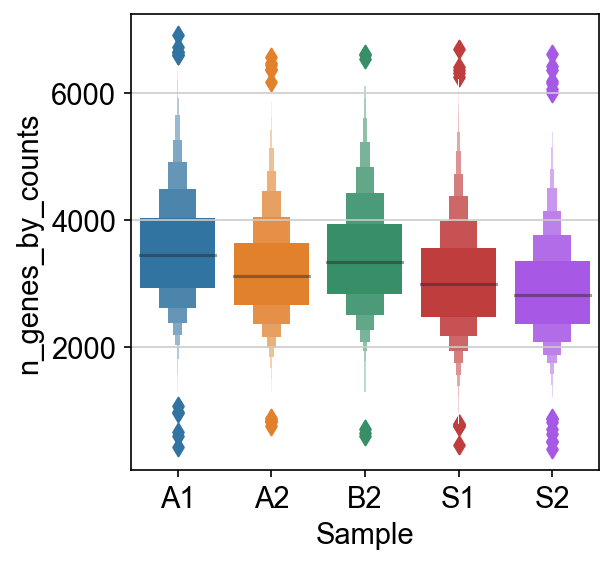

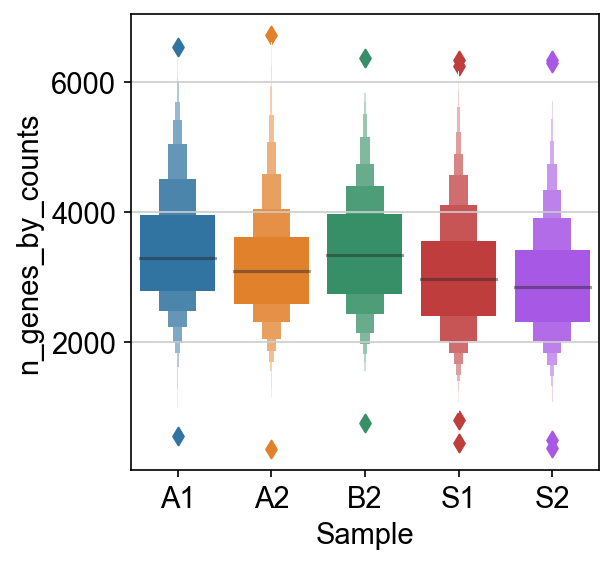

In [25]:
gluta = gluta[gluta.obs.Sample!='S3']
gaba = gaba[gaba.obs.Sample!='S3']
sn.boxenplot(data=gluta.obs, x='Sample', y='n_genes_by_counts')
plt.show()
sn.boxenplot(data=gaba.obs, x='Sample', y='n_genes_by_counts')

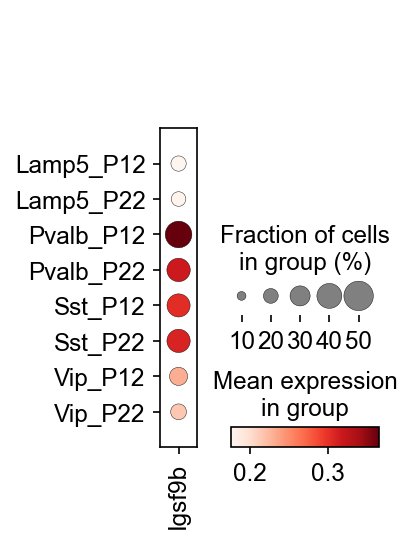

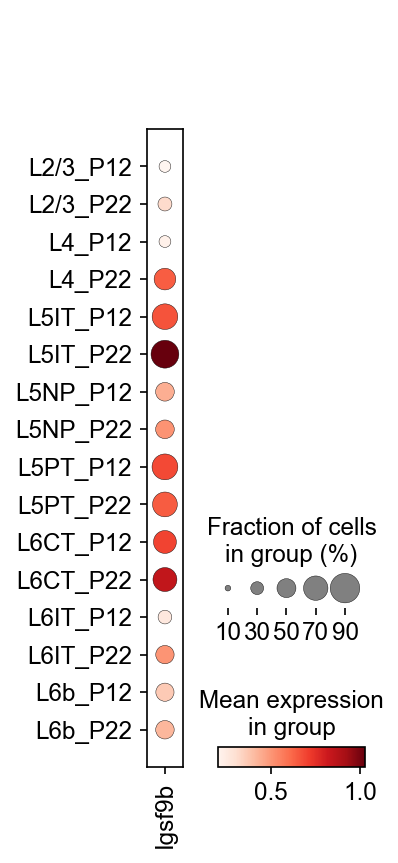

In [24]:
sc.pl.dotplot(gaba, var_names=['Igsf9b'],
                     groupby='Subclass_age',)
sc.pl.dotplot(gluta, var_names=['Igsf9b'],
                     groupby='Subclass_age')

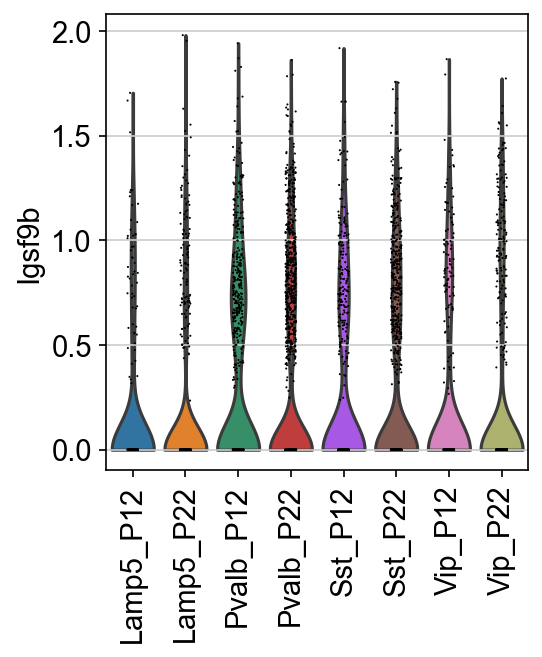

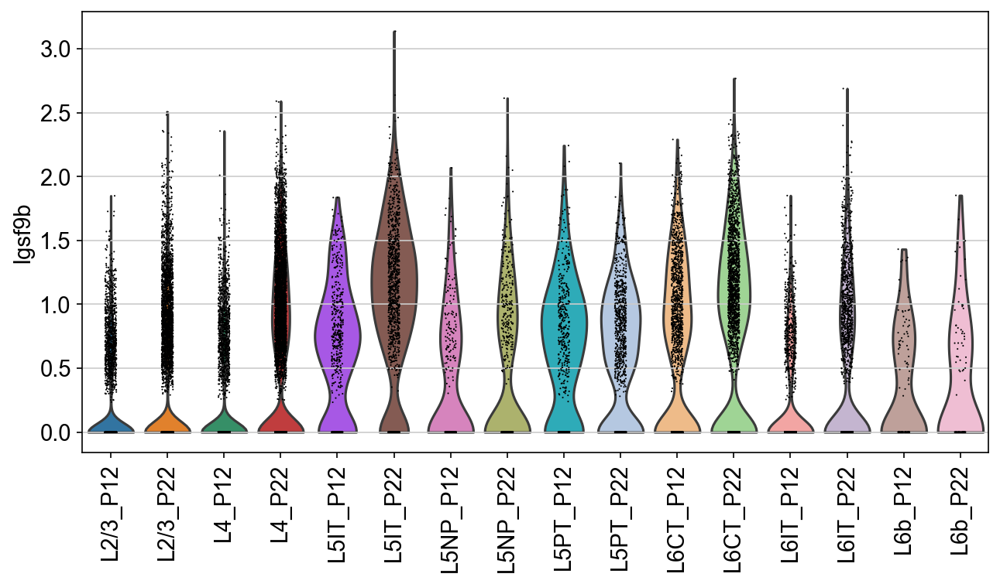

In [30]:
sc.pl.violin(gaba, keys=['Igsf9b'],
                     groupby='Subclass_age', rotation=90,)
fig,axs = plt.subplots(figsize=(10,5))
sc.pl.violin(gluta, keys=['Igsf9b'],
                     groupby='Subclass_age', rotation=90, ax=axs, show=False)

In [12]:
gluta = gluta[:,~gluta.var_names.str.startswith('Rp')].copy()
gluta = gluta[:,~gluta.var_names.str.startswith('mt')].copy()
gluta = gluta[:,~gluta.var_names.str.startswith('Gm')].copy()
gluta = gluta[:,~gluta.var_names.str.startswith('AC')].copy()

gaba = gaba[:,~gaba.var_names.str.startswith('Rp')].copy()
gaba = gaba[:,~gaba.var_names.str.startswith('mt')].copy()
gaba = gaba[:,~gaba.var_names.str.startswith('Gm')].copy()
gaba = gaba[:,~gaba.var_names.str.startswith('AC')].copy()

**must reset .raw attribute b/c the bad genes still there and DE() uses raw.**

In [20]:
gluta.raw.X.shape, gluta.X.shape

((32639, 21258), (32639, 17285))

In [21]:
gluta.raw = gluta
gaba.raw = gaba

In [23]:
gluta.raw.X, gaba.raw.X

(<32639x17285 sparse matrix of type '<class 'numpy.float32'>'
 	with 97812325 stored elements in Compressed Sparse Row format>,
 <5462x17285 sparse matrix of type '<class 'numpy.float32'>'
 	with 16177849 stored elements in Compressed Sparse Row format>)

In [61]:
DE() does use_raw=True

SyntaxError: invalid syntax (4062285061.py, line 1)

In [24]:
gluta_dict_P12 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:
    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=1)
    #df = df[df['LF']<4]
    gluta_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    #gluta_dict_P12[i+'_P12'] = df

del df
gluta_dict_P22 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:

    df = DE(gluta[gluta.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=1)
    
    #df = df[df['LF']<4]
    gluta_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    #gluta_dict_P22[i+'_P22'] = df

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
53 226
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
10 139


In [25]:
gaba_dict_P12 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                               obs_id_test='P12', ref='rest', pts_thresh=0.4, lf_thresh=1)
    #df = df[df['LF']<4]
    gaba_dict_P12[i+'_P12'] = df[df['p_adj']<0.05]
    #gaba_dict_P12[i+'_P12'] = df
    
del df

gaba_dict_P22 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba[gaba.obs['Subclass']==i,:], obs_id='batch', 
                              obs_id_test='P22', ref='rest', pts_thresh=0.4, lf_thresh=1)  
    #df = df[df['LF']<4]
    gaba_dict_P22[i+'_P22'] = df[df['p_adj']<0.05]
    #gaba_dict_P22[i+'_P22'] = df

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


### Diagnose P12>P22 and P22>P12

If these plots all overlap, that means there's no subclass-specific bias driving any subclass-specific DE results below

In [26]:
def three_cdfs(dict_in,cond):  
    fig, axs = plt.subplots(1,3, figsize=(12,4))
    dict_in_sizes = []
    for i in dict_in.keys():
        dict_in_sizes.append(dict_in[i].shape[0])
        sn.kdeplot(dict_in[i][cond], label=i, cumulative=True, ax=axs[0])   
    axs[0].legend()
    axs[0].set_xlabel('Fraction of cells exp in '+cond)


    for i in dict_in.keys():
        sn.kdeplot(dict_in[i]['LF'], label=i, cumulative=True, ax=axs[1]) 
    axs[1].legend()
    axs[1].set_xlabel('log2FC in '+cond)


    for i in dict_in.keys():
        sn.kdeplot(dict_in[i]['p_adj'], label=i, cumulative=True, ax=axs[2])
    axs[2].legend()
    axs[2].set_xlabel('p_adj in '+cond)

    plt.tight_layout()

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/statsmodels/sandbox/nonparametric/kernels.py:520: RuntimeWarning: overflow encountered in square
  np.exp(-x**2/2.0), h = h, domain = None, norm = 1.0)
/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/statsmodels/sandbox/nonparametric/kernels.py:520: RuntimeWarning: overflow encountered in square
  np.exp(-x**2/2.0), h = h, domain = None, norm = 1.0)


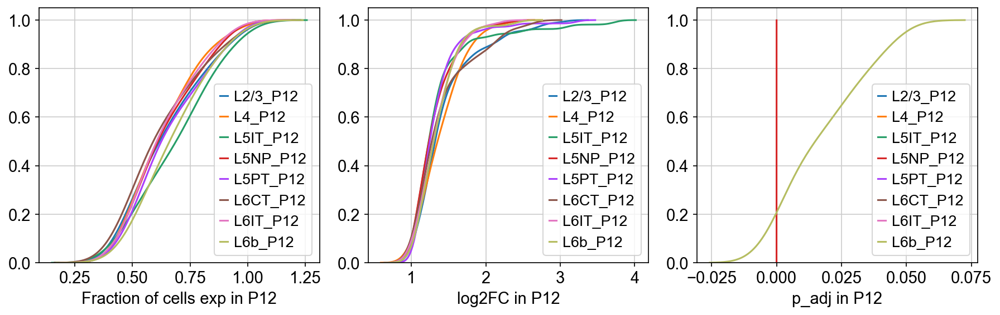

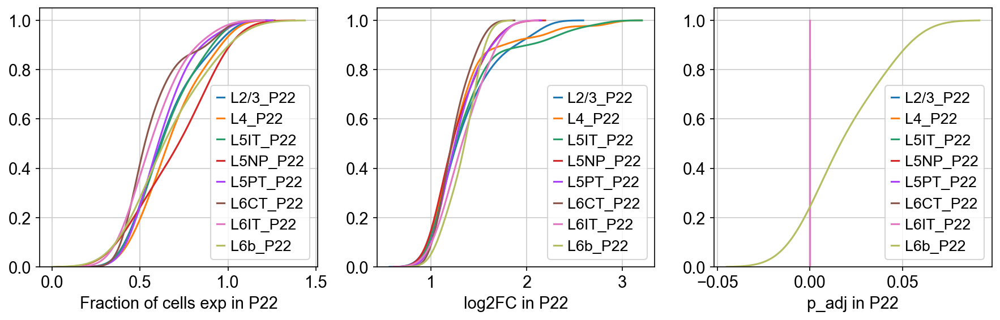

In [27]:
three_cdfs(dict_in=gluta_dict_P12, cond='P12')
three_cdfs(dict_in=gluta_dict_P22, cond='P22')

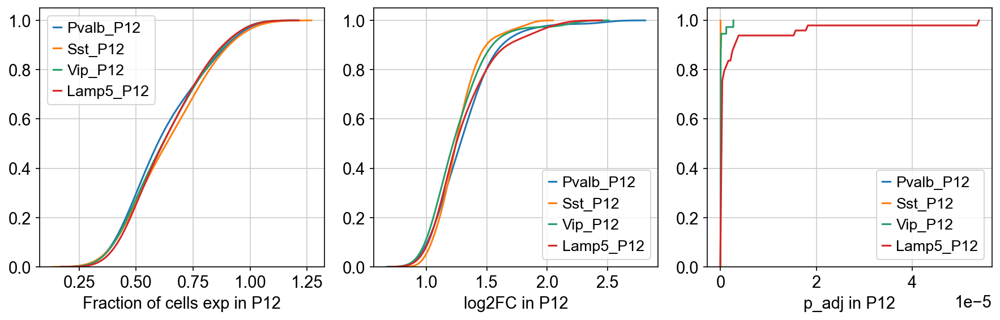

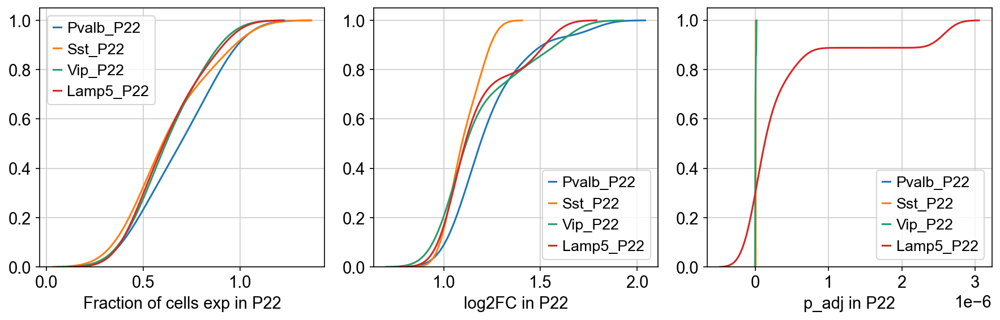

In [28]:
three_cdfs(dict_in=gaba_dict_P12, cond='P12')
three_cdfs(dict_in=gaba_dict_P22, cond='P22')

In [29]:
gluta_dict_P12.keys()

dict_keys(['L2/3_P12', 'L4_P12', 'L5IT_P12', 'L5NP_P12', 'L5PT_P12', 'L6CT_P12', 'L6IT_P12', 'L6b_P12'])

In [30]:
#new
for i in gluta_dict_P12:
    print(gluta_dict_P12[i].shape[0])

88
65
54
79
72
61
46
41


### Overlap analysis P12>P22

In [31]:
import upsetplot
#from upsetplot import query, UpSet
from upsetplot import UpSet

In [32]:
from upsetplot import UpSet

In [33]:
glugab12 = gluta_dict_P12
glugab12.update(gaba_dict_P12)

Text(0.5, 0.98, 'P12>P22')

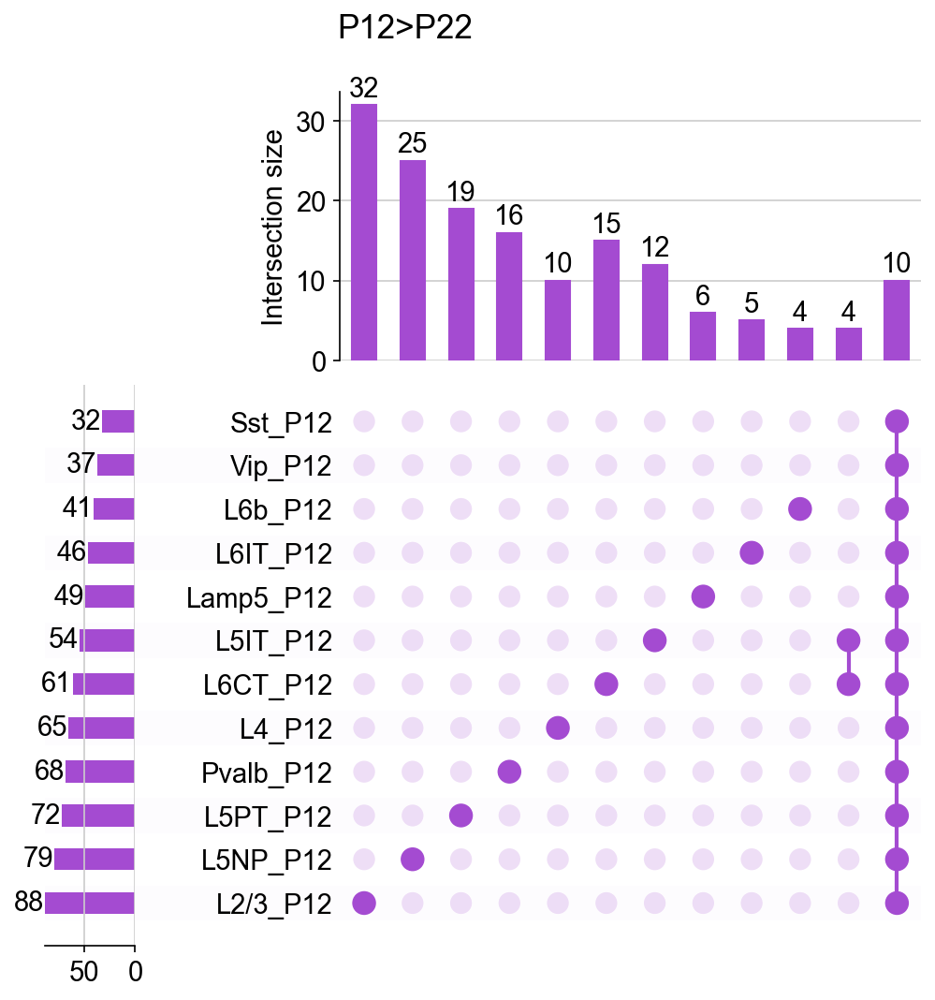

In [53]:
contents=dict()
for i in glugab12:
    contents[i]=list(glugab12[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True,min_subset_size=4
               , facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('P12>P22')

(0.0, 155.0)

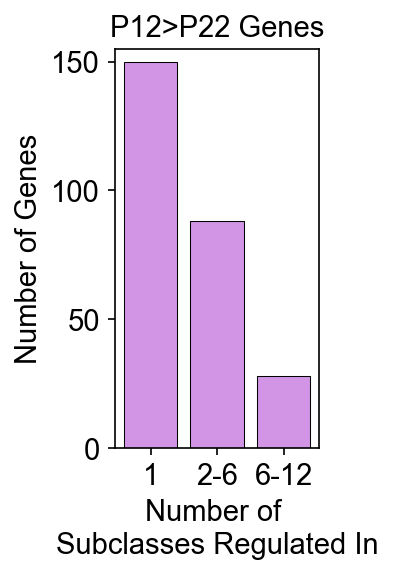

In [54]:
singular = []
medium = []
shared = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true in (2,3,4,5,6,)):
        medium.append(gene_name)
    else:
        shared.append(gene_name)

plt.figure(figsize=(1.75,3.5))
plt.bar(['1',
        '2-6', '6-12', ], [len(singular),len(medium), len(shared), ],
       color='#D294E5', linewidth=0.5, edgecolor='black')
plt.ylabel('Number of Genes')
plt.title('P12>P22 Genes')
plt.xlabel('Number of \nSubclasses Regulated In')
plt.grid(False)
plt.ylim([0,155])
#plt.savefig('figures/P12>P22_barplot.pdf', bbox_inches='tight')

In [55]:
[len(singular),len(medium), len(shared), ],

([150, 88, 28],)

In [56]:
P12_genes = []
for i in glugab12:
    P12_genes = P12_genes + list(glugab12[i].index)
P12_genes = list(set(P12_genes))
print(len(P12_genes))
for i in P12_genes:
    if ('Rik'not in i):
        print(i)

266
Frmd3
Syt17
Hip1
Atp5e
Igsf21
Camkv
Dpysl3
Met
Asxl3
Cntn5
Ranbp17
Ptn
Cox6b1
Prkd1
Fmn1
Ybx1
Fgd4
Plppr1
Mir670hg
Lix1
Ghr
Angpt1
Grip1
Hs6st1
Sema5b
Kcnip4
Atp5g1
Uqcr11
Taf1d
Add3
Rnasek
Ndufa7
Dnah14
Mgst3
Rasgrp2
Tomm7
Hapln1
Cntnap4
Atp5md
Cdh8
Ppp1r14c
Kcnip1
Dpysl5
Slit2
Cxadr
Cacna1g
Tmem91
Atp5mpl
Nasp
Ndufa1
Srgap3
Dcc
Dab1
Nrip3
Tmem108
Atp5l
Wscd2
Thsd7a
Fabp5
Kirrel3
Dok5
Lingo2
Syndig1
Kcnk10
Prkcg
Cwh43
Grik1
Lhfpl3
C2cd2
Dbi
Ppfibp1
Uqcrb
Nr4a3
Crmp1
Tmsb10
Sema6d
Cntnap5c
Lrch1
Miat
Caln1
Slain1
Slc44a5
Fam126a
Klhl1
Fau
Syn3
Ndufb1-ps
Mtss1
Adam19
Caly
L1cam
Nav1
Ubl5
Klf8
Ano4
Pla2g4e
Cox7a2
Auts2
Srgap1
Sfmbt2
Dstn
Prkg1
Egfem1
Efcab6
Cntnap3
Adgra3
Pdzrn4
Nrbp2
Rasal1
Myo16
Syt6
Sh3d19
Kcnt2
Rgma
Samd5
St3gal1
Ly6h
Chn2
Necab1
Sdk1
Ust
Shisa9
Atp5k
L3mbtl4
Col23a1
Maml3
Tiam1
Tmem178b
Cdh18
Arhgef28
Atp2b4
Ndufa4
Sema5a
Trpm3
Ttc28
Shb
Adamts3
Eda
Stx1a
Gab2
Maoa
Fhit
Ndufa3
St6galnac3
Elob
Tubb3
Mdga1
Kctd8
Adarb2
Tuba1a
Neo1
Plcxd3
Col5a1
March11
Gria1
Fstl5

In [57]:
L23_genes = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    #All true if global gene
    if (bool_array==(True, False, False, False, False, False, False, False, False, False, False, False)):
        L23_genes.append(gene_name)

In [58]:
len(L23_genes)

32

In [42]:
for i in L23_genes:
    print(i)

Rhbdl3
Sfmbt2
Met
Vwc2l
Pitpnc1
Fam126a
Sgcd
Npnt
Raver2
Ust
Ccbe1
Nrip3
Nckap5
Mdga1
Arhgef28
Rfx3
Klhl1
Eda
Ano4
Lrch1
Gab2
Ranbp17
Utrn
6530403H02Rik
Tenm1
Ppfibp1
Gabrg3
Thsd7a
Slain1
Fmn1
Asxl3
Neo1


### Overlap analysis P22>P12

In [44]:
glugab22 = gluta_dict_P22
glugab22.update(gaba_dict_P22)

Text(0.5, 0.98, 'P22>P12')

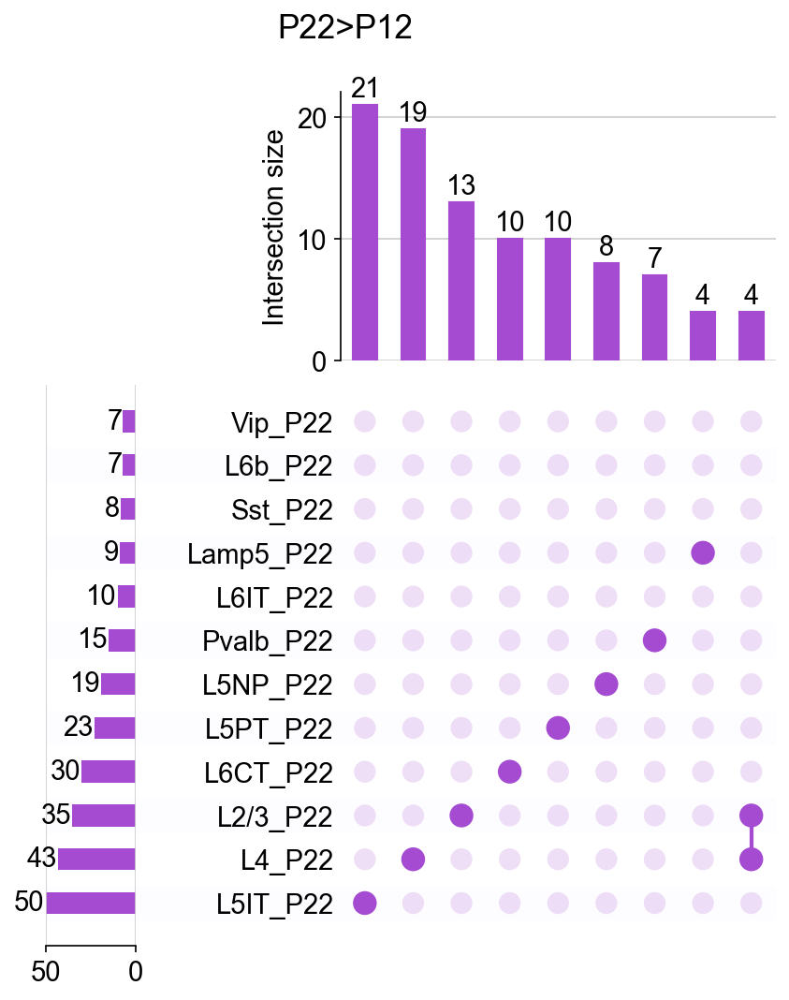

In [45]:
contents=dict()
for i in glugab22:
    contents[i]=list(glugab22[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True,min_subset_size=4, facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('P22>P12')

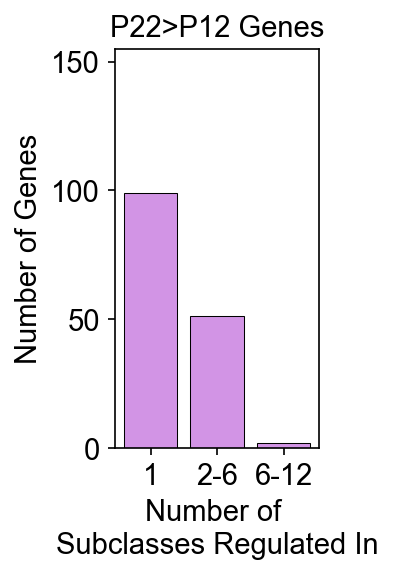

In [48]:
singular = []
medium = []
shared = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true in (2,3,4,5,6,)):
        medium.append(gene_name)
    else:
        shared.append(gene_name)
        
plt.figure(figsize=(1.75,3.5))
plt.bar(['1',
        '2-6', '6-12', ], [len(singular),len(medium), len(shared), ],
        color='#D294E5', linewidth=0.5, edgecolor='black')
plt.ylabel('Number of Genes')
plt.title('P22>P12 Genes')
plt.xlabel('Number of \nSubclasses Regulated In')
plt.ylim([0,155])
plt.grid(False)
#plt.savefig('figures/P22>P12_barplot.pdf', bbox_inches='tight')

In [47]:
[len(singular),len(medium), len(shared), ]

[99, 51, 2]

In [ ]:
150, 88, 28, 99, 51, 2

In [49]:
# Summing the given numbers
numbers = [150, 88, 28, 99, 51, 2]
sum_of_numbers = sum(numbers)
sum_of_numbers


418

In [50]:
P22_genes = []
for i in glugab22:
    P22_genes = P22_genes + list(glugab22[i].index)
P22_genes = list(set(P22_genes))
print(len(P22_genes))
for i in P22_genes:
    print(i)

152
Faim2
Slc50a1
Cobl
Tnr
Dnajc21
Fmn1
Pde4b
Alcam
Prickle1
Vxn
Tox
Tfdp2
Epha10
Rhobtb2
Npas3
Slc35f3
Rab26
Arap2
Ptprt
Xylt1
Pcgf5
1700085D07Rik
Ctnna3
Shisa4
Zbtb16
Exph5
2210408F21Rik
Rgs17
Pde7b
Cpne9
Sept4
Cabp1
Nrip3
Gfra2
Aifm3
Capn2
Atp1b3
Dgkb
Gria4
Epb41
Nefm
Lncpint
Kctd16
Gsg1l
Malat1
Trank1
Nxpe4
Kctd1
Sorcs1
Smyd3
9630014M24Rik
Col25a1
Kcnd3
Purb
Atf6
Dgkz
Wls
Ppip5k2
Stx16
Camk2a
Parm1
Ppme1
Ppp1r16b
Sgpp2
Plp1
1110008P14Rik
Zeb1
Itpr1
Pdp1
Elmo1
Slit3
Dkk3
Il1rap
Igsf9b
Kcna2
Scn1b
Frmd6
Arpp19
Mast3
Sdk1
Ndrg2
Maml3
Stard8
Nxph1
Oxr1
Sntb2
Nrsn1
Fstl4
Slc35f4
Sgcz
Fbxl16
Inf2
Iqgap2
Per3
Col19a1
Dpy19l1
Ankrd33b
4933424G05Rik
Scn9a
Kctd8
Mkx
Smad3
Ptpn3
Sorcs3
Cacna2d3
Mypn
Tsnax
Aldoc
Pde10a
Arhgef25
Nr3c2
Arhgap42
Lrrk2
Vip
Iqsec3
Grm3
Camk2n1
Adgrb1
Tanc1
Scube1
Etl4
Xkr6
Irf2
6430590A07Rik
Kcnc2
Gad1
Trhde
Specc1
Car10
Mbp
Neto1
Zmat4
Cmss1
Arhgap10
Itpka
Lyzl4
Cpeb1
Mgll
Runx2
Marf1
Tyro3
2900097C17Rik
Pvalb
Nell1
Glul
Kcnc1
Rsph10b
Prkag2
Kcnip3
Lars2
Cdc14b
Ra

In [51]:
L23_genes = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    #All true if global gene
    if (bool_array==(True, False, False, False, False, False, False, False, False, False, False, False)):
        L23_genes.append(gene_name)

In [52]:
len(L23_genes)

13

In [32]:
for i in L23_genes:
    print(i)

Smad3
Stard8
Zbtb16
Epha10
Shisa4
Kctd8
Elmo1
Gsg1l
Prickle1
Gm16351
Frmd6
Grm3
Dgkb
Gm28376
Ppme1


### Save DE dicts

In [59]:
import pickle

In [60]:
with open('Figure2_dfs/Fig2_glugab12.pkl', 'wb') as file:
    pickle.dump(glugab12, file)


In [61]:
with open('Figure2_dfs/Fig2_glugab22.pkl', 'wb') as file:
    pickle.dump(glugab22, file)


In [4]:
#how to read
with open('Figure2_dfs/Fig2_glugab22.pkl', 'rb') as file:
    glugab22 = pickle.load(file)

In [3]:
#how to read
with open('Figure2_dfs/Fig2_glugab12.pkl', 'rb') as file:
    glugab12 = pickle.load(file)

In [6]:
master_L23 = ['Tsnax', 'Rfx3',  #TFs
              'Cntn5', 'Mdga1', 'Tenm1', 'Cdh13', 'Epha10','Lrch1',#CSMs
             'Ryr3', #ICs
             'Col19a1', 'Sorcs3', 'Gabrg3', 'Klhl1', 'Gpc5', 'Cpne8',#Rest
             ]

In [9]:
glugab22['L2/3_P22'].loc['Specc1']['LF']

2.156893730163574

In [5]:
for g in master_L23:
    for i in glugab22:
        df = glugab22[i]
        
        if(g in df.index):
            

{'L2/3_P22':                     P22        LF          p_adj
 Specc1         0.636858  2.156894   0.000000e+00
 Etl4           0.866211  2.126900   0.000000e+00
 Dnajc21        0.450335  2.051888   0.000000e+00
 Sorcs3         0.802176  1.869873   0.000000e+00
 Tsnax          0.567941  1.737047   0.000000e+00
 Pdp1           0.435686  1.642421  3.068673e-216
 Col19a1        0.782227  1.617732   0.000000e+00
 Plp1           0.686663  1.593391   0.000000e+00
 Gm42418        0.997210  1.563366   0.000000e+00
 Ankrd33b       0.648438  1.518279  1.100195e-302
 Sgcz           0.966239  1.456314   0.000000e+00
 Smad3          0.464146  1.425459  2.259684e-183
 Mgll           0.421038  1.413084  3.584598e-160
 Gm46367        0.722098  1.408682   0.000000e+00
 Stard8         0.435965  1.395277  1.191234e-160
 Sntb2          0.520089  1.368370  2.086527e-193
 Zbtb16         0.511579  1.343458  3.715596e-181
 Epha10         0.501535  1.292301  1.162074e-162
 Shisa4         0.473912  1.277907  1.

## Save Table

In [31]:
#how to read
with open('Figure2_dfs/Fig2_glugab22.pkl', 'rb') as file:
    glugab22 = pickle.load(file)

#how to read
with open('Figure2_dfs/Fig2_glugab12.pkl', 'rb') as file:
    glugab12 = pickle.load(file)

In [33]:
import pandas as pd
import re

def sanitize_sheet_name(sheet_name):
    # Replace invalid characters with an underscore or another character of your choice
    sanitized_name = re.sub(r'[\\/*?:\[\]]', '_', sheet_name)
    return sanitized_name[:31]

file_path = 'Tables/TableS2.xlsx'

with pd.ExcelWriter(file_path, engine='xlsxwriter') as writer:
    for sheet_name, df in glugab12.items():
        sanitized_name = sanitize_sheet_name(sheet_name+'>P22')
        df.columns = ["% Cells Expressing", 'log2fold-change'] + df.columns.tolist()[2:]
        df.to_excel(writer, sheet_name=sanitized_name, index=True)
    for sheet_name, df in glugab22.items():
        # Sanitize the sheet name before writing
        sanitized_name = sanitize_sheet_name(sheet_name+'>P12')
        # Change the first column name to "Percent Cells Expressing"
        df.columns = ["% Cells Exp", 'log2fold-change'] + df.columns.tolist()[2:]
        # Write the DataFrame to the corresponding sheet
        df.to_excel(writer, sheet_name=sanitized_name, index=True)

## Intersection with Type markers

In [5]:
#how to read
with open('Figure2_dfs/Fig2_glugab22.pkl', 'rb') as file:
    glugab22 = pickle.load(file)

#how to read
with open('Figure2_dfs/Fig2_glugab12.pkl', 'rb') as file:
    glugab12 = pickle.load(file)

In [6]:
P22_glut = sc.read_h5ad('h5ads_cmprsd/P22Sham_glut_v3.h5ad')
P22_gaba = sc.read_h5ad('h5ads_cmprsd/P22Sham_gaba_v3.h5ad')

In [15]:
def sub_marks(adata, subclass):
    subclass = adata[adata.obs['Type'].str.startswith(subclass),:].copy()
    subclass = subclass[subclass.obs['Sample']!='S3',:]
    
    subclass_marks = []
    for i in subclass.obs['Type'].values.categories:
        subclass_marks = subclass_marks+ list(DE(subclass,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=1).index)
    return subclass_marks

In [16]:
L23 = sub_marks(P22_glut, 'L2/3')

/Users/salwanbutrus/opt/anaconda3/envs/xgb_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


In [17]:
L23

['6530403H02Rik',
 'Cdh13',
 'Adamts2',
 'Gpc5',
 'Gm20713',
 'Arhgef28',
 'Itga8',
 'Camk2d',
 'Raver2',
 'Thsd7a',
 'Robo1',
 'Igsf11',
 'Tox3',
 'Ust',
 'Tenm1',
 'Ryr3',
 'Glra3',
 'Cntn5',
 'Eda',
 'Mgat4c',
 'Rfx3',
 '5730522E02Rik',
 'Kirrel3',
 'Dscaml1',
 'Gpc6',
 'Meis2',
 'Atp2b4',
 'Iqgap2',
 'Zbtb20',
 'Qrfpr',
 'Nfib',
 'Cdh4',
 'Man1a',
 'Epha3',
 'Peak1',
 'Tiam1',
 'Grm1',
 'Cpne8',
 'Gabrg3',
 'Nrip1',
 'Gm49678',
 'Prkcg',
 'Gm26871',
 'March1',
 'Slc7a14',
 'Nell1',
 'Sorcs3',
 'Trpc6',
 'Sox5',
 'Rorb',
 'Zmat4',
 'Gm2164',
 'Cadps2',
 'Mcc',
 'Prr16',
 'Kcnh5',
 'Myo16',
 'Cdh12',
 'Ncam2',
 'Kctd8',
 'Cdh20',
 'Man2a1',
 'Elavl2',
 'Ntng1',
 'Aifm3',
 'Scube1',
 'Dlc1',
 'Osbpl3',
 'Sdk1',
 'Epha10',
 'Rcan2',
 'Astn2',
 'Fmn1',
 'Kcnq5',
 'Robo3',
 'Cpne4',
 'Sema6d',
 'Cntnap2',
 'Mkx',
 'Egfem1',
 'A330102I10Rik',
 'Cntn4',
 'Dpy19l1',
 'Sel1l3',
 'Zfp385b',
 'Schip1',
 'Lcorl',
 'Alcam',
 'Pid1',
 'Foxp1',
 'Tmem200a',
 'Lhfp',
 'Cntnap5b',
 'Gm15155',
 'Cdh1

In [26]:
inter_fracs = []
for subclass_ in ['L2/3', 'L4', 'L5NP', 'L6CT', 'L6IT']:
    marks = sub_marks(P22_glut, subclass_)
    inter_P12 = len(set(glugab12[subclass_+'_P12'].index).intersection(set(marks)))
    inter_P22 = len(set(glugab22[subclass_+'_P22'].index).intersection(set(marks)))
    print(subclass_, (inter_P12+inter_P22)/len(marks))
    inter_fracs.append((inter_P12+inter_P22)/len(marks))

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
L2/3 0.21782178217821782
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
L4 0.07425742574257425
159 171
127 134
313 917
L5NP 0.049800796812749
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
L6CT 0.09900990099009901
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
L6IT 0.02727272727272727


In [27]:
for subclass_ in ['Pvalb', 'Sst', 'Vip', 'Lamp5' ]:
    marks = sub_marks(P22_gaba, subclass_)
    inter_P12 = len(set(glugab12[subclass_+'_P12'].index).intersection(set(marks)))
    inter_P22 = len(set(glugab22[subclass_+'_P22'].index).intersection(set(marks)))
    print(subclass_, (inter_P12+inter_P22)/len(marks))
    inter_fracs.append((inter_P12+inter_P22)/len(marks))

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
101 105
cutoffs are good at 1.5 FC level
161 349
Pvalb 0.038461538461538464
194 201
153 161
147 166
166 189
112 156
204 260
159 228
175 431
308 754
Sst 0.004549590536851683
cutoffs are good at 1.5 FC level
156 172
400 513
182 231
54 345
Vip 0.02
236 238
123 144
261 310
Lamp5 0.016260162601626018


Text(0, 0.5, 'Fraction of Markers tDE')

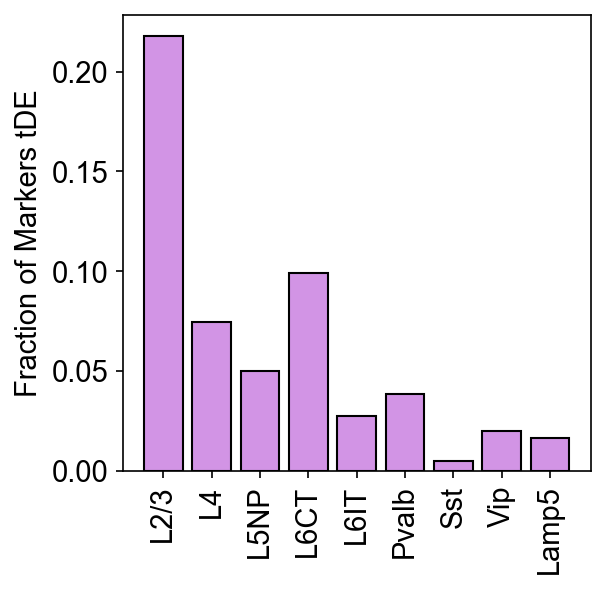

In [28]:
plt.bar(['L2/3', 'L4', 'L5NP', 'L6CT', 'L6IT', 'Pvalb', 'Sst', 'Vip', 'Lamp5'], 
        inter_fracs, color='#D294E5', linewidth=1, edgecolor='black')
plt.grid(False)
plt.xticks(rotation=90)
plt.ylabel('Fraction of Markers tDE')